# Follow-Me Project
Congratulations on reaching the final project of the Robotics Nanodegree! 

Previously, you worked on the Semantic Segmentation lab where you built a deep learning network that locates a particular human target within an image. For this project, you will utilize what you implemented and learned from that lab and extend it to train a deep learning model that will allow a simulated quadcopter to follow around the person that it detects! 

Most of the code below is similar to the lab with some minor modifications. You can start with your existing solution, and modify and improve upon it to train the best possible model for this task.

You can click on any of the following to quickly jump to that part of this notebook:
1. [Data Collection](#data)
2. [FCN Layers](#fcn)
3. [Build the Model](#build)
4. [Training](#training)
5. [Prediction](#prediction)
6. [Evaluation](#evaluation)

## Data Collection<a id='data'></a>
We have provided you with a starting dataset for this project. Download instructions can be found in the README for this project's repo.
Alternatively, you can collect additional data of your own to improve your model. Check out the "Collecting Data" section in the Project Lesson in the Classroom for more details!

In [1]:
import os
import glob
import sys
import tensorflow as tf

from scipy import misc
import numpy as np

from tensorflow.contrib.keras.python import keras
from tensorflow.contrib.keras.python.keras import layers, models

from tensorflow import image

from utils import scoring_utils
from utils.separable_conv2d import SeparableConv2DKeras, BilinearUpSampling2D
from utils import data_iterator
from utils import plotting_tools 
from utils import model_tools

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"]="1"

## FCN Layers <a id='fcn'></a>
In the Classroom, we discussed the different layers that constitute a fully convolutional network (FCN). The following code will introduce you to the functions that you need to build your semantic segmentation model.

### Separable Convolutions
The Encoder for your FCN will essentially require separable convolution layers, due to their advantages as explained in the classroom. The 1x1 convolution layer in the FCN, however, is a regular convolution. Implementations for both are provided below for your use. Each includes batch normalization with the ReLU activation function applied to the layers. 

In [3]:
def separable_conv2d_batchnorm(input_layer, filters, strides=1):
    output_layer = SeparableConv2DKeras(filters=filters,kernel_size=3, strides=strides,
                             padding='same', activation='relu')(input_layer)
    
    output_layer = layers.BatchNormalization()(output_layer) 
    return output_layer

def conv2d_batchnorm(input_layer, filters, kernel_size=3, strides=1):
    output_layer = layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=strides, 
                      padding='same', activation='relu')(input_layer)
    
    output_layer = layers.BatchNormalization()(output_layer) 
    return output_layer

def vgg_max_pooling_layer(input_layer) :
    output_layer = layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2))(input_layer)
    return output_layer

### Bilinear Upsampling
The following helper function implements the bilinear upsampling layer. Upsampling by a factor of 2 is generally recommended, but you can try out different factors as well. Upsampling is used in the decoder block of the FCN.

In [4]:
def bilinear_upsample(input_layer):
    output_layer = BilinearUpSampling2D((2,2))(input_layer)
    return output_layer

## Build the Model <a id='build'></a>
In the following cells, you will build an FCN to train a model to detect and locate the hero target within an image. The steps are:
- Create an `encoder_block`
- Create a `decoder_block`
- Build the FCN consisting of encoder block(s), a 1x1 convolution, and decoder block(s).  This step requires experimentation with different numbers of layers and filter sizes to build your model.

### Encoder Block
Create an encoder block that includes a separable convolution layer using the `separable_conv2d_batchnorm()` function. The `filters` parameter defines the size or depth of the output layer. For example, 32 or 64. 

In [5]:
def encoder_block(input_layer, filters, strides):
    
    # TODO Create a separable convolution layer using the separable_conv2d_batchnorm() function.
    output_layer = separable_conv2d_batchnorm(input_layer, filters, strides=strides)
    return output_layer

### Decoder Block
The decoder block is comprised of three parts:
- A bilinear upsampling layer using the upsample_bilinear() function. The current recommended factor for upsampling is set to 2.
- A layer concatenation step. This step is similar to skip connections. You will concatenate the upsampled small_ip_layer and the large_ip_layer.
- Some (one or two) additional separable convolution layers to extract some more spatial information from prior layers.

In [6]:
def decoder_block(small_ip_layer, large_ip_layer, filters):
    
    # TODO Upsample the small input layer using the bilinear_upsample() function.
    upsampled_layer = bilinear_upsample(small_ip_layer)
    # TODO Concatenate the upsampled and large input layers using layers.concatenate
    output_layer = layers.concatenate([upsampled_layer, large_ip_layer])
    # TODO Add some number of separable convolution layers
    output_layer = separable_conv2d_batchnorm(output_layer, filters)
    return output_layer

### Model

Now that you have the encoder and decoder blocks ready, go ahead and build your FCN architecture! 

There are three steps:
- Add encoder blocks to build the encoder layers. This is similar to how you added regular convolutional layers in your CNN lab.
- Add a 1x1 Convolution layer using the conv2d_batchnorm() function. Remember that 1x1 Convolutions require a kernel and stride of 1.
- Add decoder blocks for the decoder layers.

In [7]:
def fcn_model_base(inputs, num_classes):
    
    # TODO Add Encoder Blocks. 
    # Remember that with each encoder layer, the depth of your model (the number of filters) increases.
    output_layer = encoder_block(inputs, 64, 2)
    # TODO Add 1x1 Convolution layer using conv2d_batchnorm().
    small_ip_layer = conv2d_batchnorm(output_layer, 64, kernel_size=1, strides=1)
    
    # TODO: Add the same number of Decoder Blocks as the number of Encoder Blocks
    x = decoder_block(small_ip_layer, inputs, 64)
    
    # The function returns the output layer of your model. "x" is the final layer obtained from the last decoder_block()
    return layers.Conv2D(num_classes, 3, activation='softmax', padding='same')(x)

In [8]:
def fcn_model_var1(inputs, num_classes):
    
    # TODO Add Encoder Blocks. 
    # Remember that with each encoder layer, the depth of your model (the number of filters) increases.
    conv1 = encoder_block(inputs, 32, 2)
    conv2 = encoder_block(conv1, 64, 2)
    conv3 = encoder_block(conv2, 128, 2)
    
    # TODO Add 1x1 Convolution layer using conv2d_batchnorm().
    conv_norm = conv2d_batchnorm(conv3, 256, kernel_size=1, strides=1)
    
    # TODO: Add the same number of Decoder Blocks as the number of Encoder Blocks
    deconv1 = decoder_block(conv_norm, conv2, 128)
    deconv2 = decoder_block(deconv1, conv1, 64)
    x = decoder_block(deconv2, inputs, 32)
    
    # The function returns the output layer of your model. "x" is the final layer obtained from the last decoder_block()
    return layers.Conv2D(num_classes, 3, activation='softmax', padding='same')(x)

In [9]:
def fcn_model_var2(inputs, num_classes):
    
    # TODO Add Encoder Blocks. 
    # Remember that with each encoder layer, the depth of your model (the number of filters) increases.
    conv1 = encoder_block(inputs, 32, 2)
    conv2 = encoder_block(conv1, 64, 2)
    conv3 = encoder_block(conv2, 128, 2)
    conv4 = encoder_block(conv3, 256, 2)
    # TODO Add 1x1 Convolution layer using conv2d_batchnorm().
    conv_norm = conv2d_batchnorm(conv4, 512, kernel_size=1, strides=1)
    
    # TODO: Add the same number of Decoder Blocks as the number of Encoder Blocks
    deconv1 = decoder_block(conv_norm, conv3, 256)
    deconv2 = decoder_block(deconv1, conv2, 128)
    deconv3 = decoder_block(deconv2, conv1, 64)
    x = decoder_block(deconv3, inputs, 32)
    
    # The function returns the output layer of your model. "x" is the final layer obtained from the last decoder_block()
    return layers.Conv2D(num_classes, 3, activation='softmax', padding='same')(x)

In [10]:
def fcn_model_vgg(inputs, num_classes) :
    conv1 = encoder_block(inputs, 32, 1)
    pool1 = vgg_max_pooling_layer(conv1)
    
    conv2 = encoder_block(pool1, 64, 1)
    pool2 = vgg_max_pooling_layer( conv2)
    
    conv3 = encoder_block(pool2, 128, 1)
    conv4 = encoder_block(conv3, 128, 1)
    pool3 = vgg_max_pooling_layer( conv4)
    
    conv5 = encoder_block(pool3, 256, 1)
    conv6 = encoder_block(conv5, 256, 1)
    pool4 = vgg_max_pooling_layer( conv6)
    
    conv7 = encoder_block(pool4, 256, 1)
    conv8 = encoder_block(conv7, 256, 1)
    pool5 = vgg_max_pooling_layer( conv8)
    
    mid = conv2d_batchnorm(pool5, 512, 1)
    
    deconv1 = decoder_block(mid, pool4, 256)
    deconv2 = decoder_block(deconv1, pool3, 256)
    deconv3 = decoder_block(deconv2, pool2, 128)
    deconv4 = decoder_block(deconv3, pool1, 64)
    
    x = decoder_block(deconv4, inputs, 32 )
    return layers.Conv2D(num_classes, 3, activation = 'softmax', padding = 'same')(x)

## Training <a id='training'></a>
The following cells will use the FCN you created and define an ouput layer based on the size of the processed image and the number of classes recognized. You will define the hyperparameters to compile and train your model.

Please Note: For this project, the helper code in `data_iterator.py` will resize the copter images to 160x160x3 to speed up training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""

image_hw = 160
image_shape = (image_hw, image_hw, 3)
inputs = layers.Input(image_shape)
num_classes = 3

# Call fcn_model()
output_layer = fcn_model_var1(inputs, num_classes)

### Hyperparameters
Define and tune your hyperparameters.
- **batch_size**: number of training samples/images that get propagated through the network in a single pass.
- **num_epochs**: number of times the entire training dataset gets propagated through the network.
- **steps_per_epoch**: number of batches of training images that go through the network in 1 epoch. We have provided you with a default value. One recommended value to try would be based on the total number of images in training dataset divided by the batch_size.
- **validation_steps**: number of batches of validation images that go through the network in 1 epoch. This is similar to steps_per_epoch, except validation_steps is for the validation dataset. We have provided you with a default value for this as well.
- **workers**: maximum number of processes to spin up. This can affect your training speed and is dependent on your hardware. We have provided a recommended value to work with. 

In [29]:
learning_rate = 0.001
batch_size = 32
num_epochs = 5
steps_per_epoch = 200
validation_steps = 50
workers = 2
number_of_gpus = 2

In [10]:
import time
start = time.time()

Epoch 1/5
199/200 [============================>.] - ETA: 0s - loss: 0.2756

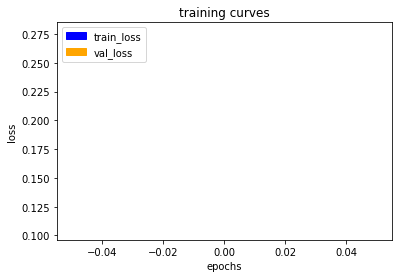

200/200 [==============================] - 170s - loss: 0.2746 - val_loss: 0.1048
Epoch 2/5
199/200 [============================>.] - ETA: 0s - loss: 0.0583

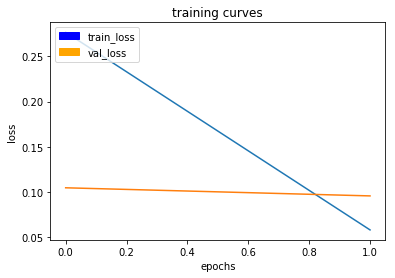

200/200 [==============================] - 173s - loss: 0.0583 - val_loss: 0.0959
Epoch 3/5
199/200 [============================>.] - ETA: 0s - loss: 0.0536

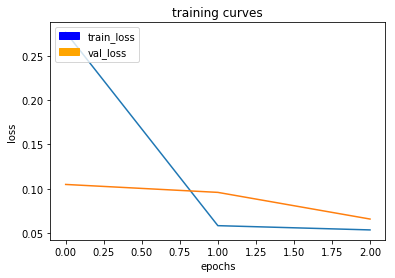

200/200 [==============================] - 171s - loss: 0.0536 - val_loss: 0.0658
Epoch 4/5
199/200 [============================>.] - ETA: 0s - loss: 0.0505

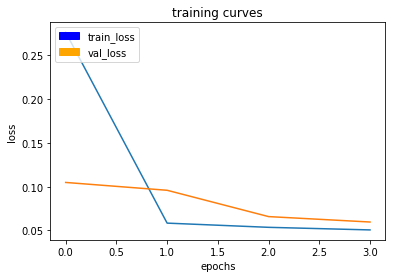

200/200 [==============================] - 167s - loss: 0.0505 - val_loss: 0.0596
Epoch 5/5
199/200 [============================>.] - ETA: 0s - loss: 0.0485

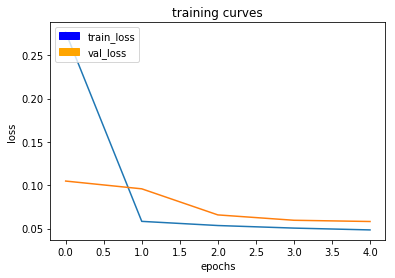

200/200 [==============================] - 166s - loss: 0.0485 - val_loss: 0.0582


In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size * number_of_gpus,
                                               data_folder=os.path.join('..', 'data', 'train_combined'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size * number_of_gpus,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [12]:
end = time.time()

In [13]:
print(end - start)

851.4363024234772


In [10]:
learning_rate = 0.001
batch_size = 32
num_epochs = 15
steps_per_epoch = 200
validation_steps = 50
workers = 2
number_of_gpus = 2

In [11]:
import time
start = time.time()

Epoch 1/15
199/200 [============================>.] - ETA: 0s - loss: 0.3193

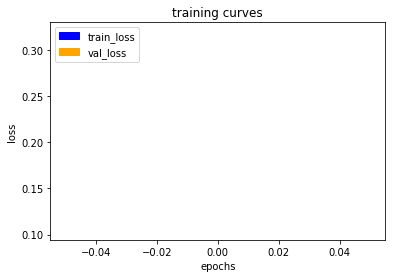

200/200 [==============================] - 101s - loss: 0.3179 - val_loss: 0.1050
Epoch 2/15
199/200 [============================>.] - ETA: 0s - loss: 0.0434

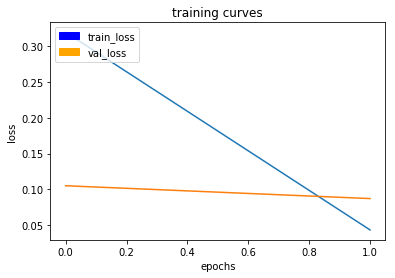

200/200 [==============================] - 98s - loss: 0.0434 - val_loss: 0.0871
Epoch 3/15
199/200 [============================>.] - ETA: 0s - loss: 0.0354

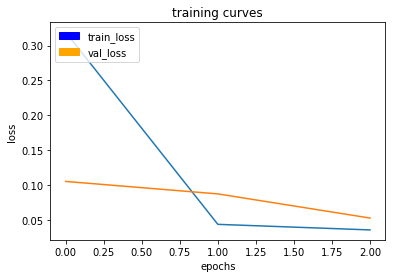

200/200 [==============================] - 99s - loss: 0.0354 - val_loss: 0.0524
Epoch 4/15
199/200 [============================>.] - ETA: 0s - loss: 0.0316

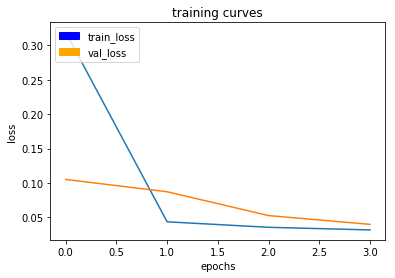

200/200 [==============================] - 97s - loss: 0.0316 - val_loss: 0.0397
Epoch 5/15
199/200 [============================>.] - ETA: 0s - loss: 0.0289

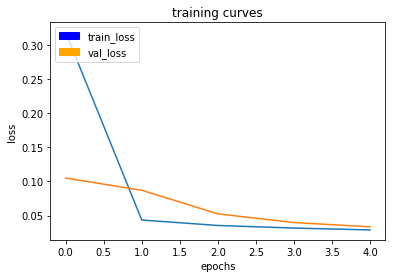

200/200 [==============================] - 96s - loss: 0.0289 - val_loss: 0.0334
Epoch 6/15
199/200 [============================>.] - ETA: 0s - loss: 0.0269

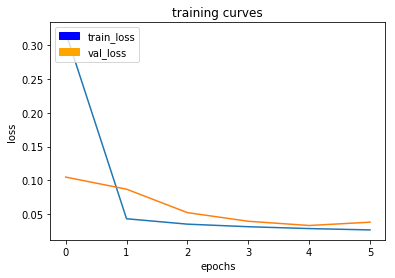

200/200 [==============================] - 97s - loss: 0.0269 - val_loss: 0.0383
Epoch 7/15
199/200 [============================>.] - ETA: 0s - loss: 0.0254

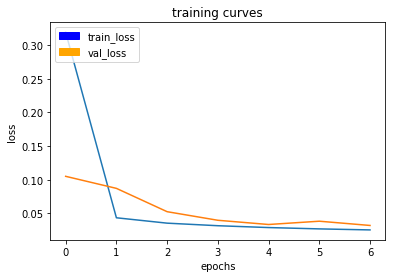

200/200 [==============================] - 96s - loss: 0.0254 - val_loss: 0.0320
Epoch 8/15
199/200 [============================>.] - ETA: 0s - loss: 0.0236

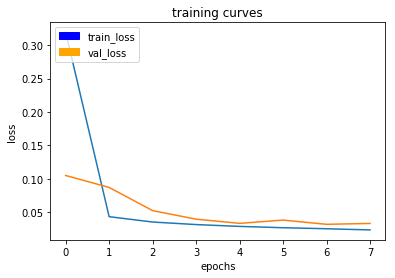

200/200 [==============================] - 97s - loss: 0.0236 - val_loss: 0.0333
Epoch 9/15
199/200 [============================>.] - ETA: 0s - loss: 0.0230

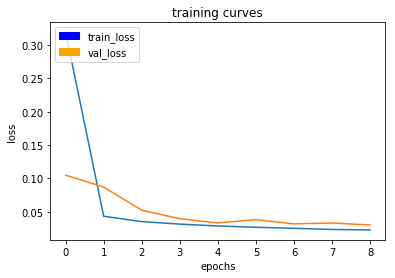

200/200 [==============================] - 97s - loss: 0.0230 - val_loss: 0.0303
Epoch 10/15
199/200 [============================>.] - ETA: 0s - loss: 0.0225

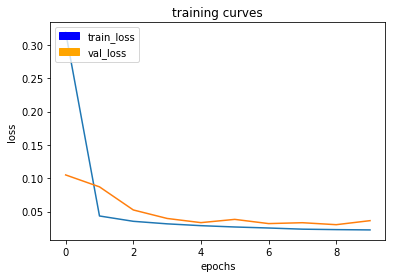

200/200 [==============================] - 96s - loss: 0.0225 - val_loss: 0.0364
Epoch 11/15
199/200 [============================>.] - ETA: 0s - loss: 0.0214

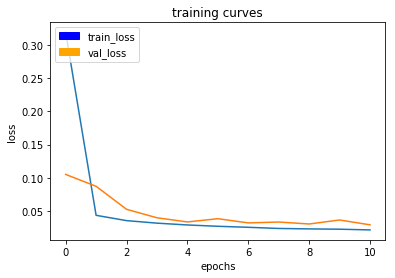

200/200 [==============================] - 96s - loss: 0.0214 - val_loss: 0.0291
Epoch 12/15
199/200 [============================>.] - ETA: 0s - loss: 0.0202

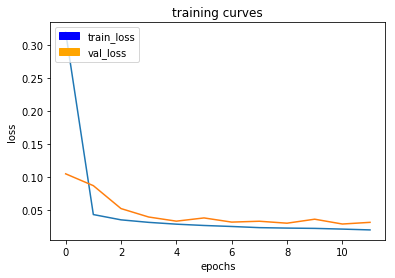

200/200 [==============================] - 97s - loss: 0.0202 - val_loss: 0.0316
Epoch 13/15
199/200 [============================>.] - ETA: 0s - loss: 0.0194

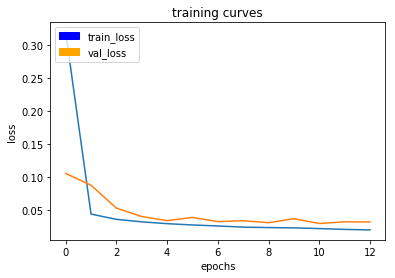

200/200 [==============================] - 97s - loss: 0.0194 - val_loss: 0.0315
Epoch 14/15
199/200 [============================>.] - ETA: 0s - loss: 0.0190

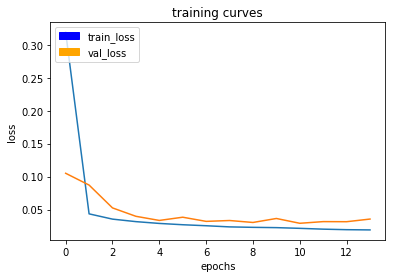

200/200 [==============================] - 96s - loss: 0.0190 - val_loss: 0.0355
Epoch 15/15
199/200 [============================>.] - ETA: 0s - loss: 0.0188

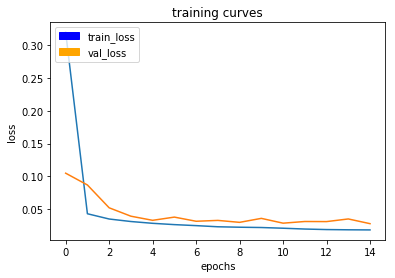

200/200 [==============================] - 97s - loss: 0.0188 - val_loss: 0.0283


In [12]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size * number_of_gpus,
                                               data_folder=os.path.join('..', 'data', 'train_combined'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size * number_of_gpus,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [13]:
end = time.time()

In [14]:
print(end - start)

1465.8845927715302


In [15]:
# Save your trained model weights
weight_file_name = 'model_weights'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [16]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [17]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

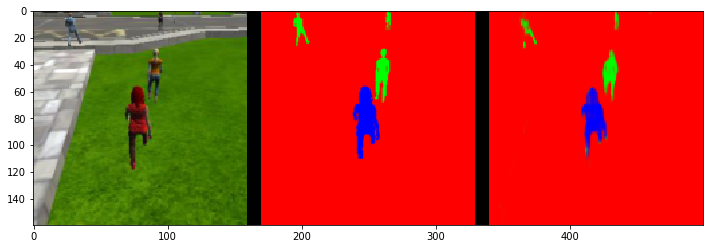

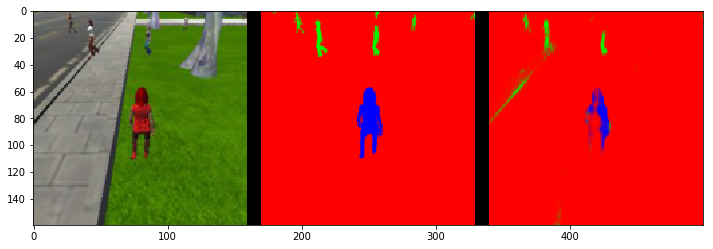

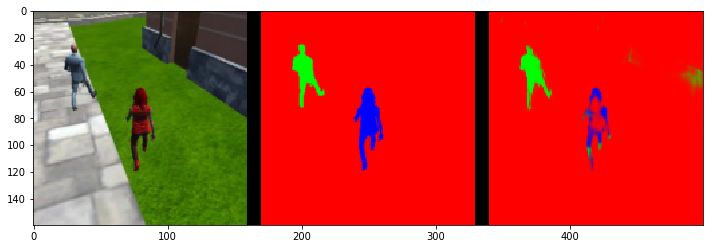

In [18]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

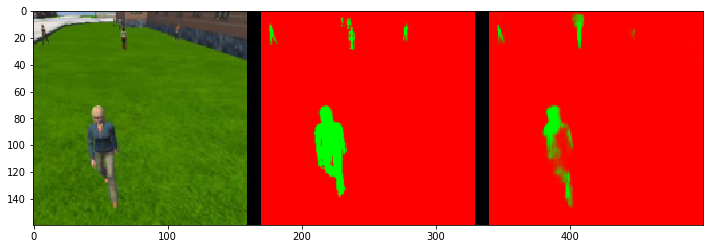

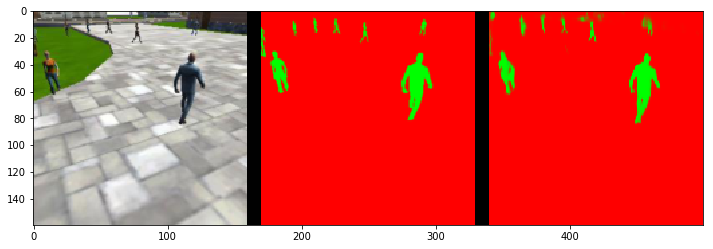

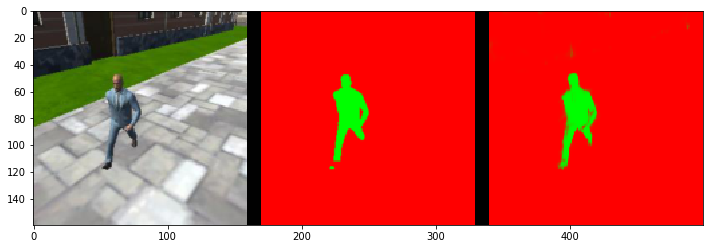

In [19]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

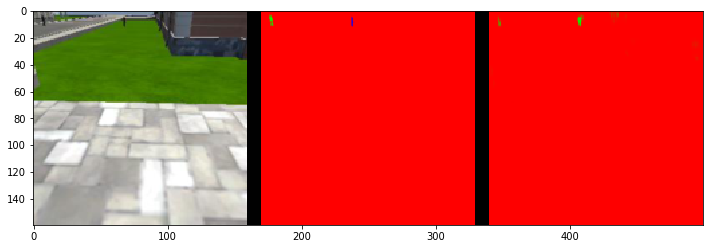

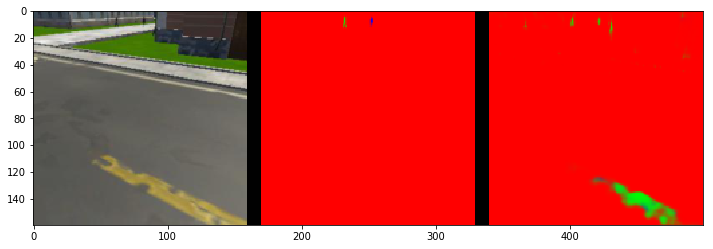

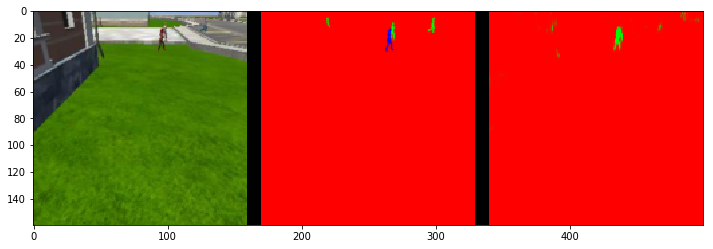

In [20]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [21]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.993101853008314
average intersection over union for other people is 0.30176520916612726
average intersection over union for the hero is 0.7951057108849502
number true positives: 538, number false positives: 0, number false negatives: 1


In [22]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9839578978414028
average intersection over union for other people is 0.6743459875958381
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 52, number false negatives: 0


In [23]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9952384186796834
average intersection over union for other people is 0.3860262710783594
average intersection over union for the hero is 0.10358434741042047
number true positives: 84, number false positives: 1, number false negatives: 217


In [24]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.696528555431131


In [25]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.4493450291476853


In [26]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.3129816440423967


In [28]:
learning_rate = 0.001
batch_size = 128
num_epochs = 25
steps_per_epoch = 200
validation_steps = 50
workers = 2
number_of_gpus = 2

In [29]:
import time
start = time.time()

Epoch 1/25
199/200 [============================>.] - ETA: 0s - loss: 0.3582

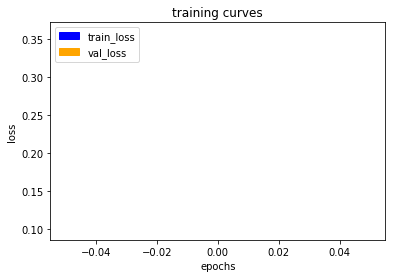

200/200 [==============================] - 206s - loss: 0.3566 - val_loss: 0.0991
Epoch 2/25
199/200 [============================>.] - ETA: 0s - loss: 0.0453

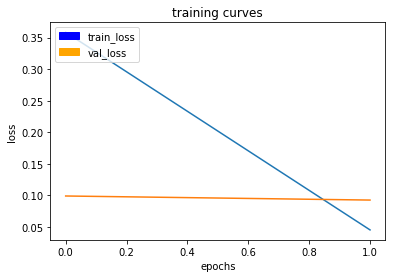

200/200 [==============================] - 207s - loss: 0.0453 - val_loss: 0.0927
Epoch 3/25
199/200 [============================>.] - ETA: 0s - loss: 0.0361

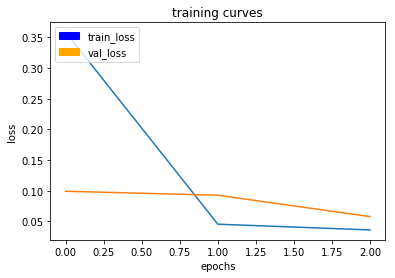

200/200 [==============================] - 205s - loss: 0.0361 - val_loss: 0.0578
Epoch 4/25
199/200 [============================>.] - ETA: 0s - loss: 0.0322

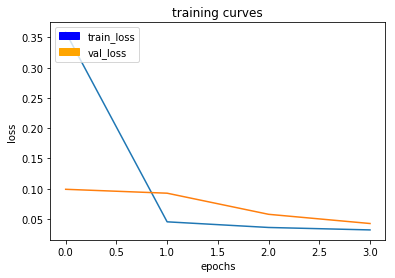

200/200 [==============================] - 204s - loss: 0.0323 - val_loss: 0.0426
Epoch 5/25
199/200 [============================>.] - ETA: 0s - loss: 0.0280

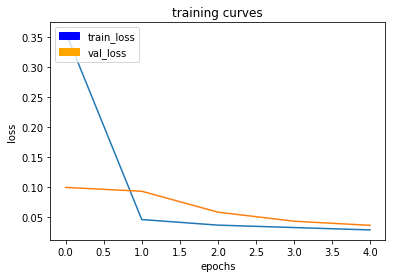

200/200 [==============================] - 202s - loss: 0.0280 - val_loss: 0.0357
Epoch 6/25
199/200 [============================>.] - ETA: 0s - loss: 0.0262

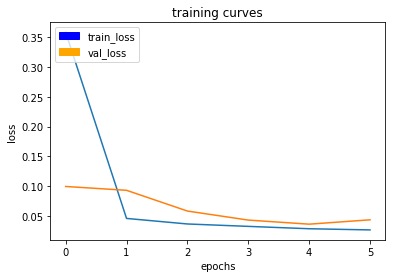

200/200 [==============================] - 203s - loss: 0.0263 - val_loss: 0.0430
Epoch 7/25
199/200 [============================>.] - ETA: 0s - loss: 0.0251

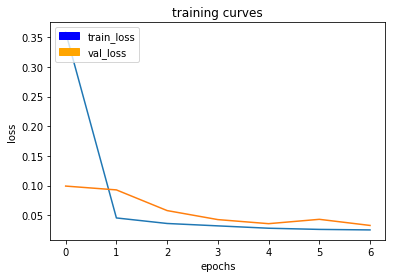

200/200 [==============================] - 206s - loss: 0.0251 - val_loss: 0.0327
Epoch 8/25
199/200 [============================>.] - ETA: 0s - loss: 0.0225

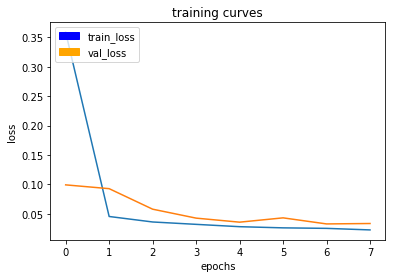

200/200 [==============================] - 207s - loss: 0.0225 - val_loss: 0.0334
Epoch 9/25
199/200 [============================>.] - ETA: 0s - loss: 0.0223

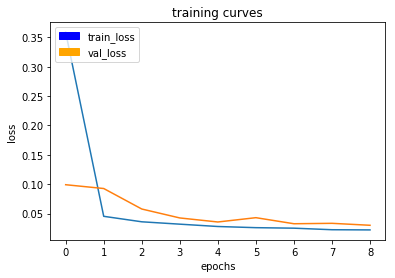

200/200 [==============================] - 207s - loss: 0.0222 - val_loss: 0.0301
Epoch 10/25
199/200 [============================>.] - ETA: 0s - loss: 0.0203

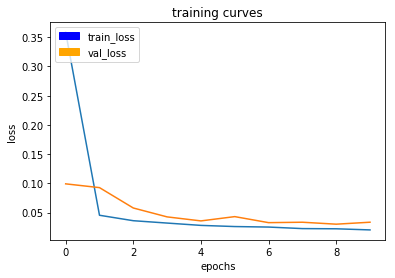

200/200 [==============================] - 206s - loss: 0.0202 - val_loss: 0.0335
Epoch 11/25
199/200 [============================>.] - ETA: 0s - loss: 0.0195

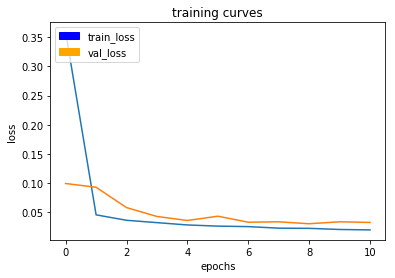

200/200 [==============================] - 208s - loss: 0.0195 - val_loss: 0.0324
Epoch 12/25
199/200 [============================>.] - ETA: 0s - loss: 0.0186

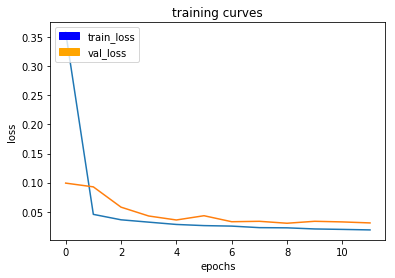

200/200 [==============================] - 209s - loss: 0.0186 - val_loss: 0.0306
Epoch 13/25
199/200 [============================>.] - ETA: 0s - loss: 0.0178

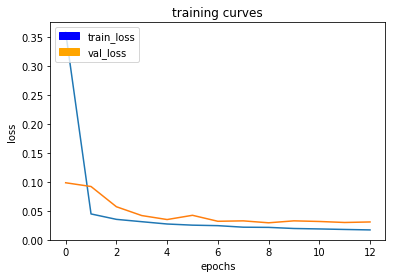

200/200 [==============================] - 207s - loss: 0.0178 - val_loss: 0.0316
Epoch 14/25
199/200 [============================>.] - ETA: 0s - loss: 0.0176

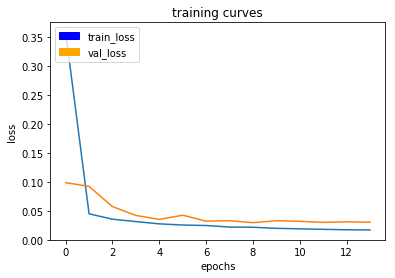

200/200 [==============================] - 208s - loss: 0.0176 - val_loss: 0.0309
Epoch 15/25
199/200 [============================>.] - ETA: 0s - loss: 0.0177

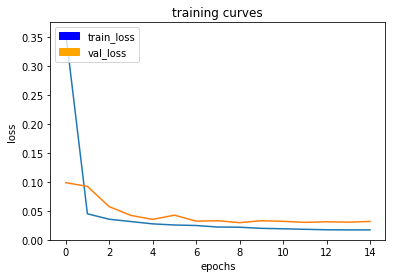

200/200 [==============================] - 205s - loss: 0.0177 - val_loss: 0.0322
Epoch 16/25
199/200 [============================>.] - ETA: 0s - loss: 0.0159

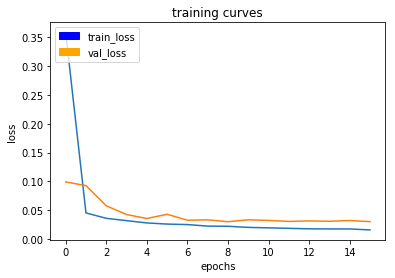

200/200 [==============================] - 206s - loss: 0.0159 - val_loss: 0.0303
Epoch 17/25
199/200 [============================>.] - ETA: 0s - loss: 0.0161

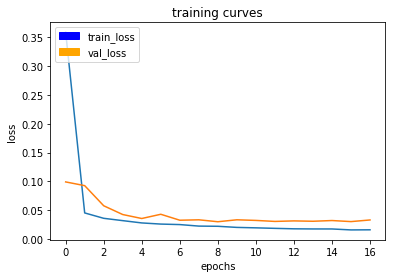

200/200 [==============================] - 208s - loss: 0.0161 - val_loss: 0.0332
Epoch 18/25
199/200 [============================>.] - ETA: 0s - loss: 0.0163

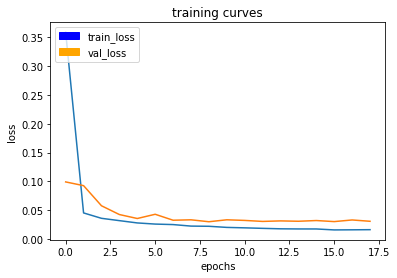

200/200 [==============================] - 205s - loss: 0.0163 - val_loss: 0.0309
Epoch 19/25
199/200 [============================>.] - ETA: 0s - loss: 0.0146

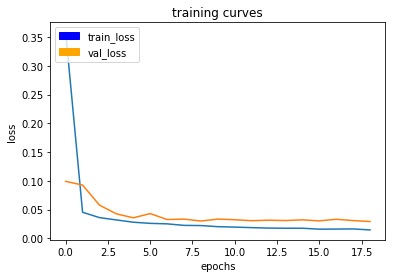

200/200 [==============================] - 205s - loss: 0.0146 - val_loss: 0.0292
Epoch 20/25
199/200 [============================>.] - ETA: 0s - loss: 0.0150

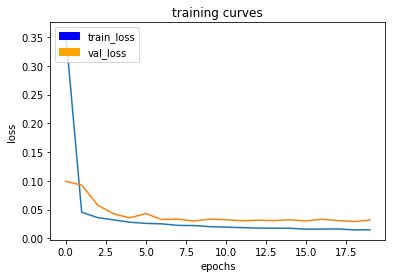

200/200 [==============================] - 204s - loss: 0.0150 - val_loss: 0.0318
Epoch 21/25
199/200 [============================>.] - ETA: 0s - loss: 0.0147

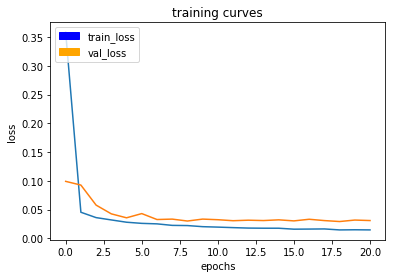

200/200 [==============================] - 205s - loss: 0.0147 - val_loss: 0.0309
Epoch 22/25
199/200 [============================>.] - ETA: 0s - loss: 0.0142

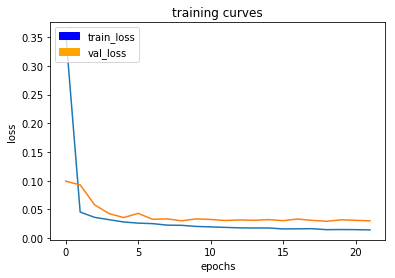

200/200 [==============================] - 205s - loss: 0.0142 - val_loss: 0.0301
Epoch 23/25
199/200 [============================>.] - ETA: 0s - loss: 0.0133

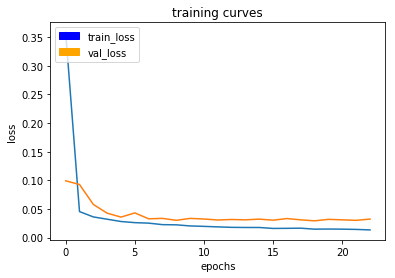

200/200 [==============================] - 205s - loss: 0.0133 - val_loss: 0.0323
Epoch 24/25
199/200 [============================>.] - ETA: 0s - loss: 0.0131

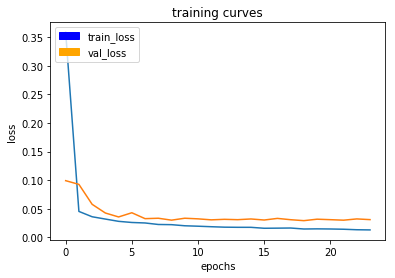

200/200 [==============================] - 206s - loss: 0.0131 - val_loss: 0.0310
Epoch 25/25
199/200 [============================>.] - ETA: 0s - loss: 0.0133

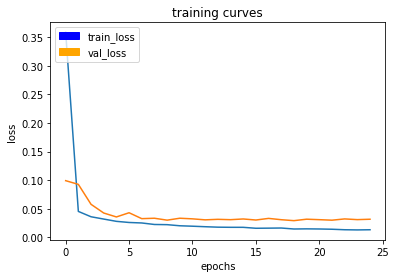

200/200 [==============================] - 210s - loss: 0.0133 - val_loss: 0.0317


In [30]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [31]:
end = time.time()

In [32]:
print(end - start)

5165.0926768779755


In [33]:
# Save your trained model weights
weight_file_name = 'model_weights_128_e25'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [34]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [35]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

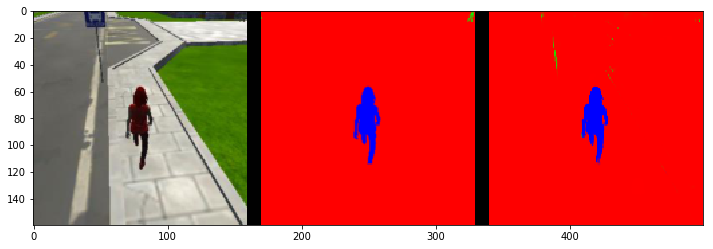

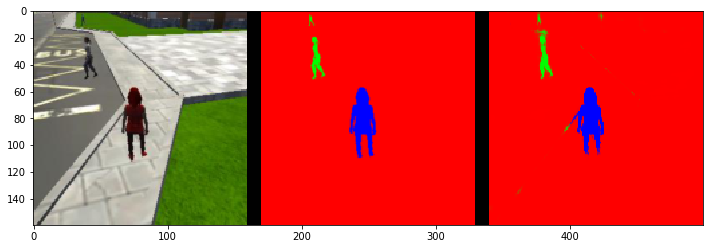

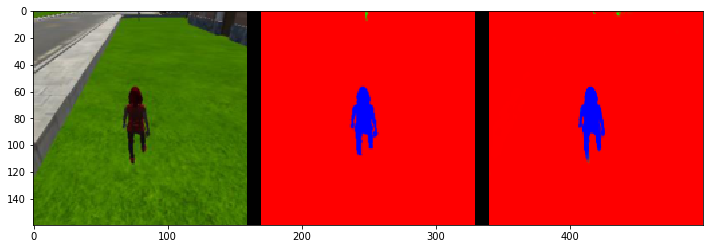

In [36]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

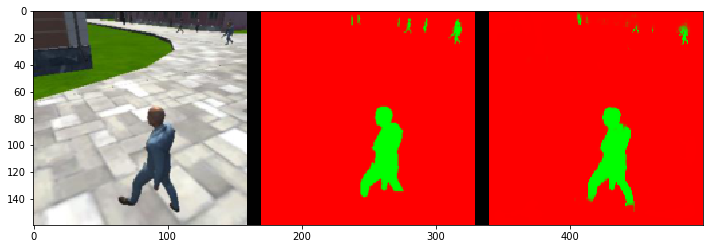

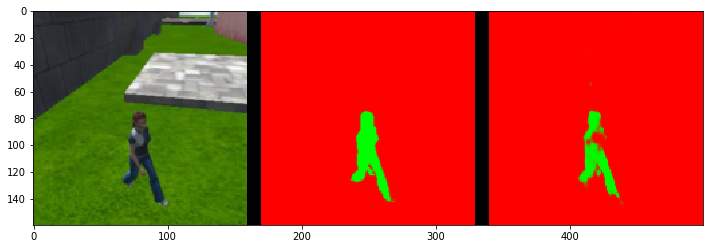

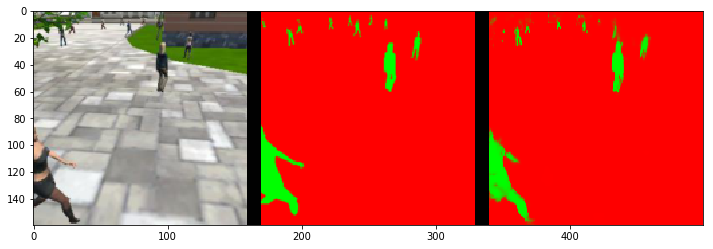

In [37]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

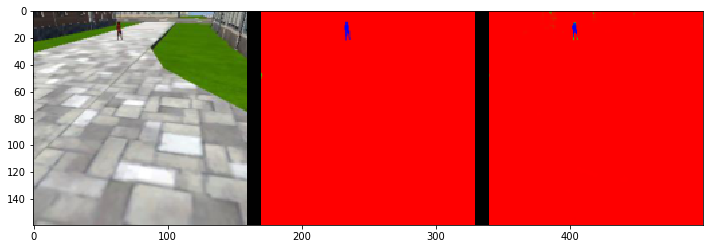

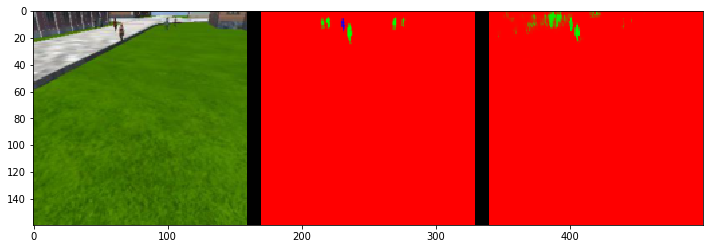

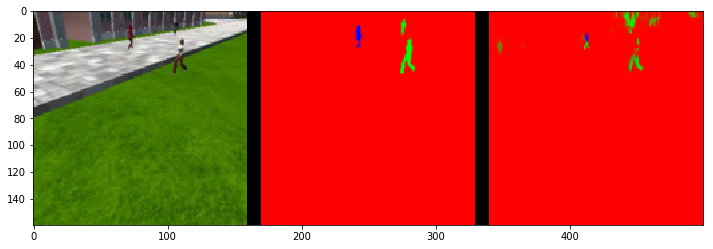

In [38]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [39]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9949503562387189
average intersection over union for other people is 0.32912766483562617
average intersection over union for the hero is 0.8922002110880828
number true positives: 539, number false positives: 0, number false negatives: 0


In [40]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9840466988067021
average intersection over union for other people is 0.6699618220418349
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 74, number false negatives: 0


In [41]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9959428515825826
average intersection over union for other people is 0.4114438029117386
average intersection over union for the hero is 0.16972777894500582
number true positives: 111, number false positives: 2, number false negatives: 190


In [42]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.7096069868995634


In [43]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.5309639950165443


In [44]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.3767757606558448


In [45]:
learning_rate = 0.001
batch_size = 64
num_epochs = 15
steps_per_epoch = 200
validation_steps = 50
workers = 2


In [46]:
import time
start = time.time()

Epoch 1/15
199/200 [============================>.] - ETA: 0s - loss: 0.3289

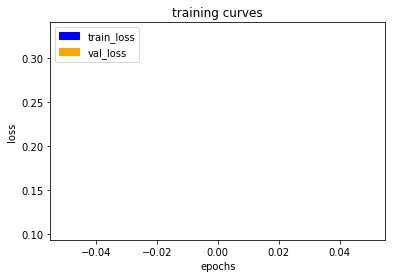

200/200 [==============================] - 100s - loss: 0.3275 - val_loss: 0.1046
Epoch 2/15
199/200 [============================>.] - ETA: 0s - loss: 0.0471

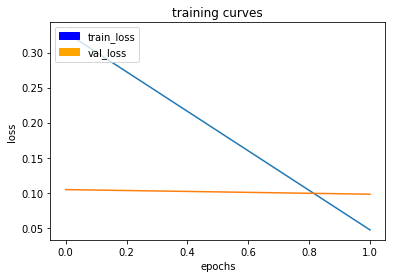

200/200 [==============================] - 98s - loss: 0.0471 - val_loss: 0.0980
Epoch 3/15
199/200 [============================>.] - ETA: 0s - loss: 0.0384

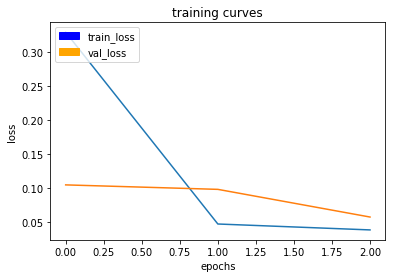

200/200 [==============================] - 98s - loss: 0.0384 - val_loss: 0.0574
Epoch 4/15
199/200 [============================>.] - ETA: 0s - loss: 0.0337

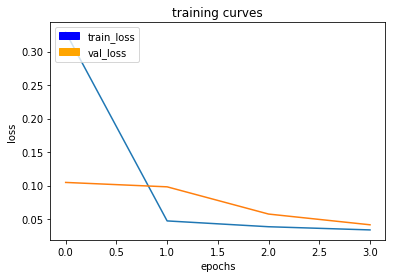

200/200 [==============================] - 99s - loss: 0.0336 - val_loss: 0.0413
Epoch 5/15
199/200 [============================>.] - ETA: 0s - loss: 0.0304

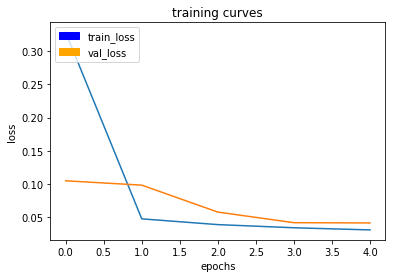

200/200 [==============================] - 99s - loss: 0.0304 - val_loss: 0.0410
Epoch 6/15
199/200 [============================>.] - ETA: 0s - loss: 0.0281

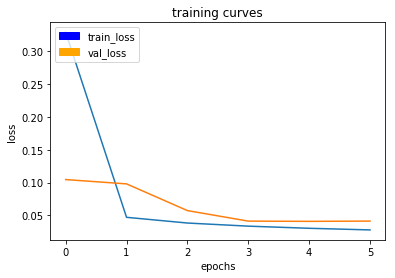

200/200 [==============================] - 99s - loss: 0.0280 - val_loss: 0.0414
Epoch 7/15
199/200 [============================>.] - ETA: 0s - loss: 0.0262

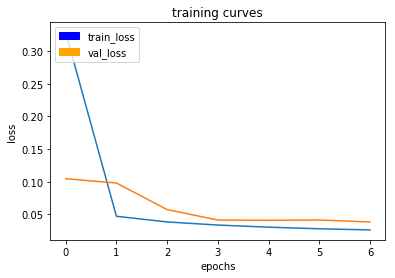

200/200 [==============================] - 99s - loss: 0.0262 - val_loss: 0.0384
Epoch 8/15
199/200 [============================>.] - ETA: 0s - loss: 0.0239

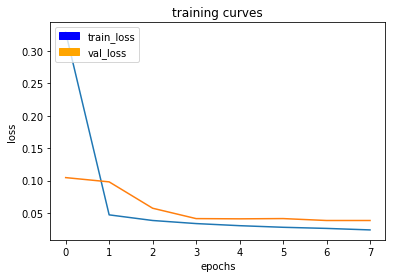

200/200 [==============================] - 99s - loss: 0.0239 - val_loss: 0.0384
Epoch 9/15
199/200 [============================>.] - ETA: 0s - loss: 0.0236

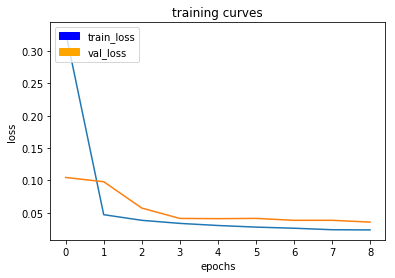

200/200 [==============================] - 98s - loss: 0.0236 - val_loss: 0.0356
Epoch 10/15
199/200 [============================>.] - ETA: 0s - loss: 0.0221

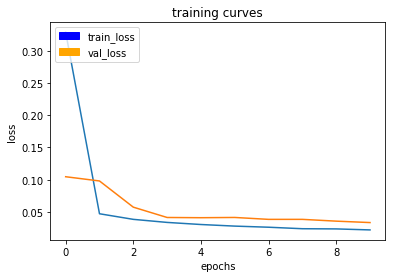

200/200 [==============================] - 99s - loss: 0.0221 - val_loss: 0.0334
Epoch 11/15
199/200 [============================>.] - ETA: 0s - loss: 0.0210

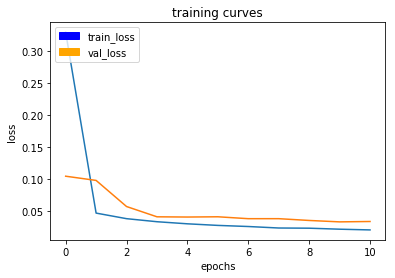

200/200 [==============================] - 99s - loss: 0.0210 - val_loss: 0.0340
Epoch 12/15
199/200 [============================>.] - ETA: 0s - loss: 0.0204

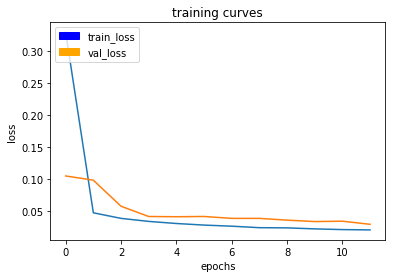

200/200 [==============================] - 98s - loss: 0.0204 - val_loss: 0.0292
Epoch 13/15
199/200 [============================>.] - ETA: 0s - loss: 0.0191

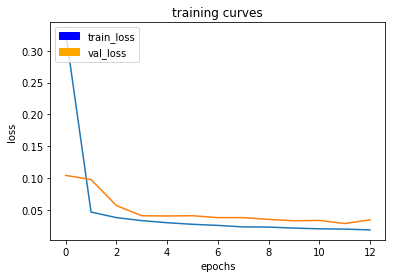

200/200 [==============================] - 99s - loss: 0.0191 - val_loss: 0.0348
Epoch 14/15
199/200 [============================>.] - ETA: 0s - loss: 0.0186

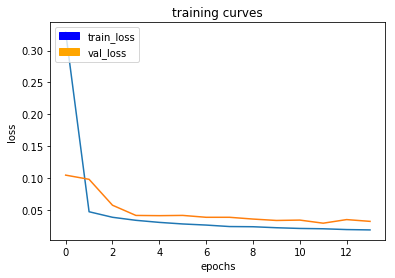

200/200 [==============================] - 98s - loss: 0.0186 - val_loss: 0.0320
Epoch 15/15
199/200 [============================>.] - ETA: 0s - loss: 0.0176

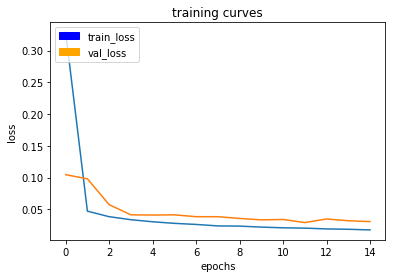

200/200 [==============================] - 99s - loss: 0.0176 - val_loss: 0.0307


In [47]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [48]:
end = time.time()

In [49]:
print(end - start)

1490.7249450683594


In [50]:
# Save your trained model weights
weight_file_name = 'model_weights_128_e25.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [51]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [52]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

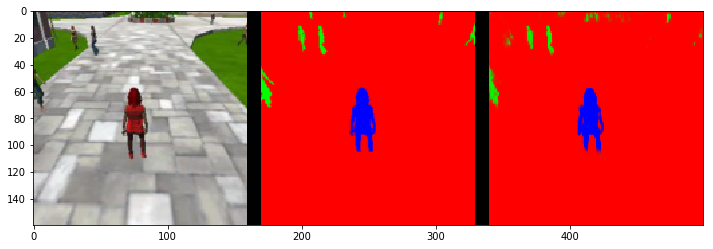

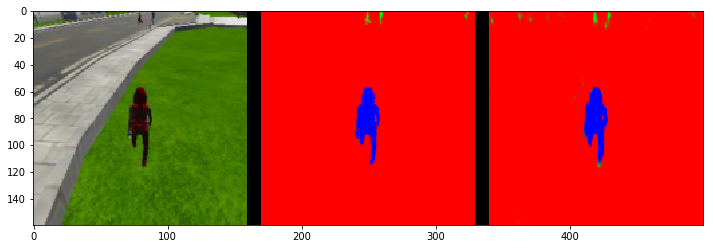

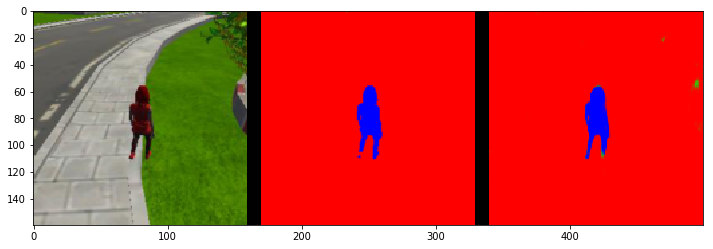

In [53]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

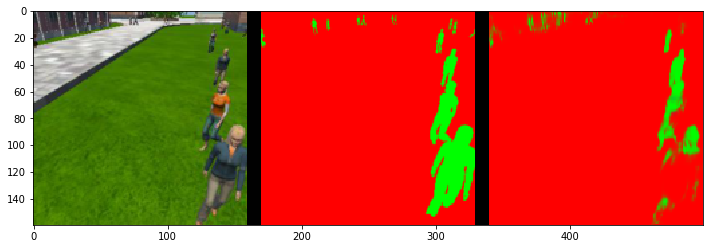

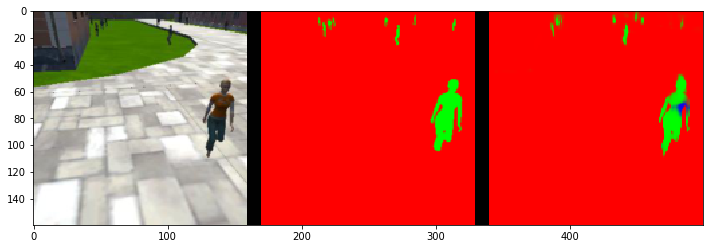

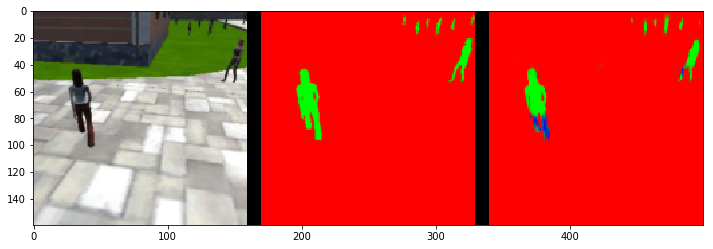

In [54]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

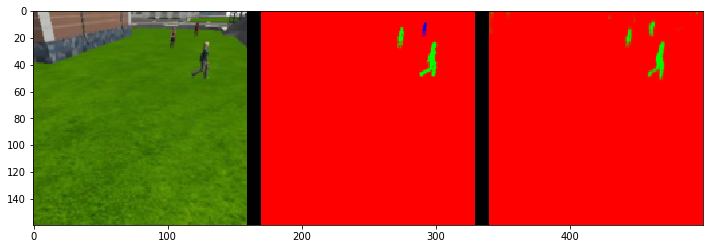

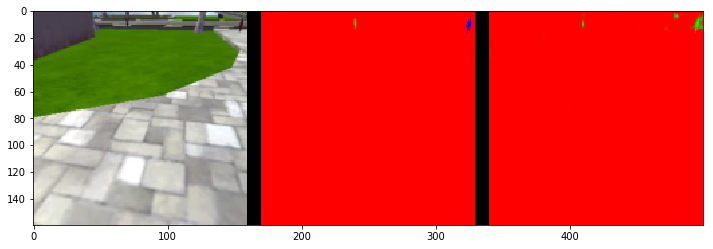

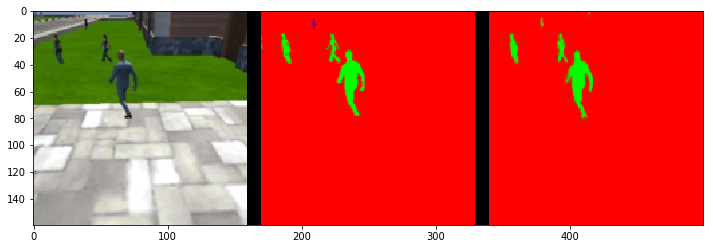

In [55]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [56]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9944921026632204
average intersection over union for other people is 0.2993340488922132
average intersection over union for the hero is 0.8752454349301244
number true positives: 539, number false positives: 0, number false negatives: 0


In [57]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9832533859060663
average intersection over union for other people is 0.6559301951849433
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 51, number false negatives: 0


In [58]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9954882121580823
average intersection over union for other people is 0.3723148441076528
average intersection over union for the hero is 0.11233980317156615
number true positives: 89, number false positives: 1, number false negatives: 212


In [59]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.7040358744394619


In [60]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.49379261905084526


In [61]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.34764771834521396


In [62]:
learning_rate = 0.001
batch_size = 64
num_epochs = 15
steps_per_epoch = 400
validation_steps = 50
workers = 2


In [63]:
import time
start = time.time()

Epoch 1/15
399/400 [============================>.] - ETA: 0s - loss: 0.0176

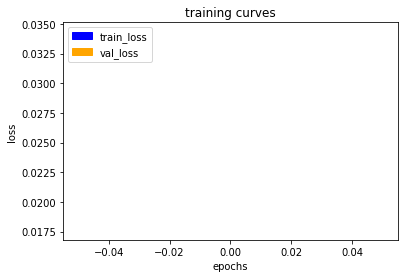

400/400 [==============================] - 184s - loss: 0.0176 - val_loss: 0.0343
Epoch 2/15
399/400 [============================>.] - ETA: 0s - loss: 0.0163

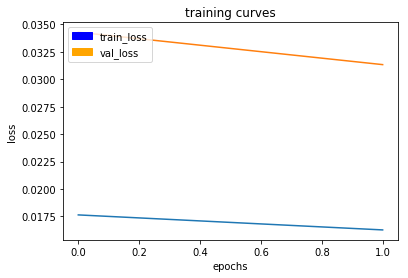

400/400 [==============================] - 186s - loss: 0.0163 - val_loss: 0.0313
Epoch 3/15
399/400 [============================>.] - ETA: 0s - loss: 0.0150

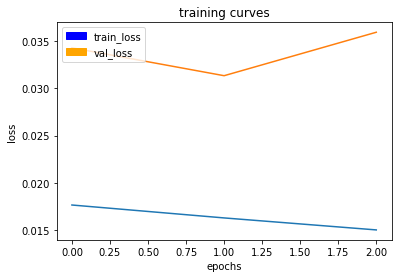

400/400 [==============================] - 185s - loss: 0.0150 - val_loss: 0.0359
Epoch 4/15
399/400 [============================>.] - ETA: 0s - loss: 0.0150

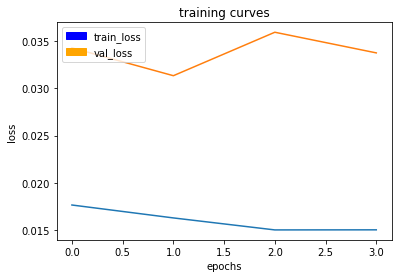

400/400 [==============================] - 184s - loss: 0.0150 - val_loss: 0.0338
Epoch 5/15
399/400 [============================>.] - ETA: 0s - loss: 0.0133

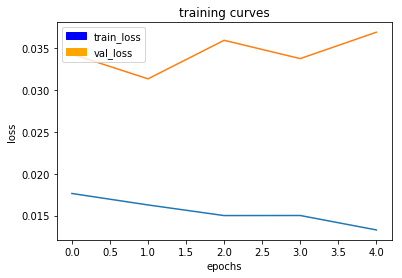

400/400 [==============================] - 183s - loss: 0.0133 - val_loss: 0.0369
Epoch 6/15
399/400 [============================>.] - ETA: 0s - loss: 0.0142

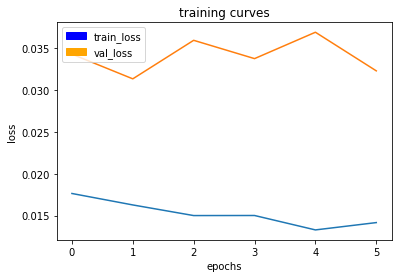

400/400 [==============================] - 183s - loss: 0.0142 - val_loss: 0.0323
Epoch 7/15
399/400 [============================>.] - ETA: 0s - loss: 0.0157

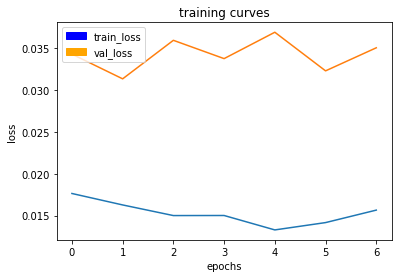

400/400 [==============================] - 182s - loss: 0.0157 - val_loss: 0.0351
Epoch 8/15
399/400 [============================>.] - ETA: 0s - loss: 0.0121

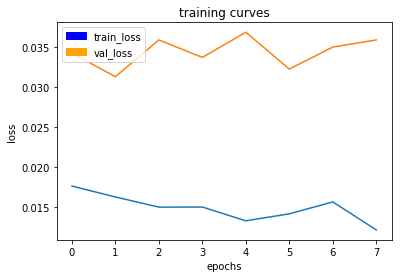

400/400 [==============================] - 184s - loss: 0.0121 - val_loss: 0.0359
Epoch 9/15
399/400 [============================>.] - ETA: 0s - loss: 0.0125

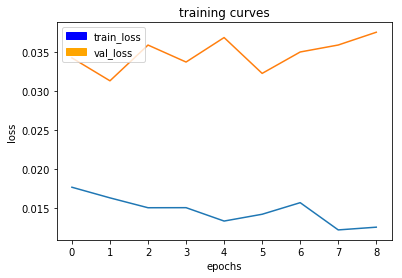

400/400 [==============================] - 182s - loss: 0.0125 - val_loss: 0.0376
Epoch 10/15
399/400 [============================>.] - ETA: 0s - loss: 0.0117

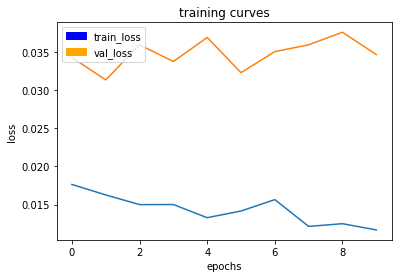

400/400 [==============================] - 182s - loss: 0.0117 - val_loss: 0.0347
Epoch 11/15
399/400 [============================>.] - ETA: 0s - loss: 0.0132

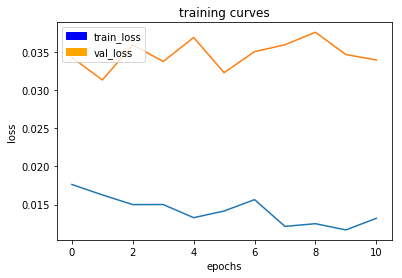

400/400 [==============================] - 181s - loss: 0.0132 - val_loss: 0.0340
Epoch 12/15
399/400 [============================>.] - ETA: 0s - loss: 0.0122

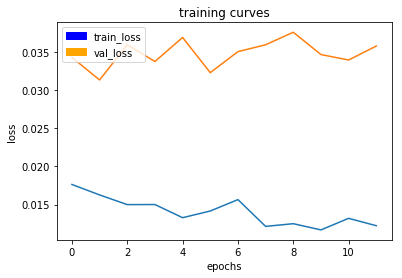

400/400 [==============================] - 183s - loss: 0.0122 - val_loss: 0.0358
Epoch 13/15
399/400 [============================>.] - ETA: 0s - loss: 0.0117

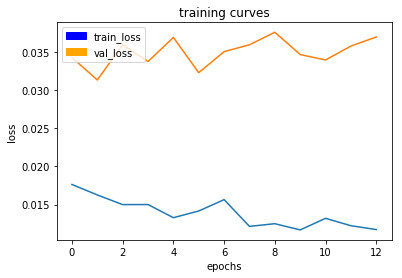

400/400 [==============================] - 183s - loss: 0.0117 - val_loss: 0.0370
Epoch 14/15
399/400 [============================>.] - ETA: 0s - loss: 0.0107

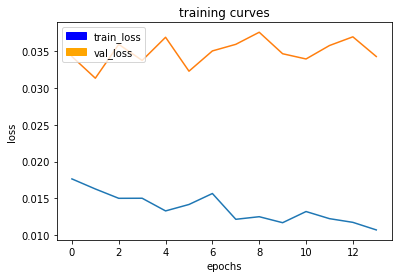

400/400 [==============================] - 183s - loss: 0.0107 - val_loss: 0.0343
Epoch 15/15
399/400 [============================>.] - ETA: 0s - loss: 0.0104

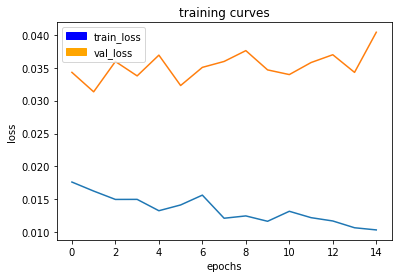

400/400 [==============================] - 183s - loss: 0.0104 - val_loss: 0.0404


In [64]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [65]:
end = time.time()

In [66]:
print(end - start)

2756.587051153183


In [67]:
# Save your trained model weights
weight_file_name = 'model_weights_128_e25.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [68]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [69]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

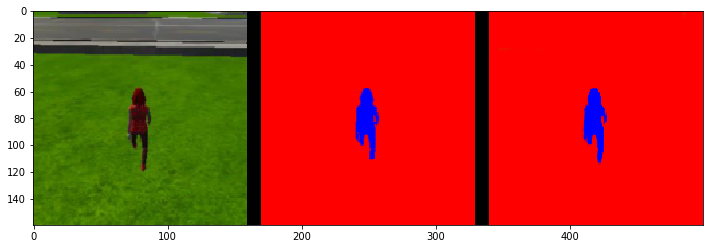

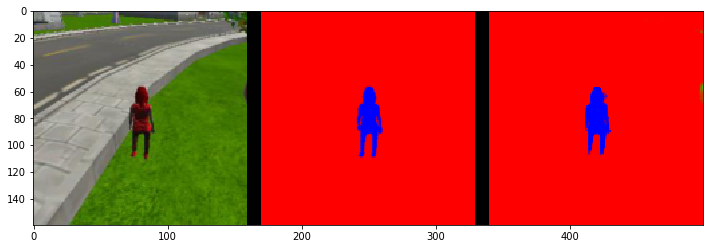

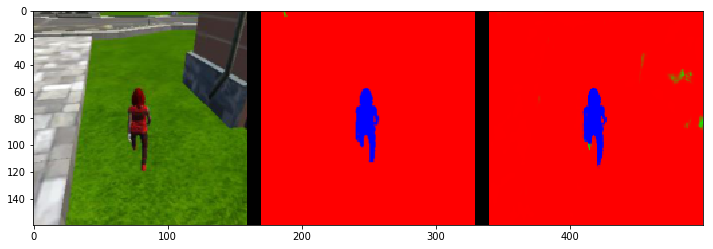

In [70]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

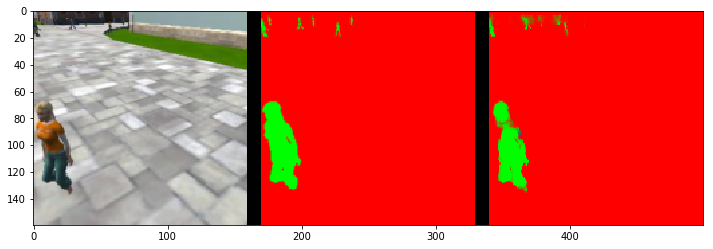

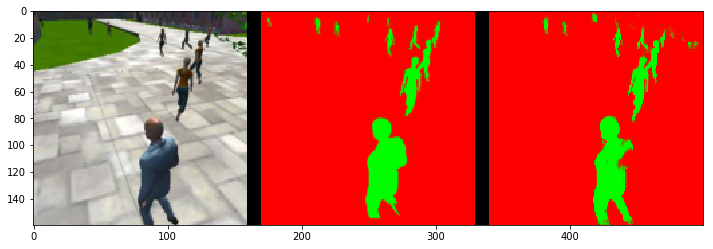

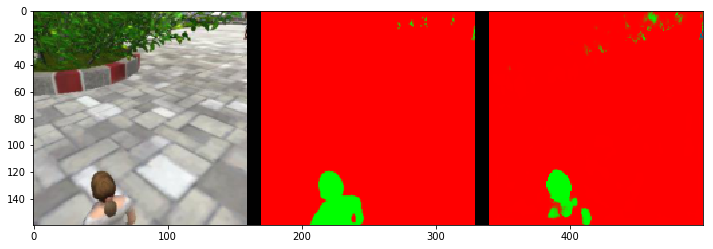

In [71]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

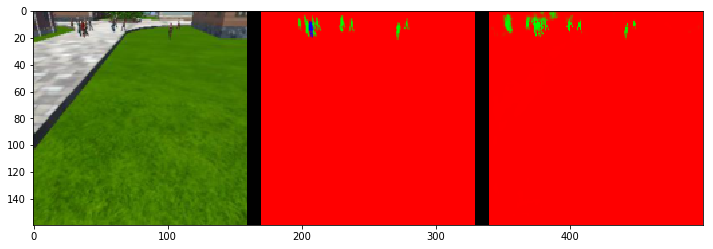

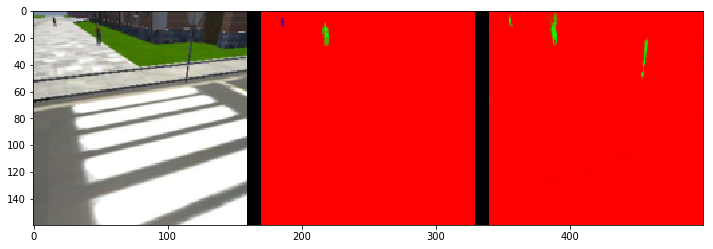

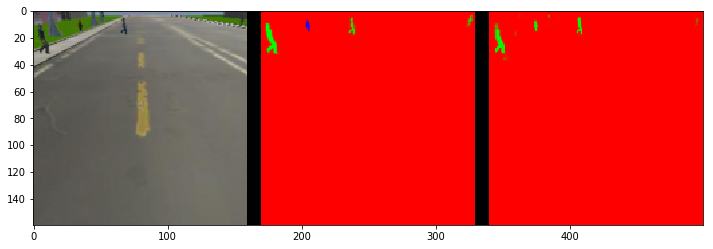

In [72]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [73]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9949379693241035
average intersection over union for other people is 0.33146873135048016
average intersection over union for the hero is 0.8947286379242633
number true positives: 539, number false positives: 0, number false negatives: 0


In [74]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9839712410810244
average intersection over union for other people is 0.6821063015630123
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 69, number false negatives: 0


In [75]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9959213093075606
average intersection over union for other people is 0.4114107399130845
average intersection over union for the hero is 0.15009084507899975
number true positives: 104, number false positives: 2, number false negatives: 197


In [76]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.7058177826564215


In [77]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.5224097415016316


In [78]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.3687260853847959


In [85]:
learning_rate = 0.001
batch_size = 128
num_epochs = 3
steps_per_epoch = 400
validation_steps = 25
workers = 2


In [86]:
import time
start = time.time()

Epoch 1/3
399/400 [============================>.] - ETA: 0s - loss: 0.1348

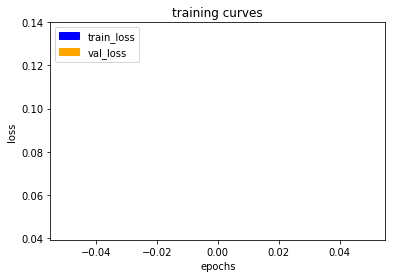

400/400 [==============================] - 364s - loss: 0.1346 - val_loss: 0.0437
Epoch 2/3
399/400 [============================>.] - ETA: 0s - loss: 0.0318

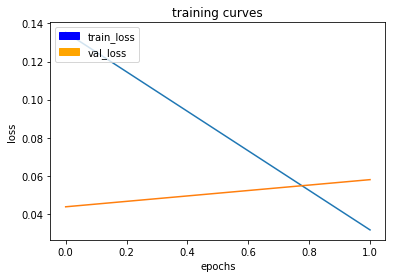

400/400 [==============================] - 356s - loss: 0.0318 - val_loss: 0.0580
Epoch 3/3
399/400 [============================>.] - ETA: 0s - loss: 0.0259

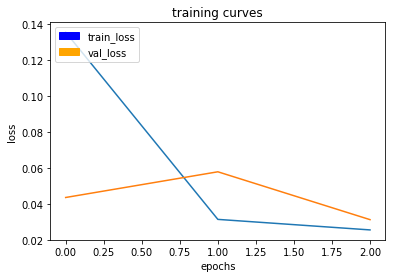

400/400 [==============================] - 356s - loss: 0.0259 - val_loss: 0.0314


In [87]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [88]:
end = time.time()

In [89]:
print(end - start)

15206.903334140778


In [90]:
# Save your trained model weights
weight_file_name = 'model_weights_32_e25_new.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [91]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [92]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

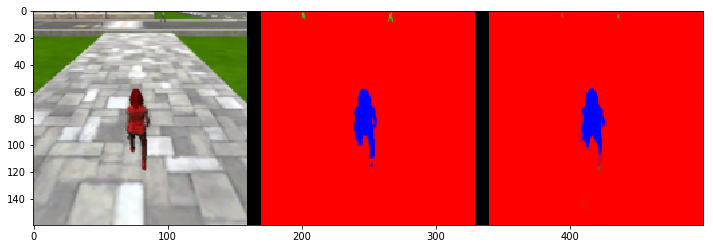

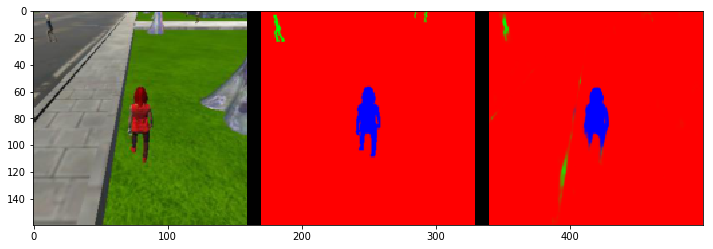

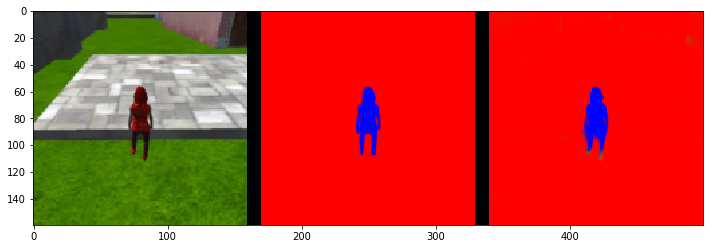

In [93]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

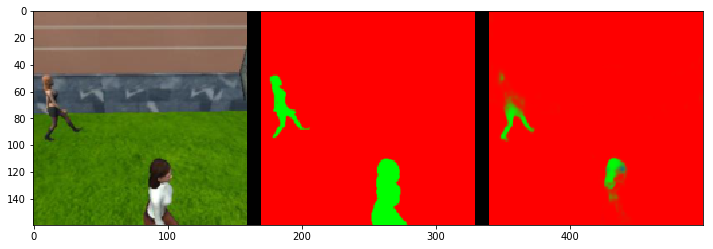

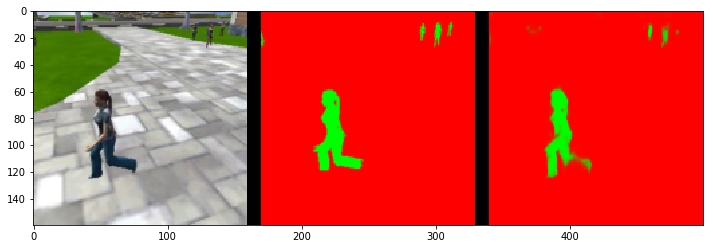

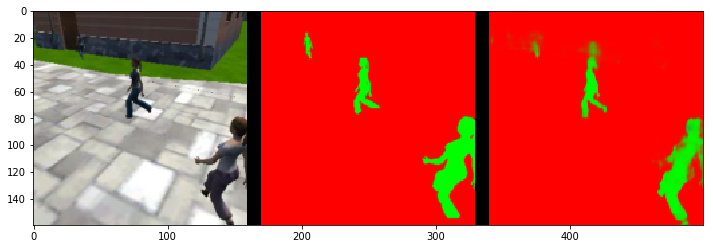

In [94]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

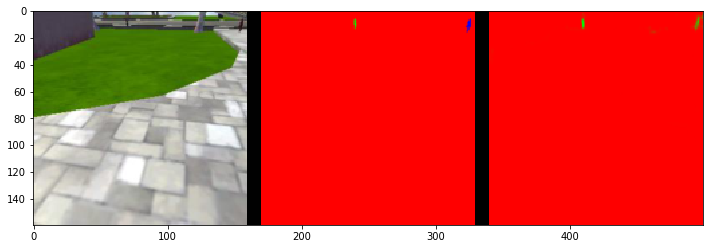

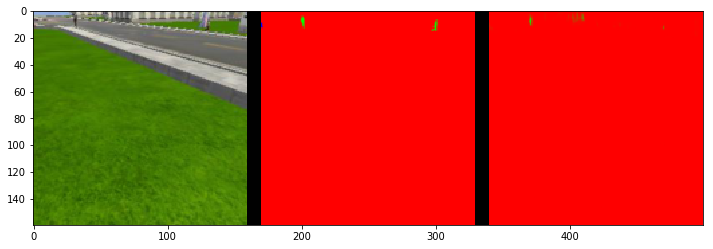

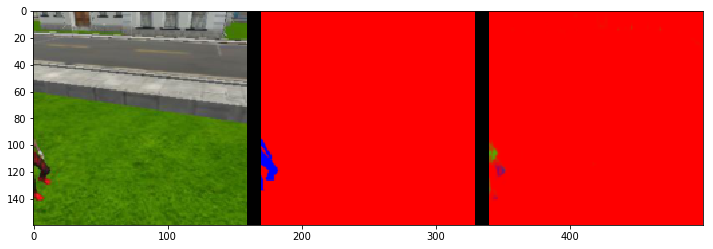

In [95]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [96]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9934135814166809
average intersection over union for other people is 0.25616649770809397
average intersection over union for the hero is 0.8458389841441734
number true positives: 539, number false positives: 0, number false negatives: 0


In [97]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.981977021280462
average intersection over union for other people is 0.6199763493308709
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 47, number false negatives: 0


In [98]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.995053400112823
average intersection over union for other people is 0.34145035749349645
average intersection over union for the hero is 0.09428556522133731
number true positives: 75, number false positives: 1, number false negatives: 226


In [99]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.6914414414414415


In [100]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.47006227468275535


In [101]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.32502053677388715


In [102]:
learning_rate = 0.001
batch_size = 128
num_epochs = 10
steps_per_epoch = 400
validation_steps = 25
workers = 2

In [103]:
import time
start = time.time()

Epoch 1/10
399/400 [============================>.] - ETA: 0s - loss: 0.0229

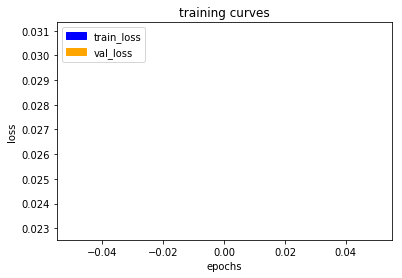

400/400 [==============================] - 348s - loss: 0.0229 - val_loss: 0.0309
Epoch 2/10
399/400 [============================>.] - ETA: 0s - loss: 0.0191

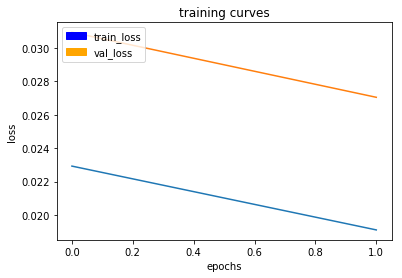

400/400 [==============================] - 354s - loss: 0.0191 - val_loss: 0.0270
Epoch 3/10
399/400 [============================>.] - ETA: 0s - loss: 0.0169

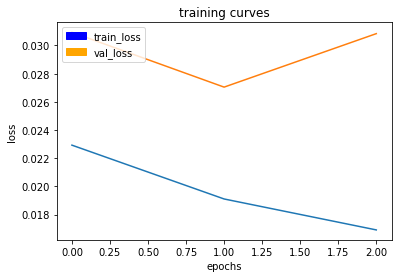

400/400 [==============================] - 355s - loss: 0.0169 - val_loss: 0.0308
Epoch 4/10
399/400 [============================>.] - ETA: 0s - loss: 0.0158

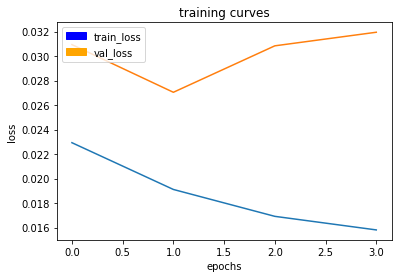

400/400 [==============================] - 354s - loss: 0.0158 - val_loss: 0.0319
Epoch 5/10
399/400 [============================>.] - ETA: 0s - loss: 0.0160

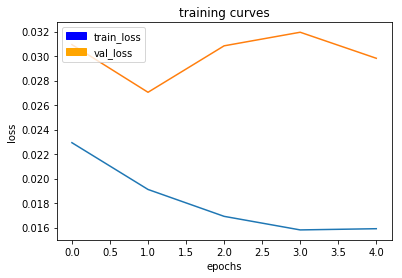

400/400 [==============================] - 356s - loss: 0.0160 - val_loss: 0.0298
Epoch 6/10
399/400 [============================>.] - ETA: 0s - loss: 0.0142

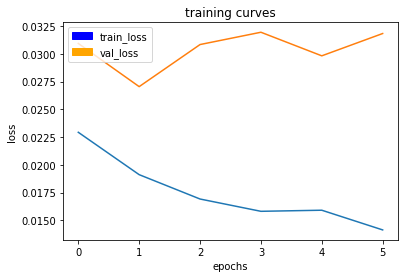

400/400 [==============================] - 354s - loss: 0.0142 - val_loss: 0.0318
Epoch 7/10
399/400 [============================>.] - ETA: 0s - loss: 0.0140

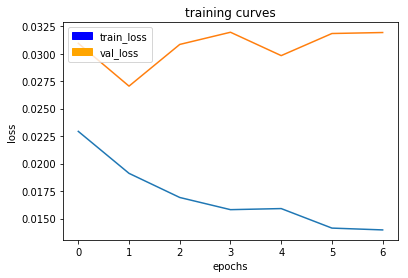

400/400 [==============================] - 357s - loss: 0.0140 - val_loss: 0.0319
Epoch 8/10
399/400 [============================>.] - ETA: 0s - loss: 0.0123

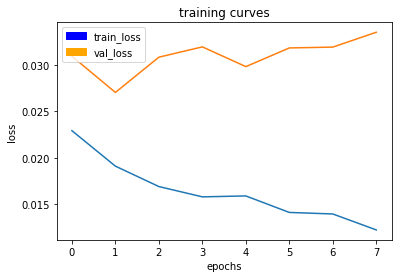

400/400 [==============================] - 354s - loss: 0.0123 - val_loss: 0.0335
Epoch 9/10
399/400 [============================>.] - ETA: 0s - loss: 0.0125

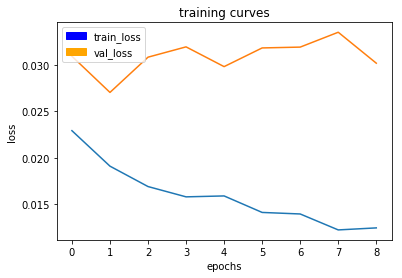

400/400 [==============================] - 356s - loss: 0.0125 - val_loss: 0.0302
Epoch 10/10
399/400 [============================>.] - ETA: 0s - loss: 0.0115

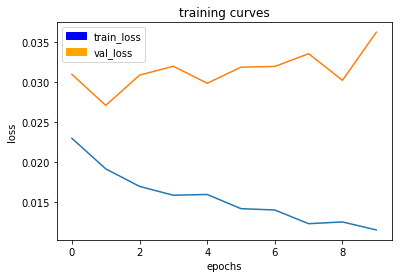

400/400 [==============================] - 351s - loss: 0.0115 - val_loss: 0.0362


In [104]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [105]:
end = time.time()

In [106]:
print(end - start)

3546.2261321544647


In [107]:
# Save your trained model weights
weight_file_name = 'model_weights_32_e25_new.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [108]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [109]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

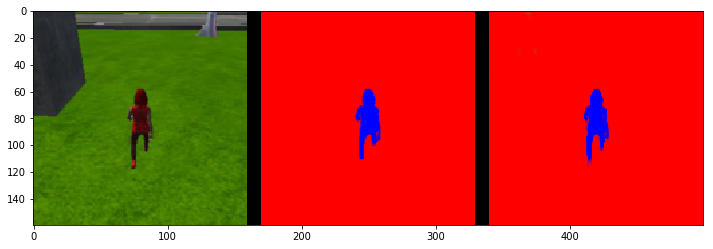

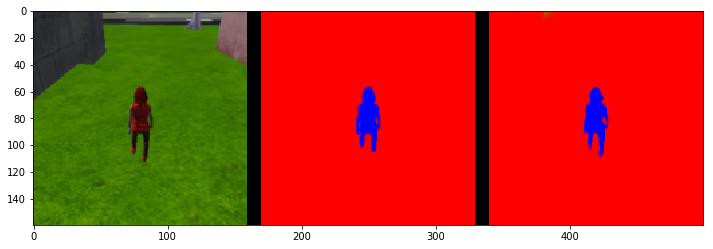

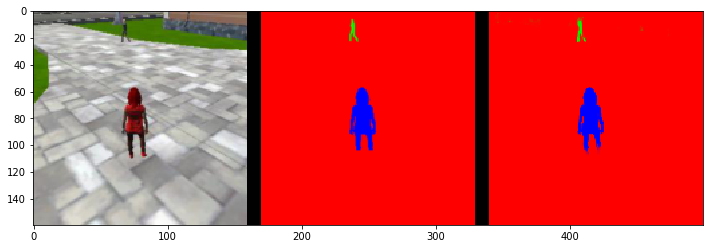

In [110]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

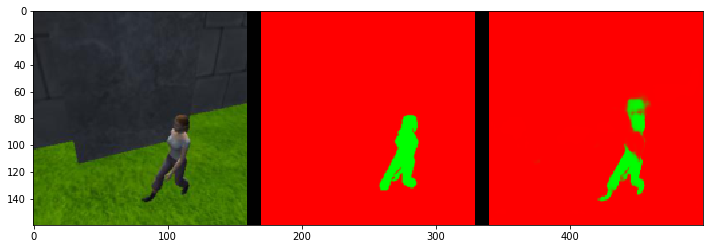

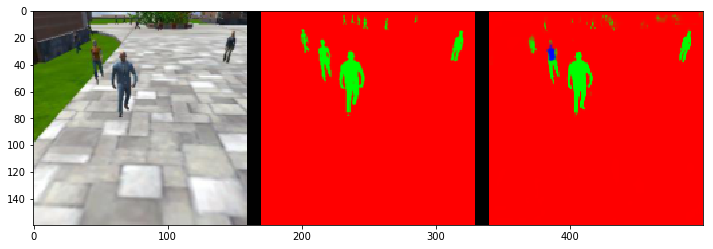

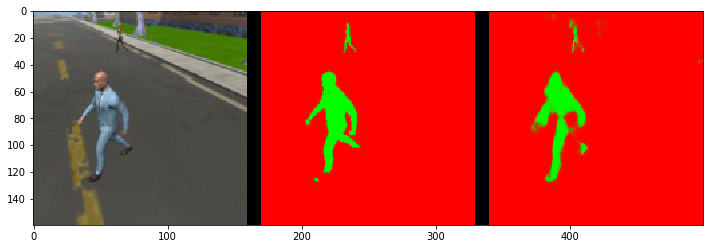

In [111]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

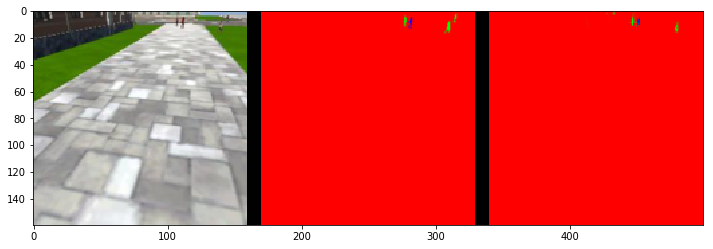

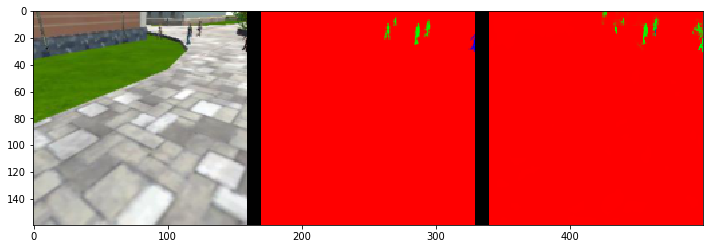

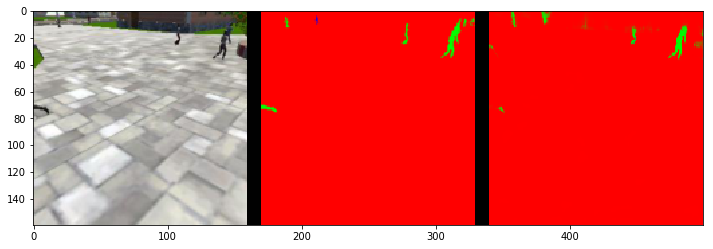

In [112]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [113]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9952637842366556
average intersection over union for other people is 0.3481236548331824
average intersection over union for the hero is 0.8876048444173975
number true positives: 539, number false positives: 0, number false negatives: 0


In [114]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9855765374697124
average intersection over union for other people is 0.704857095476975
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 74, number false negatives: 0


In [115]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9960444523040906
average intersection over union for other people is 0.41822685912390273
average intersection over union for the hero is 0.1589069300550919
number true positives: 107, number false positives: 2, number false negatives: 194


In [116]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.7052401746724891


In [117]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.5232558872362447


In [118]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.3690210733128975


In [119]:
learning_rate = 0.001
batch_size = 128
num_epochs = 10
steps_per_epoch = 400
validation_steps = 25
workers = 2

In [120]:
import time
start = time.time()

Epoch 1/10
399/400 [============================>.] - ETA: 0s - loss: 0.0115

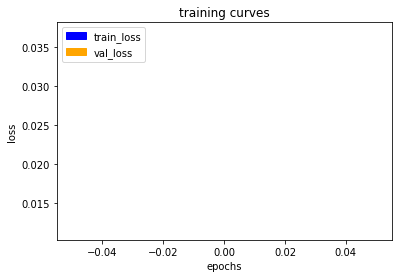

400/400 [==============================] - 354s - loss: 0.0115 - val_loss: 0.0369
Epoch 2/10
399/400 [============================>.] - ETA: 0s - loss: 0.0115

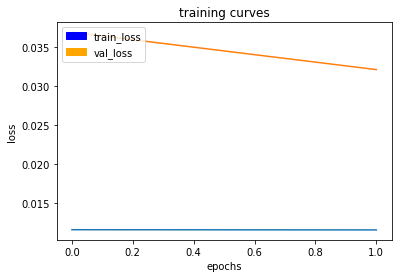

400/400 [==============================] - 354s - loss: 0.0115 - val_loss: 0.0321
Epoch 3/10
399/400 [============================>.] - ETA: 0s - loss: 0.0123

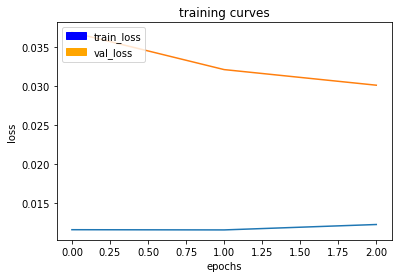

400/400 [==============================] - 354s - loss: 0.0123 - val_loss: 0.0301
Epoch 4/10
399/400 [============================>.] - ETA: 0s - loss: 0.0103

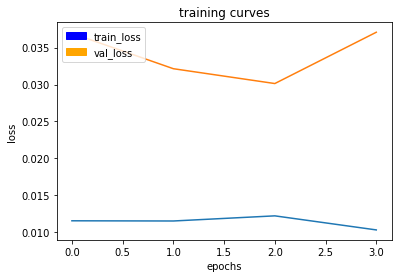

400/400 [==============================] - 354s - loss: 0.0103 - val_loss: 0.0371
Epoch 5/10
399/400 [============================>.] - ETA: 0s - loss: 0.0120

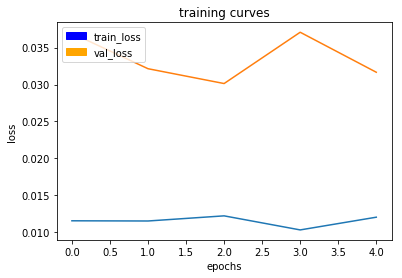

400/400 [==============================] - 351s - loss: 0.0120 - val_loss: 0.0317
Epoch 6/10
399/400 [============================>.] - ETA: 0s - loss: 0.0113

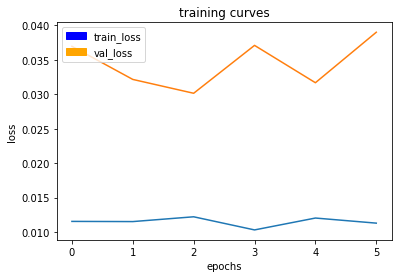

400/400 [==============================] - 349s - loss: 0.0113 - val_loss: 0.0390
Epoch 7/10
399/400 [============================>.] - ETA: 0s - loss: 0.0099

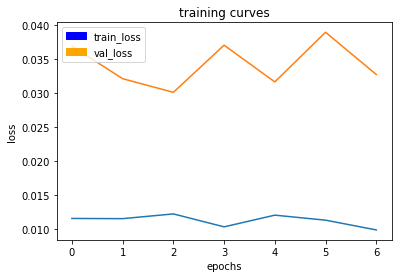

400/400 [==============================] - 349s - loss: 0.0099 - val_loss: 0.0328
Epoch 8/10
399/400 [============================>.] - ETA: 0s - loss: 0.0113

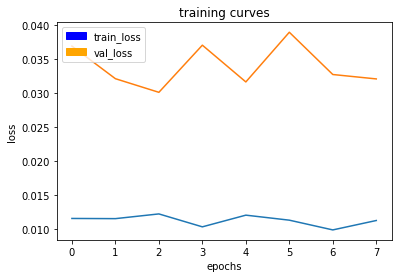

400/400 [==============================] - 349s - loss: 0.0112 - val_loss: 0.0321
Epoch 9/10
399/400 [============================>.] - ETA: 0s - loss: 0.0100

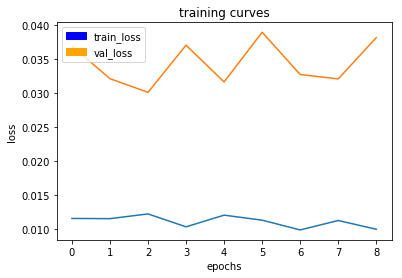

400/400 [==============================] - 349s - loss: 0.0100 - val_loss: 0.0382
Epoch 10/10
399/400 [============================>.] - ETA: 0s - loss: 0.0094

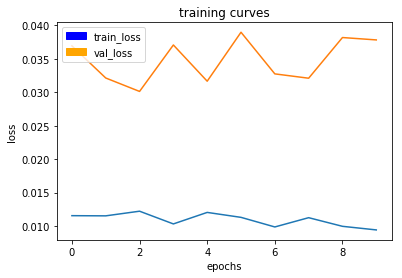

400/400 [==============================] - 352s - loss: 0.0094 - val_loss: 0.0378


In [121]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [122]:
end = time.time()

In [123]:
print(end - start)

3522.9976663589478


In [124]:
# Save your trained model weights
weight_file_name = 'model_weights_32_e25_new_2.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [125]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [126]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

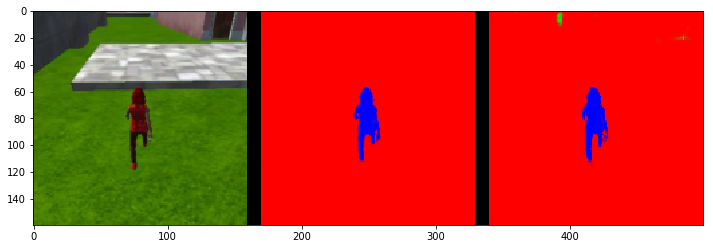

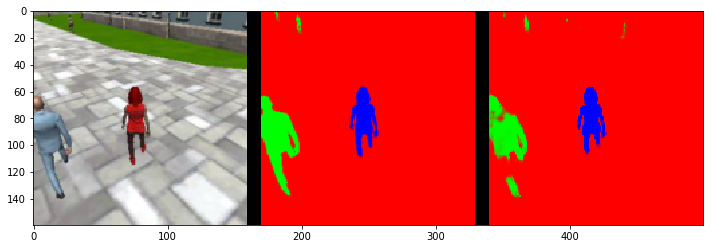

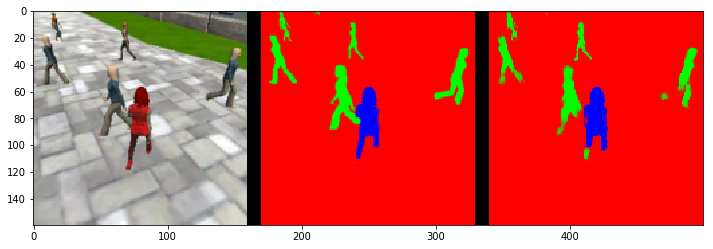

In [127]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

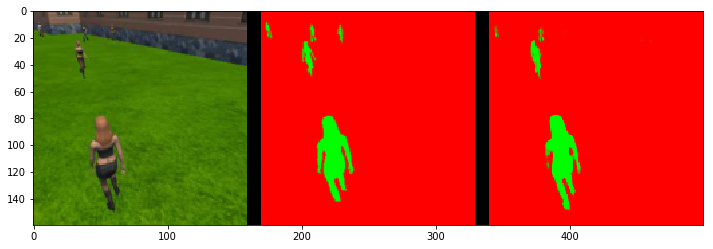

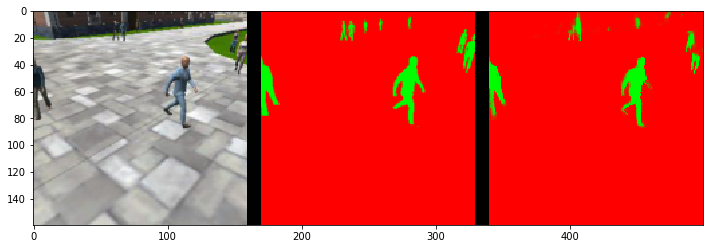

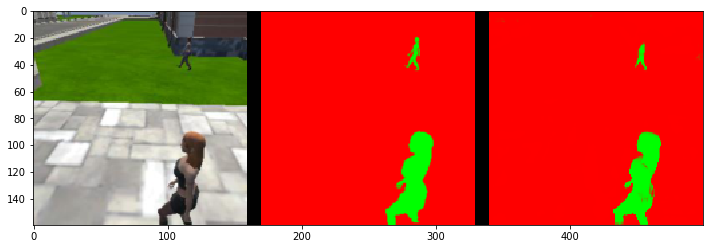

In [128]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

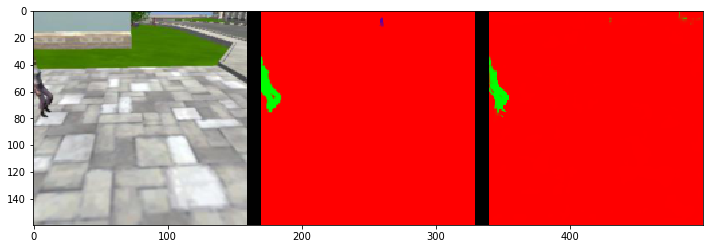

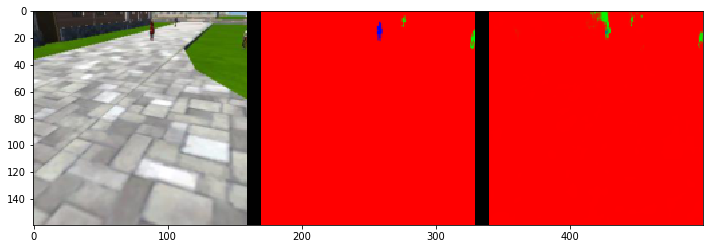

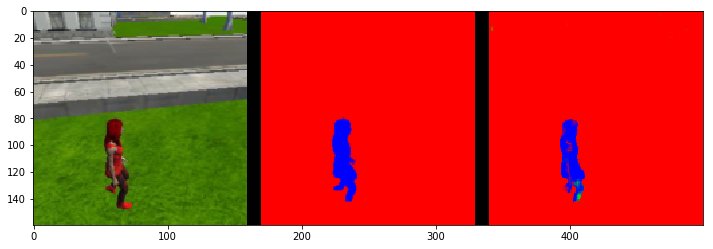

In [129]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [130]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9953302700040064
average intersection over union for other people is 0.34806278427681847
average intersection over union for the hero is 0.8955358578121805
number true positives: 539, number false positives: 0, number false negatives: 0


In [131]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9858586418447334
average intersection over union for other people is 0.7148467321349626
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 62, number false negatives: 0


In [132]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9960369594276118
average intersection over union for other people is 0.41640330736589043
average intersection over union for the hero is 0.15160563784371178
number true positives: 103, number false positives: 2, number false negatives: 198


In [133]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.7101769911504425


In [134]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.5235707478279461


In [135]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.3718278983468379


In [185]:
learning_rate = 0.001
batch_size = 32
num_epochs = 25
steps_per_epoch = 260
validation_steps = 75
workers = 2

In [186]:
import time
start = time.time()

In [187]:
output_layer = fcn_model_var2(inputs, num_classes)

Epoch 1/25
259/260 [============================>.] - ETA: 0s - loss: 0.2674

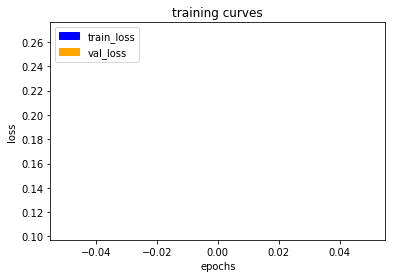

260/260 [==============================] - 67s - loss: 0.2665 - val_loss: 0.1054
Epoch 2/25
258/260 [============================>.] - ETA: 0s - loss: 0.0403

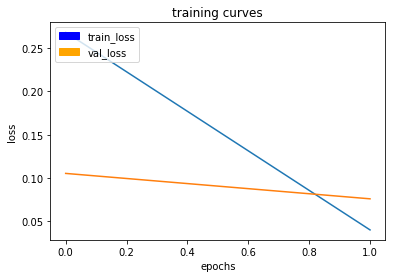

260/260 [==============================] - 67s - loss: 0.0402 - val_loss: 0.0761
Epoch 3/25
259/260 [============================>.] - ETA: 0s - loss: 0.0328

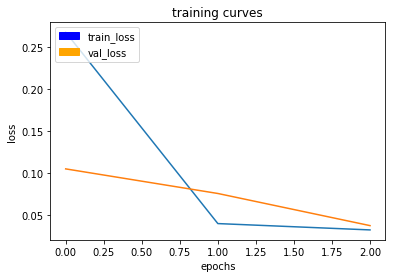

260/260 [==============================] - 67s - loss: 0.0328 - val_loss: 0.0379
Epoch 4/25
259/260 [============================>.] - ETA: 0s - loss: 0.0283

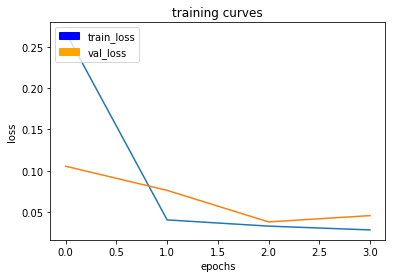

260/260 [==============================] - 67s - loss: 0.0283 - val_loss: 0.0455
Epoch 5/25
258/260 [============================>.] - ETA: 0s - loss: 0.0252

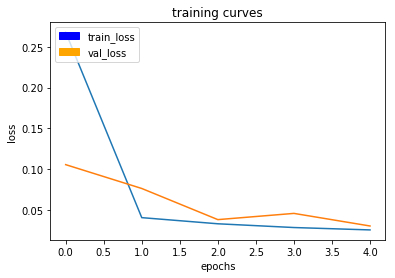

260/260 [==============================] - 67s - loss: 0.0252 - val_loss: 0.0300
Epoch 6/25
258/260 [============================>.] - ETA: 0s - loss: 0.0221

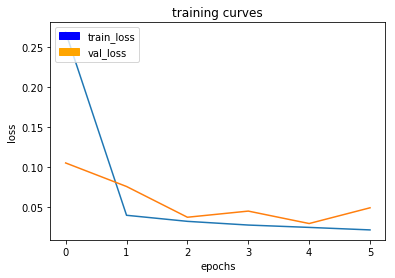

260/260 [==============================] - 67s - loss: 0.0223 - val_loss: 0.0496
Epoch 7/25
259/260 [============================>.] - ETA: 0s - loss: 0.0227

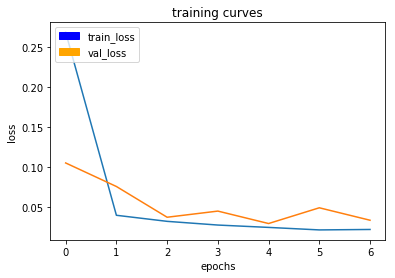

260/260 [==============================] - 67s - loss: 0.0226 - val_loss: 0.0341
Epoch 8/25
258/260 [============================>.] - ETA: 0s - loss: 0.0177

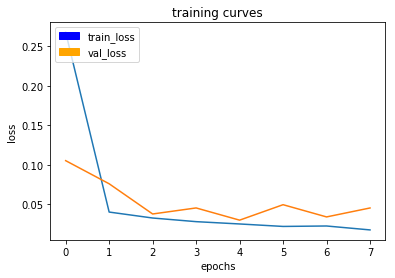

260/260 [==============================] - 67s - loss: 0.0177 - val_loss: 0.0455
Epoch 9/25
259/260 [============================>.] - ETA: 0s - loss: 0.0197

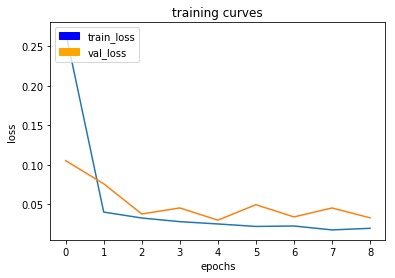

260/260 [==============================] - 67s - loss: 0.0197 - val_loss: 0.0330
Epoch 10/25
258/260 [============================>.] - ETA: 0s - loss: 0.0164

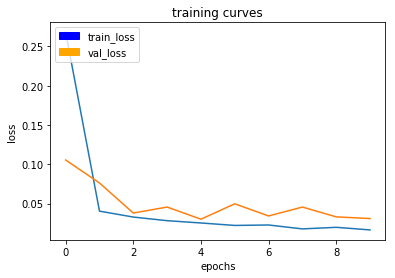

260/260 [==============================] - 67s - loss: 0.0164 - val_loss: 0.0308
Epoch 11/25
258/260 [============================>.] - ETA: 0s - loss: 0.0162

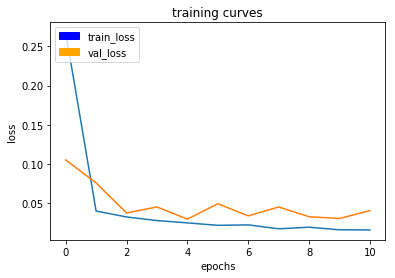

260/260 [==============================] - 67s - loss: 0.0163 - val_loss: 0.0408
Epoch 12/25
259/260 [============================>.] - ETA: 0s - loss: 0.0154

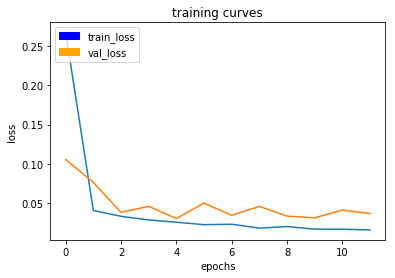

260/260 [==============================] - 67s - loss: 0.0154 - val_loss: 0.0363
Epoch 13/25
258/260 [============================>.] - ETA: 0s - loss: 0.0137

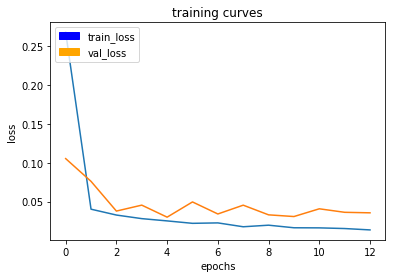

260/260 [==============================] - 67s - loss: 0.0136 - val_loss: 0.0356
Epoch 14/25
258/260 [============================>.] - ETA: 0s - loss: 0.0154

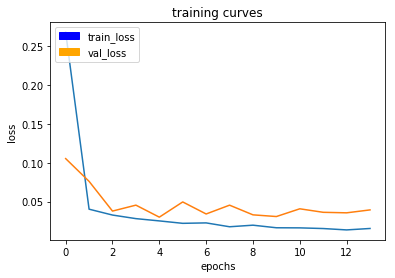

260/260 [==============================] - 67s - loss: 0.0154 - val_loss: 0.0394
Epoch 15/25
258/260 [============================>.] - ETA: 0s - loss: 0.0165

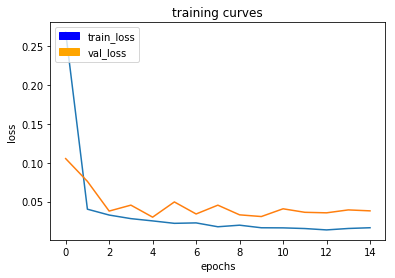

260/260 [==============================] - 67s - loss: 0.0164 - val_loss: 0.0381
Epoch 16/25
258/260 [============================>.] - ETA: 0s - loss: 0.0133

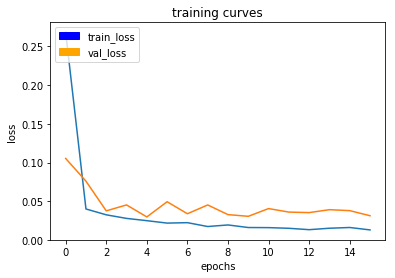

260/260 [==============================] - 66s - loss: 0.0133 - val_loss: 0.0316
Epoch 17/25
259/260 [============================>.] - ETA: 0s - loss: 0.0124

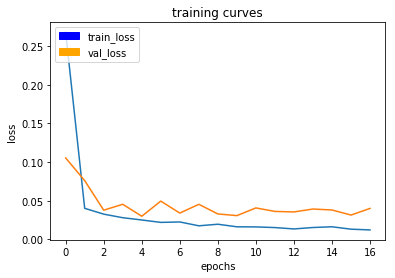

260/260 [==============================] - 66s - loss: 0.0124 - val_loss: 0.0402
Epoch 18/25
259/260 [============================>.] - ETA: 0s - loss: 0.0121

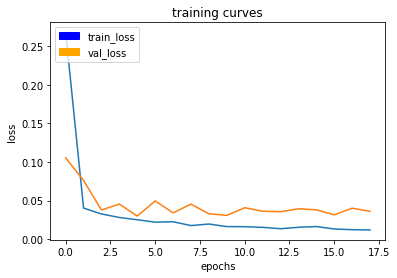

260/260 [==============================] - 67s - loss: 0.0121 - val_loss: 0.0362
Epoch 19/25
259/260 [============================>.] - ETA: 0s - loss: 0.0114

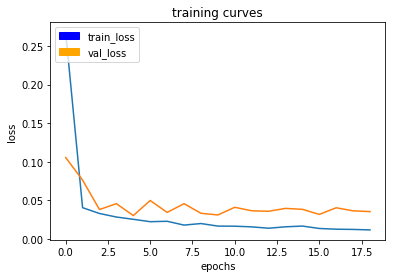

260/260 [==============================] - 67s - loss: 0.0114 - val_loss: 0.0352
Epoch 20/25
259/260 [============================>.] - ETA: 0s - loss: 0.0115

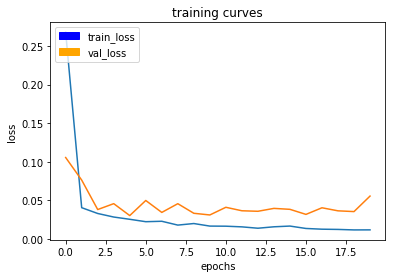

260/260 [==============================] - 68s - loss: 0.0116 - val_loss: 0.0553
Epoch 21/25
259/260 [============================>.] - ETA: 0s - loss: 0.0226

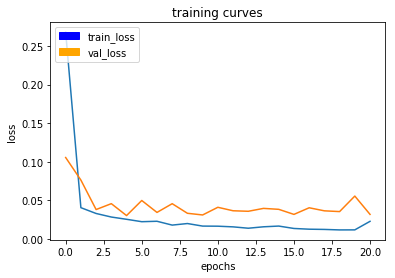

260/260 [==============================] - 68s - loss: 0.0226 - val_loss: 0.0316
Epoch 22/25
258/260 [============================>.] - ETA: 0s - loss: 0.0142

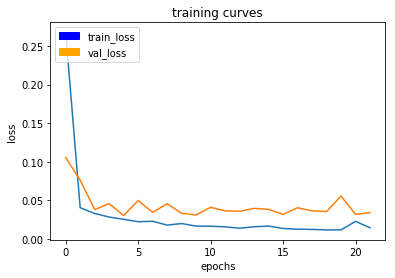

260/260 [==============================] - 68s - loss: 0.0142 - val_loss: 0.0340
Epoch 23/25
259/260 [============================>.] - ETA: 0s - loss: 0.0117

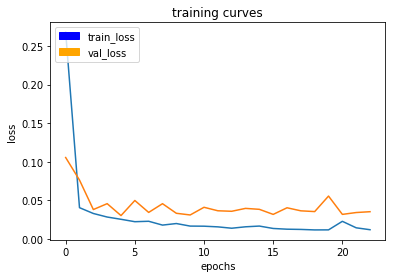

260/260 [==============================] - 68s - loss: 0.0117 - val_loss: 0.0351
Epoch 24/25
258/260 [============================>.] - ETA: 0s - loss: 0.0109

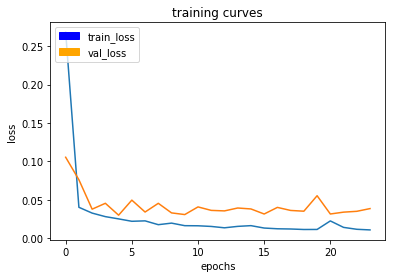

260/260 [==============================] - 68s - loss: 0.0109 - val_loss: 0.0386
Epoch 25/25
258/260 [============================>.] - ETA: 0s - loss: 0.0105

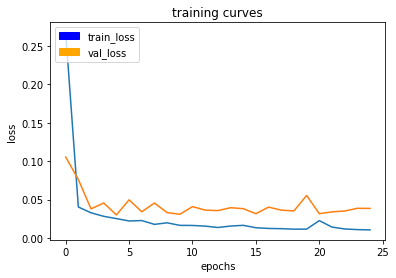

260/260 [==============================] - 67s - loss: 0.0105 - val_loss: 0.0385


In [188]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [189]:
end = time.time()

In [190]:
print(end - start)

1694.5811655521393


In [191]:
# Save your trained model weights
weight_file_name = 'model_weights_32_e25_new_2.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [192]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [193]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

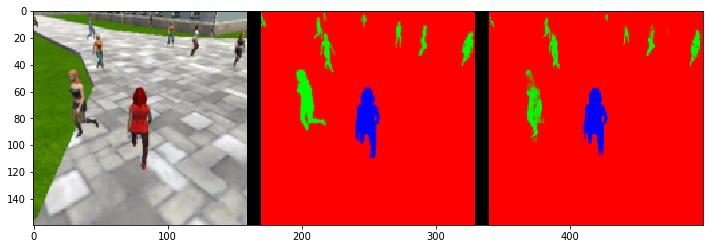

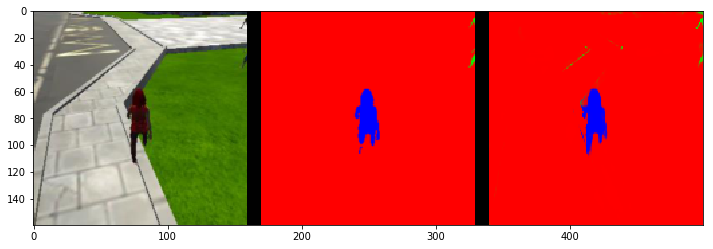

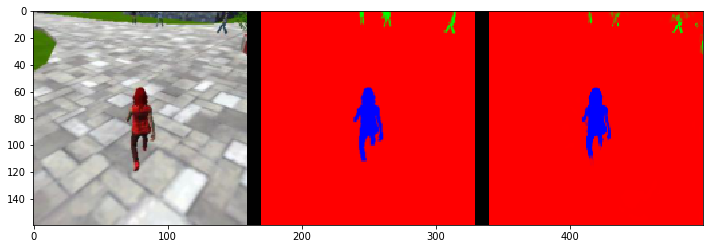

In [194]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

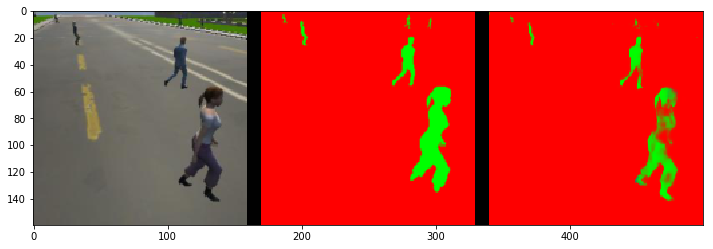

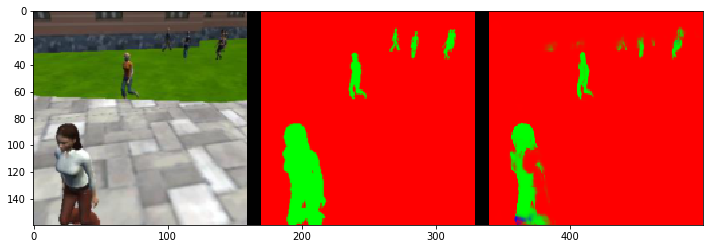

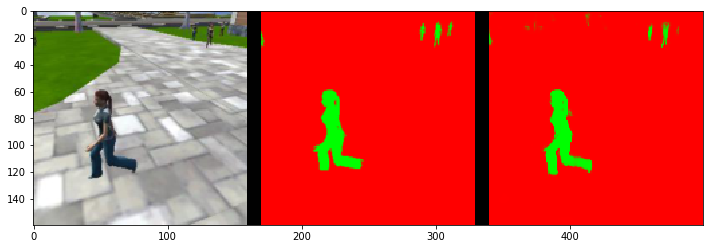

In [195]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

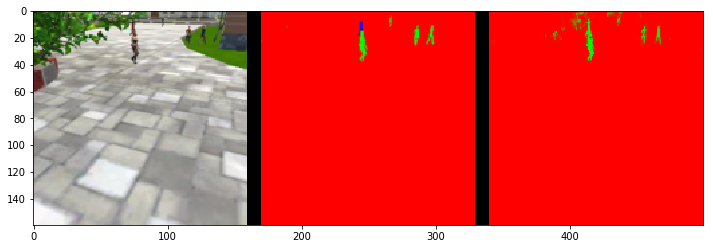

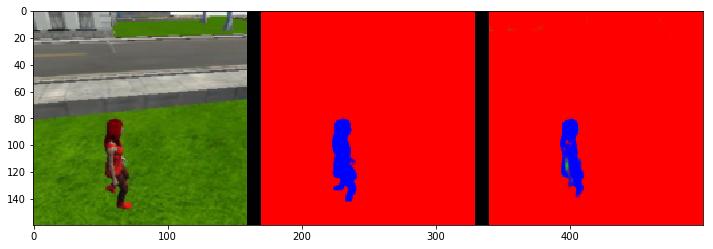

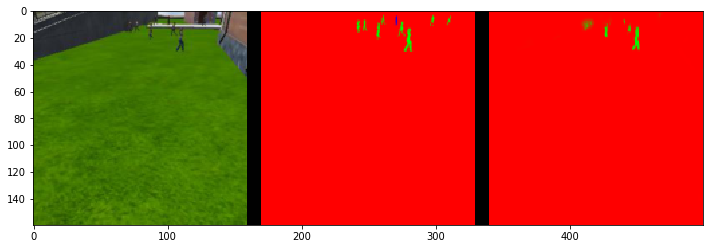

In [196]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [197]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9950109218605168
average intersection over union for other people is 0.3201026953423218
average intersection over union for the hero is 0.8812080483071564
number true positives: 539, number false positives: 0, number false negatives: 0


In [198]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9847412401539629
average intersection over union for other people is 0.6857319448266296
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 36, number false negatives: 0


In [199]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9958326952772705
average intersection over union for other people is 0.36677965996915035
average intersection over union for the hero is 0.04895656396073276
number true positives: 51, number false positives: 1, number false negatives: 250


In [200]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.6727480045610034


In [201]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.4650823061339446


In [202]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.3128831934082409


In [203]:
def fcn_model_var3(inputs, num_classes):
    
    # TODO Add Encoder Blocks. 
    # Remember that with each encoder layer, the depth of your model (the number of filters) increases.
    conv1 = encoder_block(inputs, 32, 2)
    conv2 = encoder_block(conv1, 64, 2)
    
    # TODO Add 1x1 Convolution layer using conv2d_batchnorm().
    conv_norm = conv2d_batchnorm(conv2, 128, kernel_size=1, strides=1)
    
    # TODO: Add the same number of Decoder Blocks as the number of Encoder Blocks
    deconv1 = decoder_block(conv_norm, conv1, 64)
    x = decoder_block(deconv1, inputs, 32)
    
    # The function returns the output layer of your model. "x" is the final layer obtained from the last decoder_block()
    return layers.Conv2D(num_classes, 3, activation='softmax', padding='same')(x)

In [185]:
learning_rate = 0.001
batch_size = 32
num_epochs = 25
steps_per_epoch = 260
validation_steps = 75
workers = 2

In [204]:
import time
start = time.time()

In [205]:
output_layer = fcn_model_var3(inputs, num_classes)

Epoch 1/25
258/260 [============================>.] - ETA: 0s - loss: 0.2791

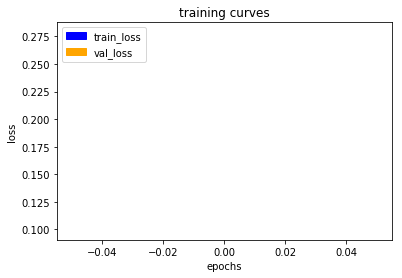

260/260 [==============================] - 60s - loss: 0.2773 - val_loss: 0.0996
Epoch 2/25
258/260 [============================>.] - ETA: 0s - loss: 0.0516

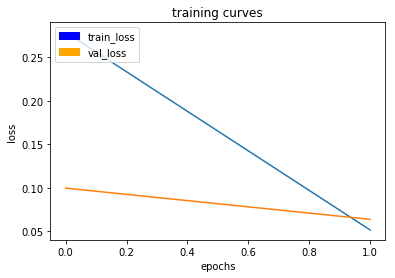

260/260 [==============================] - 57s - loss: 0.0515 - val_loss: 0.0637
Epoch 3/25
258/260 [============================>.] - ETA: 0s - loss: 0.0445

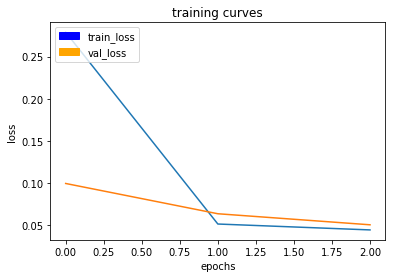

260/260 [==============================] - 58s - loss: 0.0444 - val_loss: 0.0506
Epoch 4/25
259/260 [============================>.] - ETA: 0s - loss: 0.0411

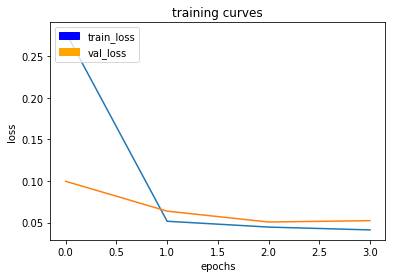

260/260 [==============================] - 60s - loss: 0.0411 - val_loss: 0.0523
Epoch 5/25
258/260 [============================>.] - ETA: 0s - loss: 0.0388

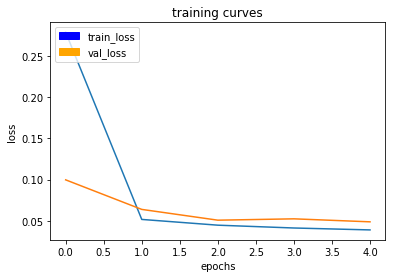

260/260 [==============================] - 60s - loss: 0.0388 - val_loss: 0.0486
Epoch 6/25
258/260 [============================>.] - ETA: 0s - loss: 0.0375

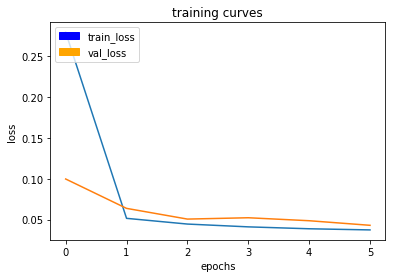

260/260 [==============================] - 59s - loss: 0.0374 - val_loss: 0.0430
Epoch 7/25
258/260 [============================>.] - ETA: 0s - loss: 0.0353

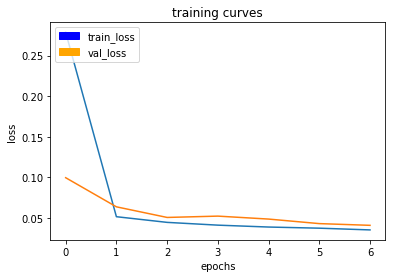

260/260 [==============================] - 59s - loss: 0.0353 - val_loss: 0.0409
Epoch 8/25
258/260 [============================>.] - ETA: 0s - loss: 0.0341

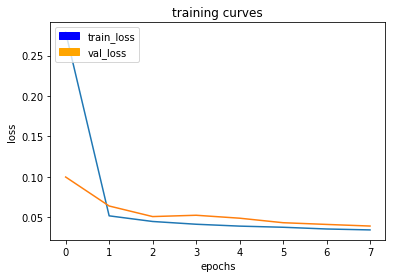

260/260 [==============================] - 60s - loss: 0.0341 - val_loss: 0.0389
Epoch 9/25
258/260 [============================>.] - ETA: 0s - loss: 0.0333

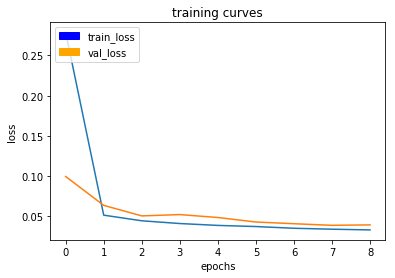

260/260 [==============================] - 59s - loss: 0.0332 - val_loss: 0.0395
Epoch 10/25
258/260 [============================>.] - ETA: 0s - loss: 0.0328

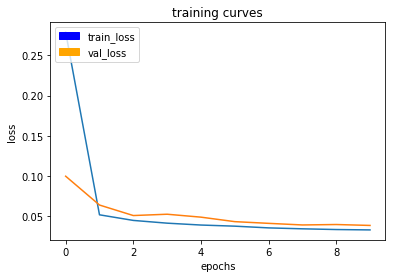

260/260 [==============================] - 60s - loss: 0.0327 - val_loss: 0.0383
Epoch 11/25
258/260 [============================>.] - ETA: 0s - loss: 0.0313

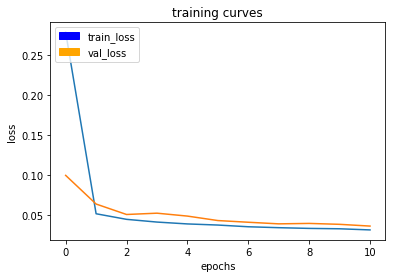

260/260 [==============================] - 60s - loss: 0.0313 - val_loss: 0.0361
Epoch 12/25
258/260 [============================>.] - ETA: 0s - loss: 0.0308

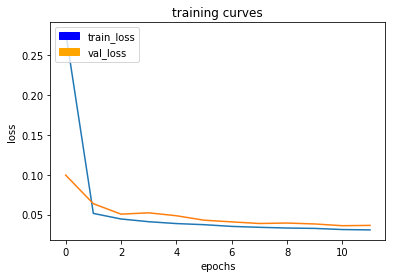

260/260 [==============================] - 60s - loss: 0.0309 - val_loss: 0.0365
Epoch 13/25
258/260 [============================>.] - ETA: 0s - loss: 0.0300

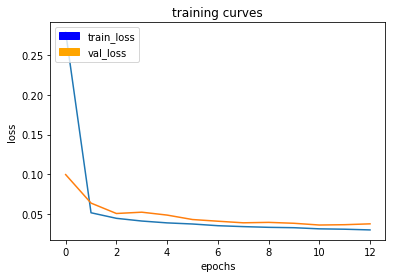

260/260 [==============================] - 60s - loss: 0.0299 - val_loss: 0.0376
Epoch 14/25
258/260 [============================>.] - ETA: 0s - loss: 0.0295

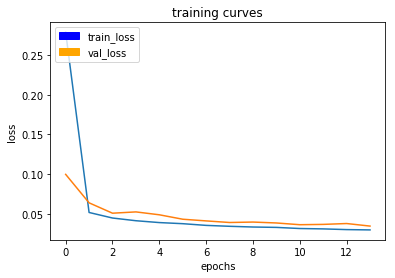

260/260 [==============================] - 60s - loss: 0.0296 - val_loss: 0.0344
Epoch 15/25
258/260 [============================>.] - ETA: 0s - loss: 0.0295

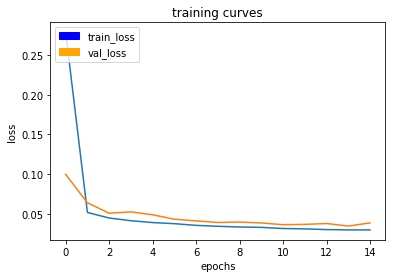

260/260 [==============================] - 60s - loss: 0.0296 - val_loss: 0.0384
Epoch 16/25
259/260 [============================>.] - ETA: 0s - loss: 0.0290

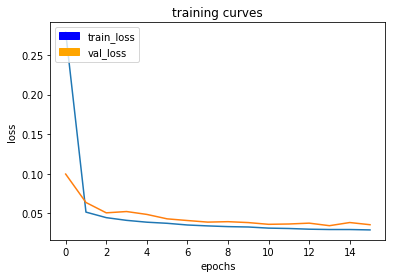

260/260 [==============================] - 59s - loss: 0.0290 - val_loss: 0.0356
Epoch 17/25
258/260 [============================>.] - ETA: 0s - loss: 0.0285

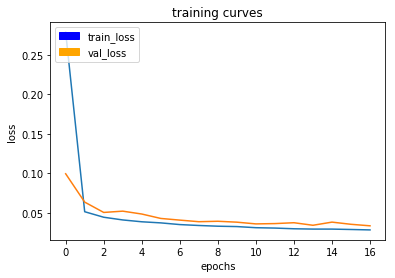

260/260 [==============================] - 60s - loss: 0.0285 - val_loss: 0.0337
Epoch 18/25
258/260 [============================>.] - ETA: 0s - loss: 0.0280

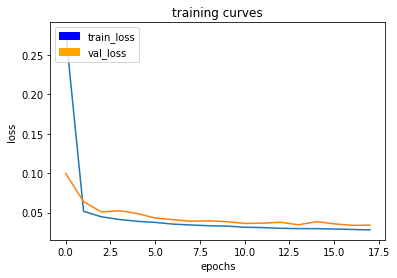

260/260 [==============================] - 60s - loss: 0.0279 - val_loss: 0.0339
Epoch 19/25
259/260 [============================>.] - ETA: 0s - loss: 0.0279

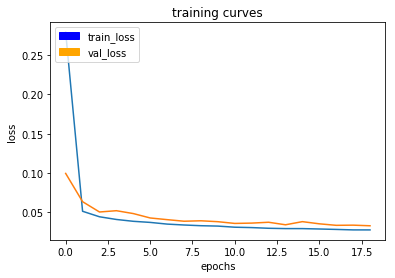

260/260 [==============================] - 60s - loss: 0.0279 - val_loss: 0.0332
Epoch 20/25
258/260 [============================>.] - ETA: 0s - loss: 0.0271

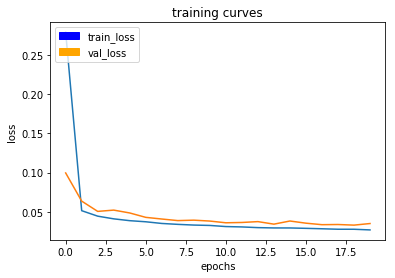

260/260 [==============================] - 60s - loss: 0.0270 - val_loss: 0.0352
Epoch 21/25
259/260 [============================>.] - ETA: 0s - loss: 0.0271

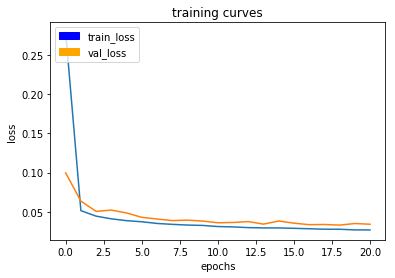

260/260 [==============================] - 60s - loss: 0.0271 - val_loss: 0.0343
Epoch 22/25
258/260 [============================>.] - ETA: 0s - loss: 0.0268

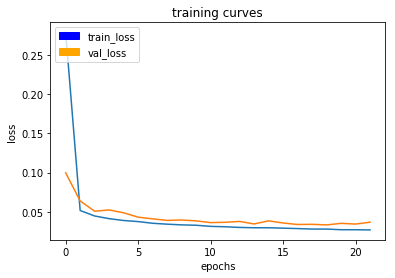

260/260 [==============================] - 60s - loss: 0.0269 - val_loss: 0.0366
Epoch 23/25
259/260 [============================>.] - ETA: 0s - loss: 0.0266

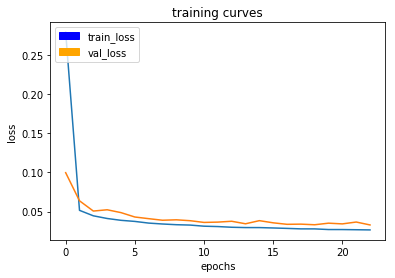

260/260 [==============================] - 60s - loss: 0.0265 - val_loss: 0.0329
Epoch 24/25
258/260 [============================>.] - ETA: 0s - loss: 0.0258

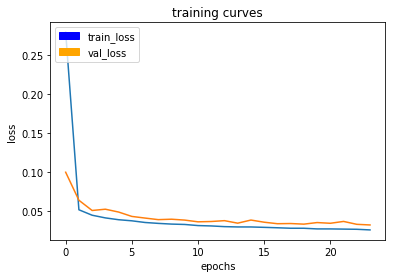

260/260 [==============================] - 60s - loss: 0.0257 - val_loss: 0.0321
Epoch 25/25
258/260 [============================>.] - ETA: 0s - loss: 0.0250

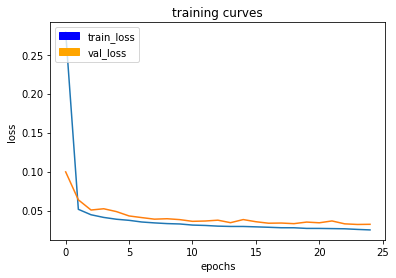

260/260 [==============================] - 60s - loss: 0.0250 - val_loss: 0.0323


In [206]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [207]:
end = time.time()

In [208]:
print(end - start)

1532.070952653885


In [209]:
# Save your trained model weights
weight_file_name = 'model_weights_32_e25_new_2.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [210]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [211]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

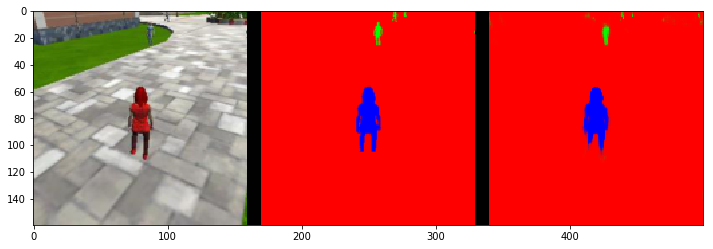

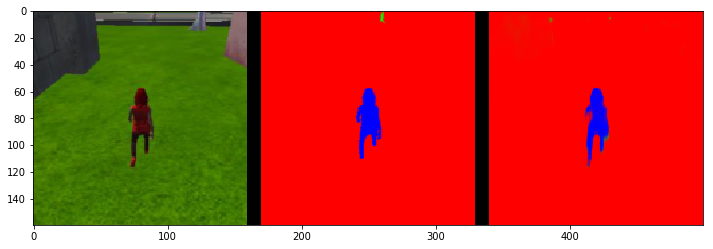

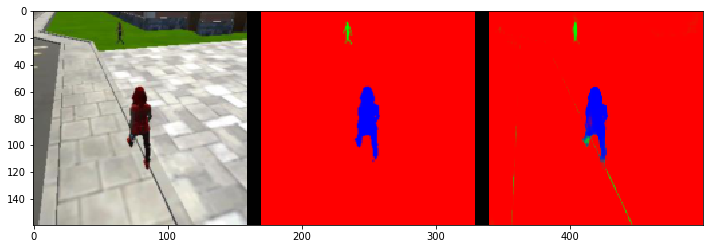

In [212]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

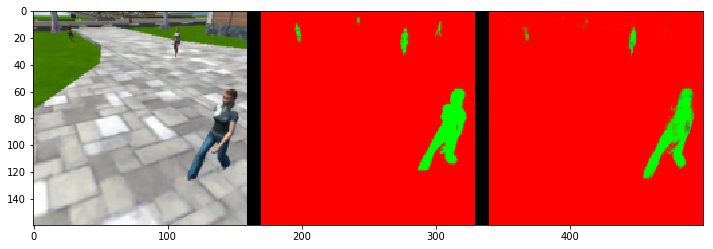

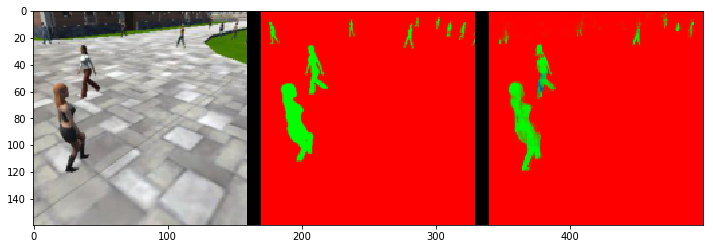

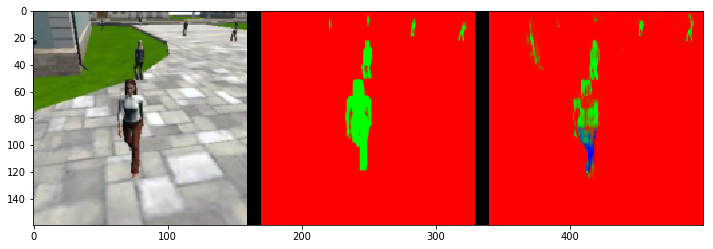

In [213]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

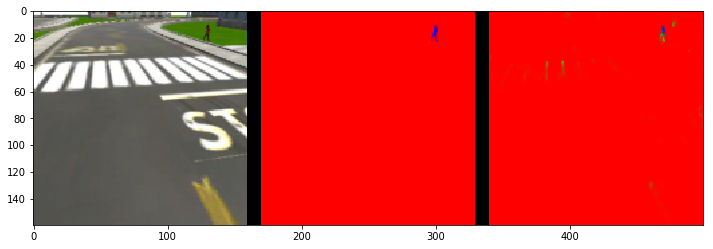

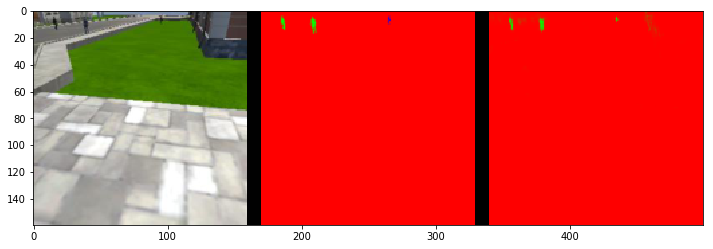

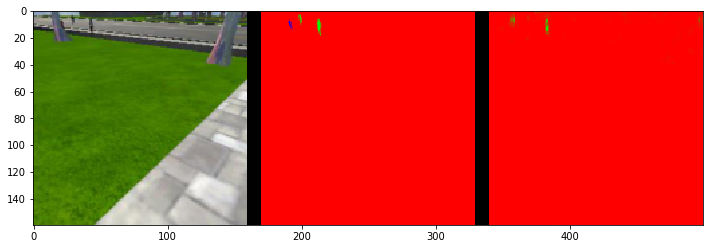

In [214]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [215]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.993914362064092
average intersection over union for other people is 0.2831397015709453
average intersection over union for the hero is 0.8445190133869973
number true positives: 539, number false positives: 0, number false negatives: 0


In [216]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9801250308926363
average intersection over union for other people is 0.5915518969654081
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 72, number false negatives: 0


In [217]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9953376008556506
average intersection over union for other people is 0.37505393565129597
average intersection over union for the hero is 0.15625467212394037
number true positives: 118, number false positives: 1, number false negatives: 183


In [218]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.71960569550931


In [219]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.5003868427554689


In [220]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.3600812220047569


In [225]:
learning_rate = 0.001
batch_size = 32
num_epochs = 60
steps_per_epoch = 260
validation_steps = 75
workers = 2

In [226]:
import time
start = time.time()

In [227]:
output_layer = fcn_model_var3(inputs, num_classes)

Epoch 1/60
258/260 [============================>.] - ETA: 0s - loss: 0.2751

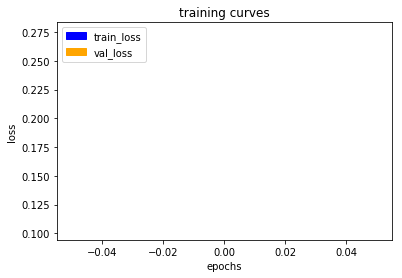

260/260 [==============================] - 60s - loss: 0.2734 - val_loss: 0.1029
Epoch 2/60
259/260 [============================>.] - ETA: 0s - loss: 0.0531- ETA: 0s - loss: 0.0

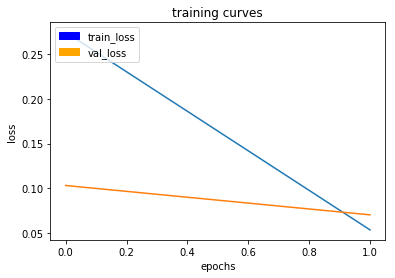

260/260 [==============================] - 59s - loss: 0.0531 - val_loss: 0.0700
Epoch 3/60
258/260 [============================>.] - ETA: 0s - loss: 0.0468

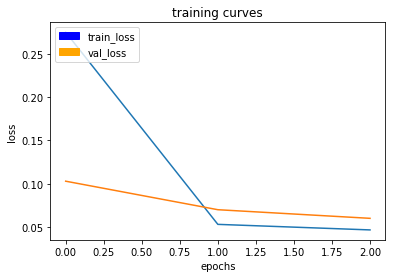

260/260 [==============================] - 60s - loss: 0.0467 - val_loss: 0.0601
Epoch 4/60
258/260 [============================>.] - ETA: 0s - loss: 0.0438

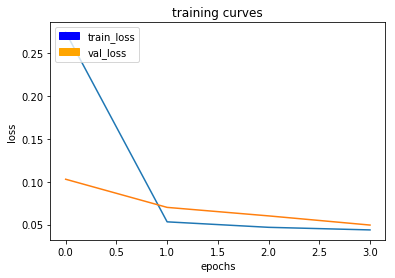

260/260 [==============================] - 59s - loss: 0.0437 - val_loss: 0.0494
Epoch 5/60
259/260 [============================>.] - ETA: 0s - loss: 0.0407

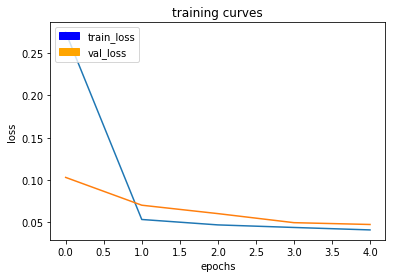

260/260 [==============================] - 60s - loss: 0.0407 - val_loss: 0.0472
Epoch 6/60
259/260 [============================>.] - ETA: 0s - loss: 0.0386

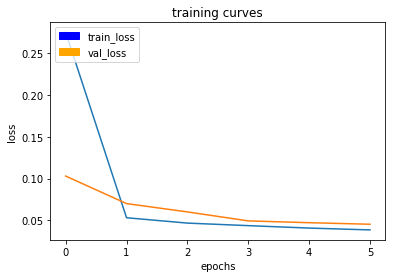

260/260 [==============================] - 59s - loss: 0.0385 - val_loss: 0.0453
Epoch 7/60
259/260 [============================>.] - ETA: 0s - loss: 0.0368- ETA: 3s

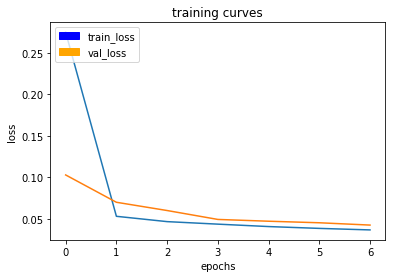

260/260 [==============================] - 60s - loss: 0.0368 - val_loss: 0.0426
Epoch 8/60
258/260 [============================>.] - ETA: 0s - loss: 0.0354

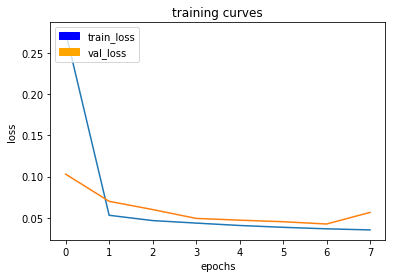

260/260 [==============================] - 60s - loss: 0.0354 - val_loss: 0.0566
Epoch 9/60
258/260 [============================>.] - ETA: 0s - loss: 0.0345

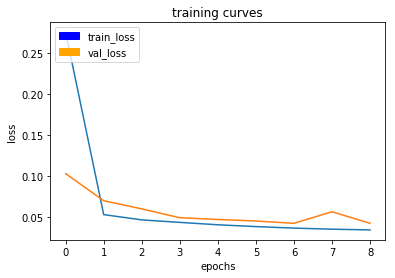

260/260 [==============================] - 61s - loss: 0.0344 - val_loss: 0.0425
Epoch 10/60
259/260 [============================>.] - ETA: 0s - loss: 0.0337

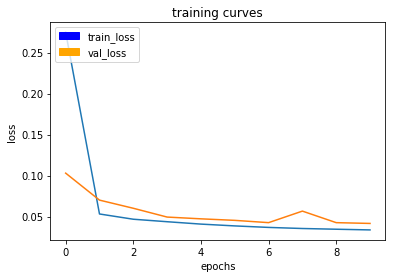

260/260 [==============================] - 61s - loss: 0.0337 - val_loss: 0.0416
Epoch 11/60
258/260 [============================>.] - ETA: 0s - loss: 0.0321

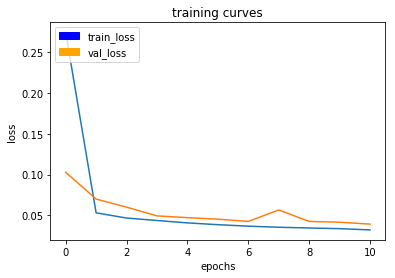

260/260 [==============================] - 61s - loss: 0.0321 - val_loss: 0.0392
Epoch 12/60
258/260 [============================>.] - ETA: 0s - loss: 0.0317

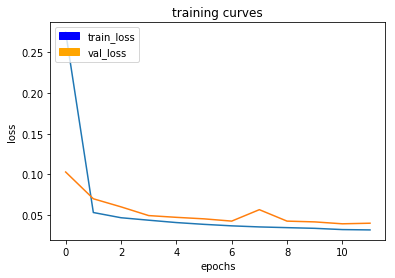

260/260 [==============================] - 61s - loss: 0.0319 - val_loss: 0.0400
Epoch 13/60
258/260 [============================>.] - ETA: 0s - loss: 0.0310

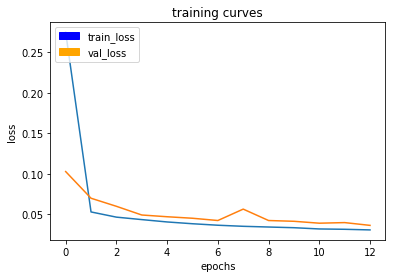

260/260 [==============================] - 61s - loss: 0.0309 - val_loss: 0.0366
Epoch 14/60
258/260 [============================>.] - ETA: 0s - loss: 0.0300

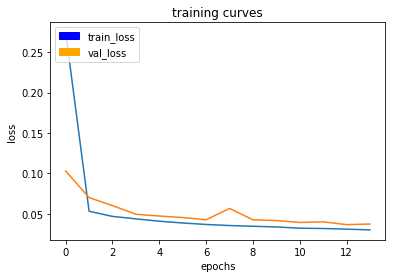

260/260 [==============================] - 61s - loss: 0.0300 - val_loss: 0.0373
Epoch 15/60
259/260 [============================>.] - ETA: 0s - loss: 0.0294

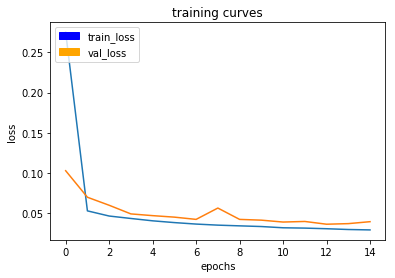

260/260 [==============================] - 60s - loss: 0.0294 - val_loss: 0.0397
Epoch 16/60
258/260 [============================>.] - ETA: 0s - loss: 0.0302

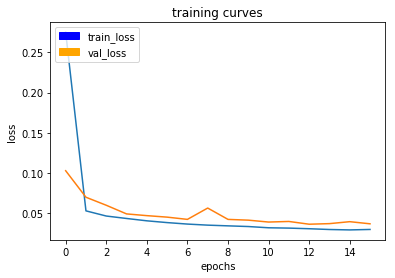

260/260 [==============================] - 61s - loss: 0.0302 - val_loss: 0.0371
Epoch 17/60
258/260 [============================>.] - ETA: 0s - loss: 0.0296

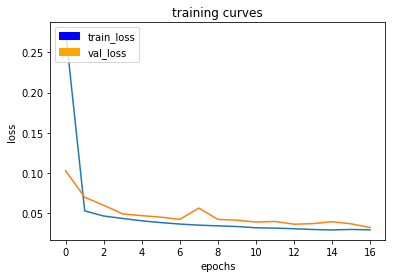

260/260 [==============================] - 61s - loss: 0.0295 - val_loss: 0.0325
Epoch 18/60
258/260 [============================>.] - ETA: 0s - loss: 0.0280

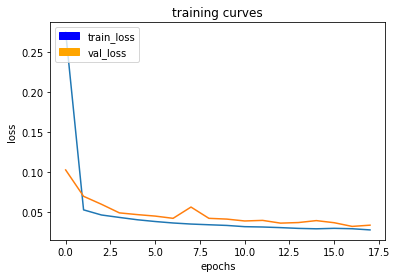

260/260 [==============================] - 61s - loss: 0.0280 - val_loss: 0.0340
Epoch 19/60
258/260 [============================>.] - ETA: 0s - loss: 0.0279

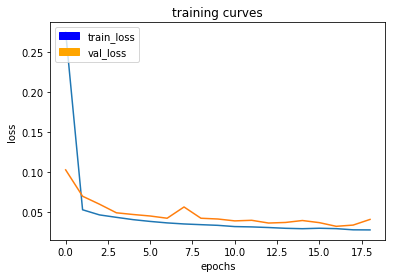

260/260 [==============================] - 61s - loss: 0.0279 - val_loss: 0.0411
Epoch 20/60
258/260 [============================>.] - ETA: 0s - loss: 0.0275

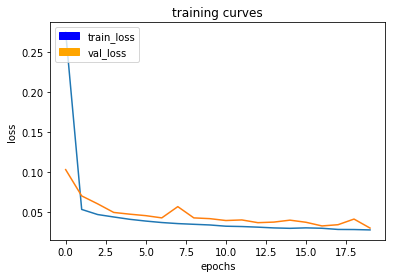

260/260 [==============================] - 60s - loss: 0.0276 - val_loss: 0.0298
Epoch 21/60
259/260 [============================>.] - ETA: 0s - loss: 0.0269

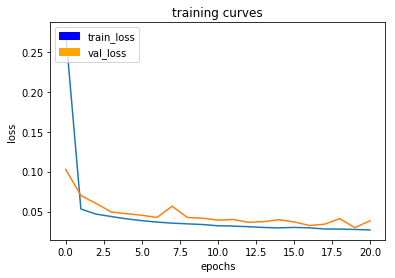

260/260 [==============================] - 60s - loss: 0.0270 - val_loss: 0.0384
Epoch 22/60
259/260 [============================>.] - ETA: 0s - loss: 0.0271

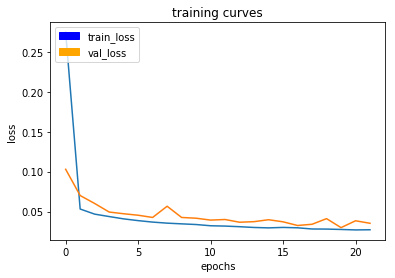

260/260 [==============================] - 60s - loss: 0.0271 - val_loss: 0.0352
Epoch 23/60
259/260 [============================>.] - ETA: 0s - loss: 0.0264

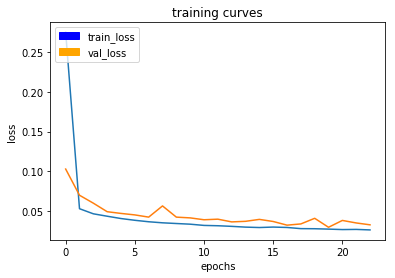

260/260 [==============================] - 61s - loss: 0.0264 - val_loss: 0.0329
Epoch 24/60
259/260 [============================>.] - ETA: 0s - loss: 0.0266

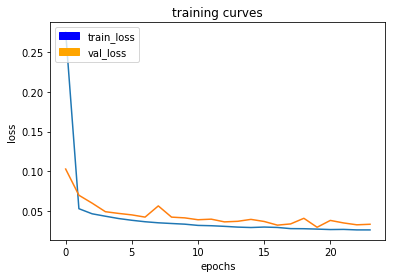

260/260 [==============================] - 61s - loss: 0.0266 - val_loss: 0.0336
Epoch 25/60
259/260 [============================>.] - ETA: 0s - loss: 0.0254

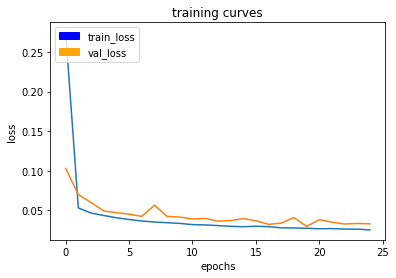

260/260 [==============================] - 61s - loss: 0.0254 - val_loss: 0.0331
Epoch 26/60
259/260 [============================>.] - ETA: 0s - loss: 0.0256

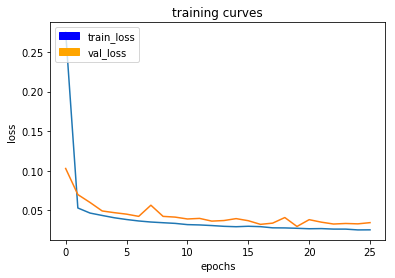

260/260 [==============================] - 60s - loss: 0.0256 - val_loss: 0.0346
Epoch 27/60
258/260 [============================>.] - ETA: 0s - loss: 0.0262

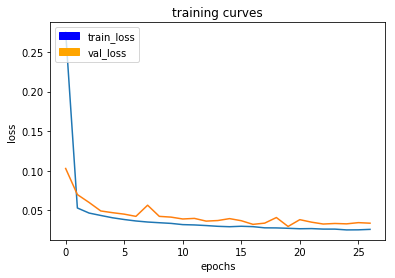

260/260 [==============================] - 60s - loss: 0.0262 - val_loss: 0.0339
Epoch 28/60
258/260 [============================>.] - ETA: 0s - loss: 0.0254

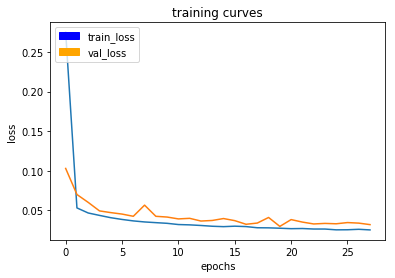

260/260 [==============================] - 60s - loss: 0.0254 - val_loss: 0.0320
Epoch 29/60
259/260 [============================>.] - ETA: 0s - loss: 0.0249

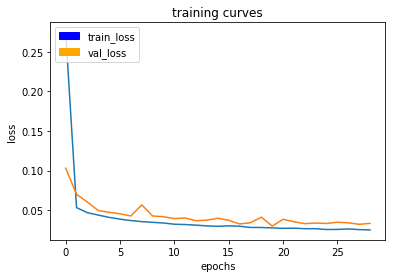

260/260 [==============================] - 60s - loss: 0.0250 - val_loss: 0.0332
Epoch 30/60
258/260 [============================>.] - ETA: 0s - loss: 0.0248

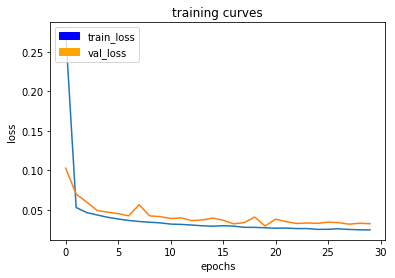

260/260 [==============================] - 60s - loss: 0.0248 - val_loss: 0.0327
Epoch 31/60
258/260 [============================>.] - ETA: 0s - loss: 0.0244

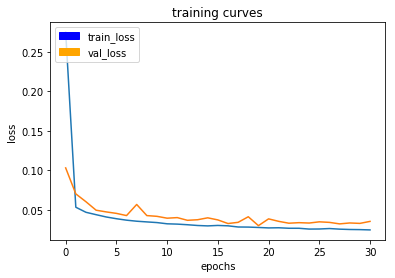

260/260 [==============================] - 60s - loss: 0.0244 - val_loss: 0.0352
Epoch 32/60
258/260 [============================>.] - ETA: 0s - loss: 0.0241

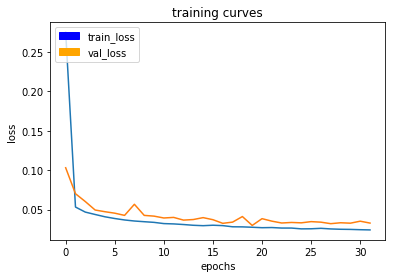

260/260 [==============================] - 60s - loss: 0.0240 - val_loss: 0.0328
Epoch 33/60
258/260 [============================>.] - ETA: 0s - loss: 0.0239

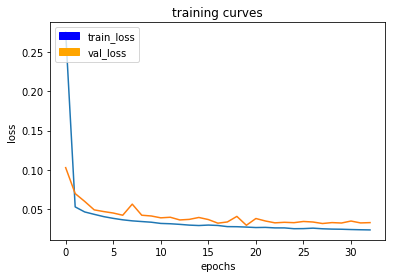

260/260 [==============================] - 60s - loss: 0.0239 - val_loss: 0.0332
Epoch 34/60
259/260 [============================>.] - ETA: 0s - loss: 0.0242

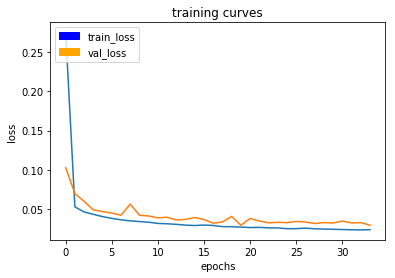

260/260 [==============================] - 60s - loss: 0.0242 - val_loss: 0.0298
Epoch 35/60
258/260 [============================>.] - ETA: 0s - loss: 0.0242

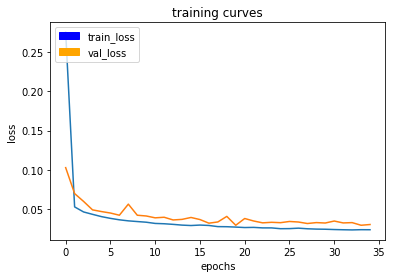

260/260 [==============================] - 60s - loss: 0.0242 - val_loss: 0.0308
Epoch 36/60
258/260 [============================>.] - ETA: 0s - loss: 0.0233

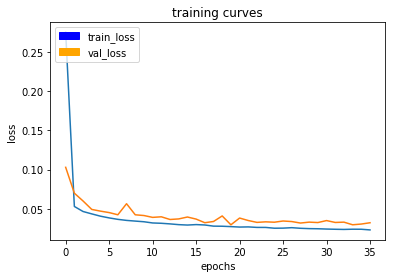

260/260 [==============================] - 61s - loss: 0.0233 - val_loss: 0.0324
Epoch 37/60
258/260 [============================>.] - ETA: 0s - loss: 0.0238

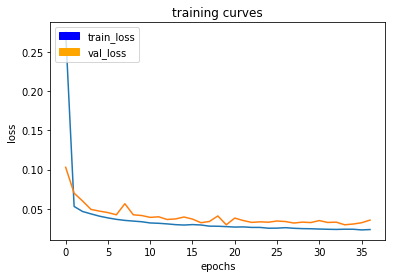

260/260 [==============================] - 60s - loss: 0.0238 - val_loss: 0.0358
Epoch 38/60
259/260 [============================>.] - ETA: 0s - loss: 0.0233

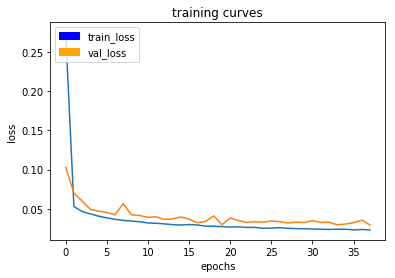

260/260 [==============================] - 61s - loss: 0.0233 - val_loss: 0.0295
Epoch 39/60
258/260 [============================>.] - ETA: 0s - loss: 0.0225

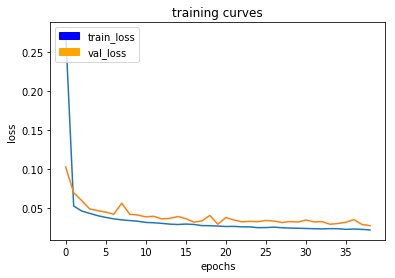

260/260 [==============================] - 60s - loss: 0.0225 - val_loss: 0.0280
Epoch 40/60
259/260 [============================>.] - ETA: 0s - loss: 0.0233

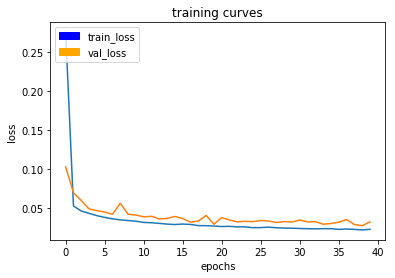

260/260 [==============================] - 61s - loss: 0.0233 - val_loss: 0.0328
Epoch 41/60
258/260 [============================>.] - ETA: 0s - loss: 0.0229

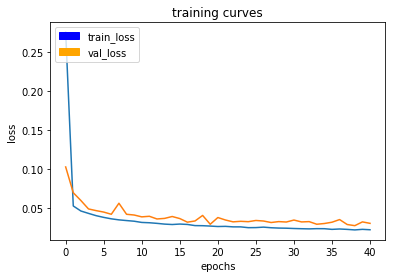

260/260 [==============================] - 61s - loss: 0.0229 - val_loss: 0.0310
Epoch 42/60
258/260 [============================>.] - ETA: 0s - loss: 0.0232

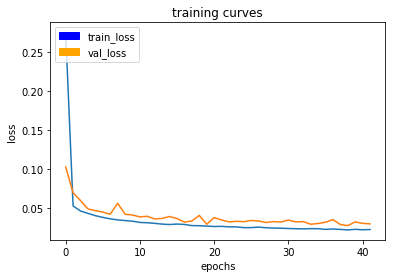

260/260 [==============================] - 61s - loss: 0.0231 - val_loss: 0.0303
Epoch 43/60
258/260 [============================>.] - ETA: 0s - loss: 0.0227

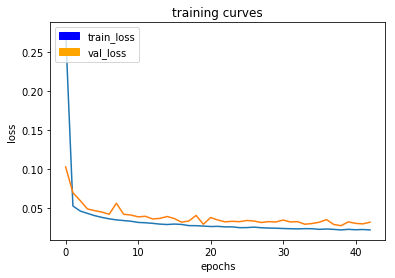

260/260 [==============================] - 61s - loss: 0.0226 - val_loss: 0.0324
Epoch 44/60
259/260 [============================>.] - ETA: 0s - loss: 0.0222

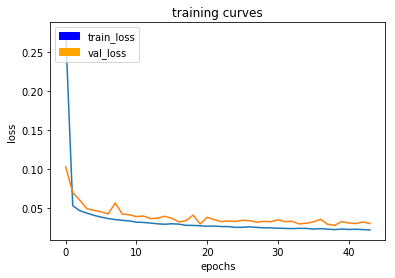

260/260 [==============================] - 60s - loss: 0.0223 - val_loss: 0.0304
Epoch 45/60
259/260 [============================>.] - ETA: 0s - loss: 0.0224

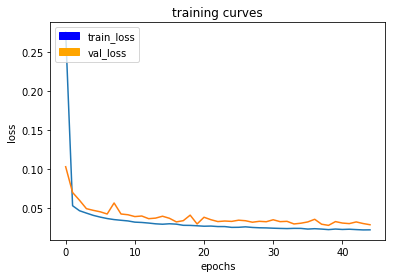

260/260 [==============================] - 61s - loss: 0.0224 - val_loss: 0.0288
Epoch 46/60
258/260 [============================>.] - ETA: 0s - loss: 0.0218

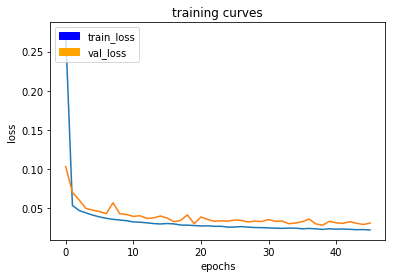

260/260 [==============================] - 60s - loss: 0.0219 - val_loss: 0.0305
Epoch 47/60
259/260 [============================>.] - ETA: 0s - loss: 0.0218

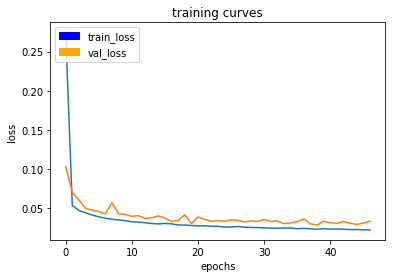

260/260 [==============================] - 60s - loss: 0.0219 - val_loss: 0.0329
Epoch 48/60
258/260 [============================>.] - ETA: 0s - loss: 0.0218

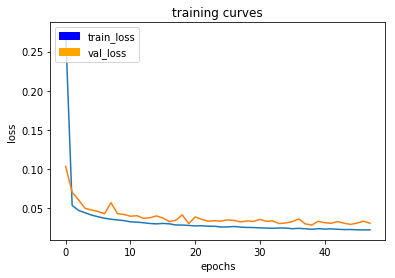

260/260 [==============================] - 61s - loss: 0.0219 - val_loss: 0.0303
Epoch 49/60
259/260 [============================>.] - ETA: 0s - loss: 0.0224

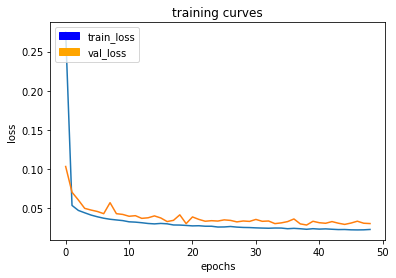

260/260 [==============================] - 60s - loss: 0.0224 - val_loss: 0.0299
Epoch 50/60
259/260 [============================>.] - ETA: 0s - loss: 0.0217

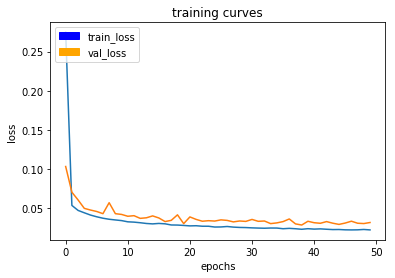

260/260 [==============================] - 61s - loss: 0.0217 - val_loss: 0.0312
Epoch 51/60
258/260 [============================>.] - ETA: 0s - loss: 0.0218

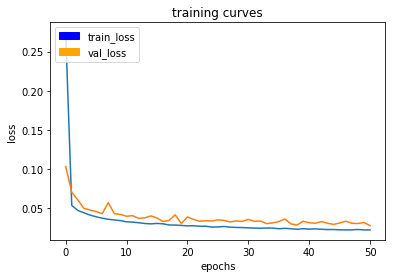

260/260 [==============================] - 60s - loss: 0.0218 - val_loss: 0.0273
Epoch 52/60
258/260 [============================>.] - ETA: 0s - loss: 0.0213

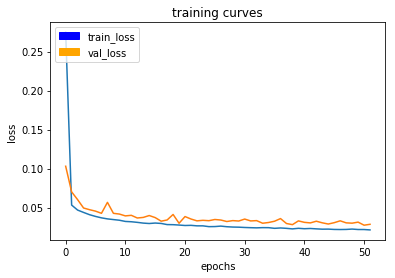

260/260 [==============================] - 61s - loss: 0.0213 - val_loss: 0.0285
Epoch 53/60
259/260 [============================>.] - ETA: 0s - loss: 0.0212

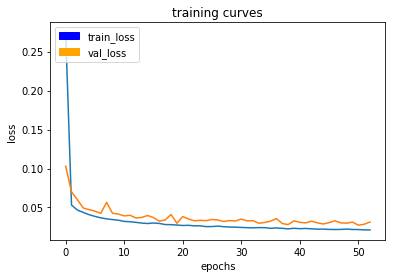

260/260 [==============================] - 60s - loss: 0.0212 - val_loss: 0.0314
Epoch 54/60
258/260 [============================>.] - ETA: 0s - loss: 0.0218

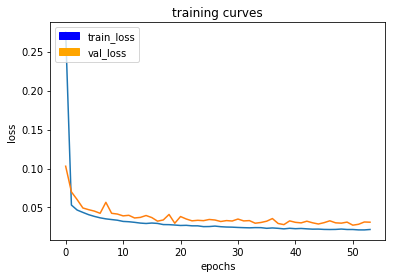

260/260 [==============================] - 60s - loss: 0.0219 - val_loss: 0.0311
Epoch 55/60
259/260 [============================>.] - ETA: 0s - loss: 0.0213

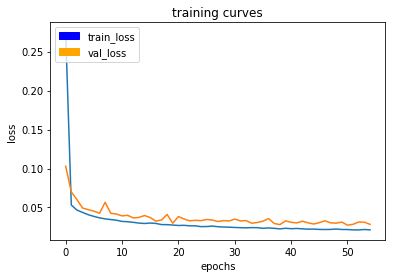

260/260 [==============================] - 61s - loss: 0.0213 - val_loss: 0.0284
Epoch 56/60
259/260 [============================>.] - ETA: 0s - loss: 0.0214

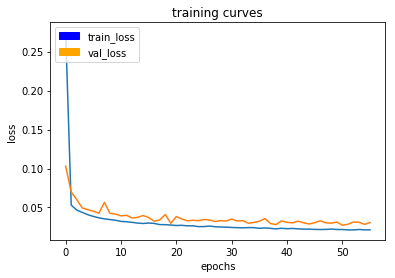

260/260 [==============================] - 61s - loss: 0.0214 - val_loss: 0.0307
Epoch 57/60
259/260 [============================>.] - ETA: 0s - loss: 0.0212

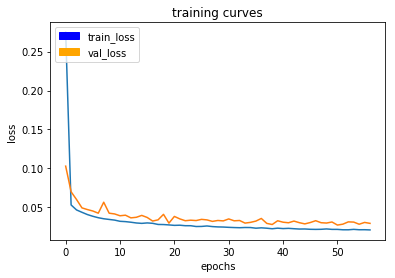

260/260 [==============================] - 60s - loss: 0.0212 - val_loss: 0.0295
Epoch 58/60
259/260 [============================>.] - ETA: 0s - loss: 0.0207

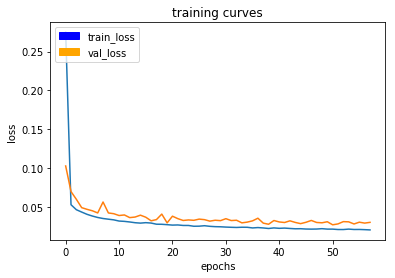

260/260 [==============================] - 60s - loss: 0.0207 - val_loss: 0.0305
Epoch 59/60
258/260 [============================>.] - ETA: 0s - loss: 0.0211

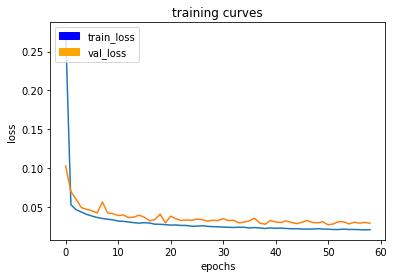

260/260 [==============================] - 60s - loss: 0.0210 - val_loss: 0.0293
Epoch 60/60
259/260 [============================>.] - ETA: 0s - loss: 0.0206

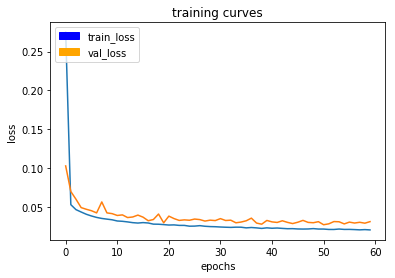

260/260 [==============================] - 60s - loss: 0.0206 - val_loss: 0.0313


In [228]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [229]:
end = time.time()

In [230]:
print(end - start)

3654.8450713157654


In [231]:
# Save your trained model weights
weight_file_name = 'model_weights_32_e25_new_2.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [232]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [233]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

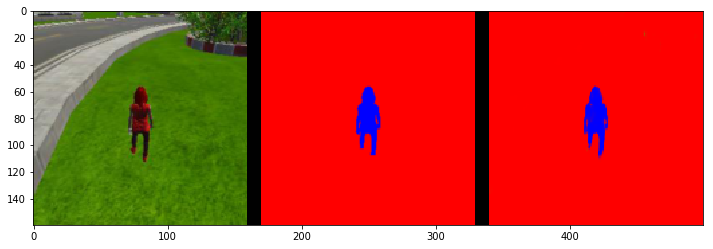

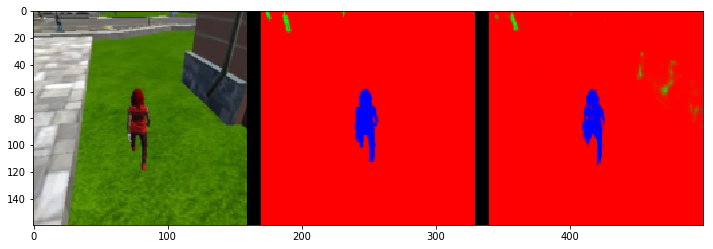

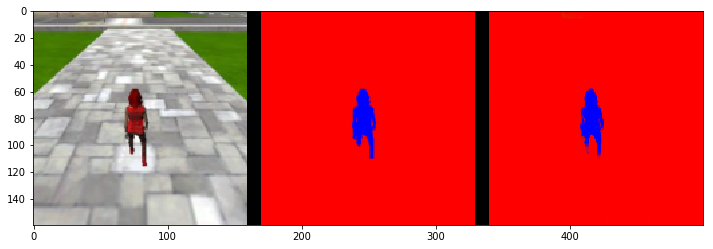

In [234]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

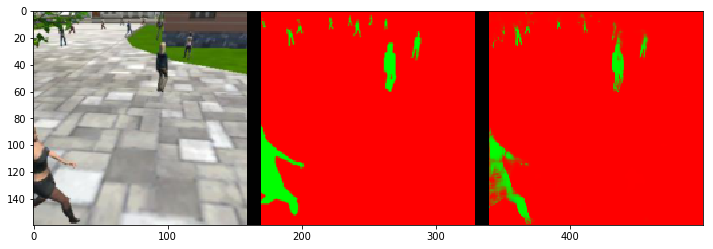

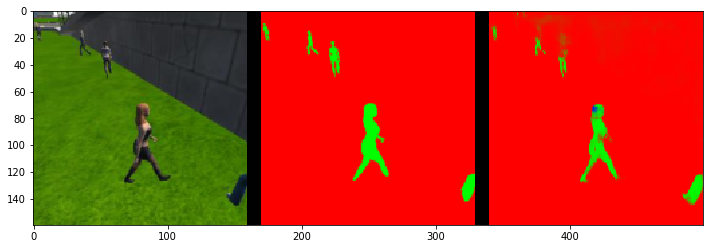

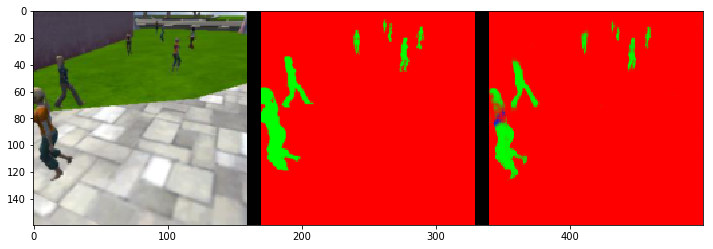

In [235]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

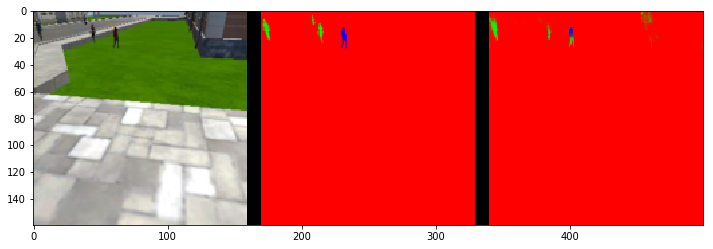

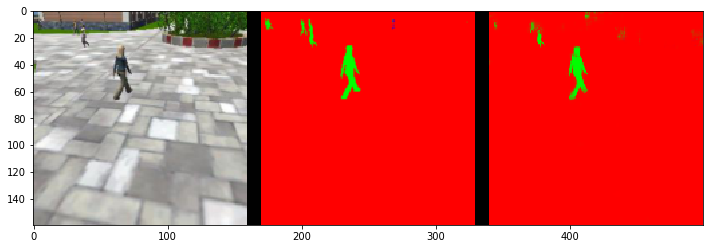

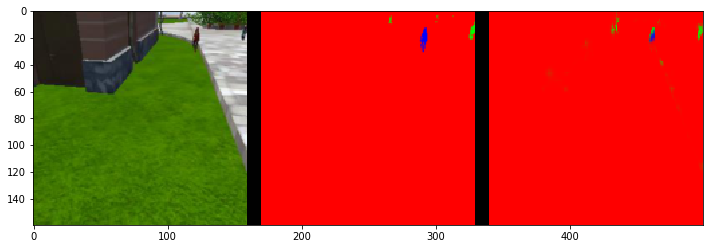

In [236]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [237]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.994615617993228
average intersection over union for other people is 0.3025993991682243
average intersection over union for the hero is 0.8608237964338468
number true positives: 539, number false positives: 0, number false negatives: 0


In [238]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.983098988178094
average intersection over union for other people is 0.6235916176923572
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 123, number false negatives: 0


In [239]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9956982121368182
average intersection over union for other people is 0.3934255608707534
average intersection over union for the hero is 0.19721233139103728
number true positives: 137, number false positives: 3, number false negatives: 164


In [240]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.6997929606625258


In [241]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.529018063912442


In [242]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.3702031171892451


In [281]:
learning_rate = 0.001
batch_size = 64
num_epochs = 15
steps_per_epoch = 120
validation_steps = 20
workers = 2

In [282]:
import time
start = time.time()

In [283]:
output_layer = fcn_model_vgg(inputs, num_classes)

Epoch 1/15
119/120 [============================>.] - ETA: 0s - loss: 0.4784

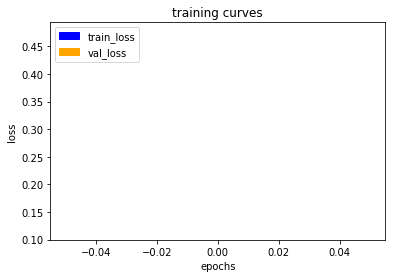

120/120 [==============================] - 78s - loss: 0.4750 - val_loss: 0.1176
Epoch 2/15
119/120 [============================>.] - ETA: 0s - loss: 0.0455

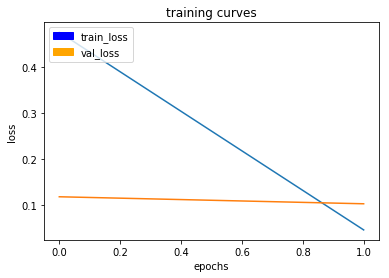

120/120 [==============================] - 76s - loss: 0.0454 - val_loss: 0.1023
Epoch 3/15
119/120 [============================>.] - ETA: 0s - loss: 0.0279

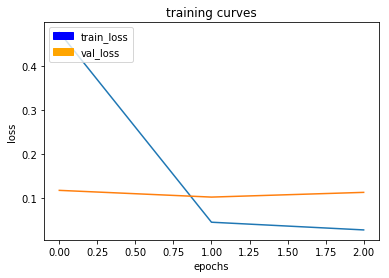

120/120 [==============================] - 76s - loss: 0.0279 - val_loss: 0.1130
Epoch 4/15
119/120 [============================>.] - ETA: 0s - loss: 0.0252

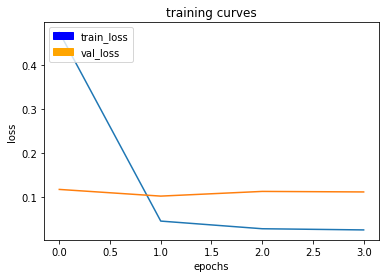

120/120 [==============================] - 77s - loss: 0.0253 - val_loss: 0.1118
Epoch 5/15
119/120 [============================>.] - ETA: 0s - loss: 0.0221

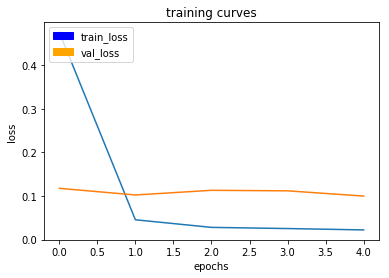

120/120 [==============================] - 77s - loss: 0.0221 - val_loss: 0.0998
Epoch 6/15
119/120 [============================>.] - ETA: 0s - loss: 0.0199

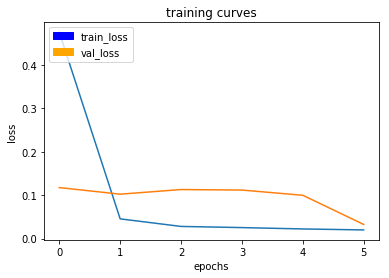

120/120 [==============================] - 77s - loss: 0.0199 - val_loss: 0.0325
Epoch 7/15
119/120 [============================>.] - ETA: 0s - loss: 0.0170

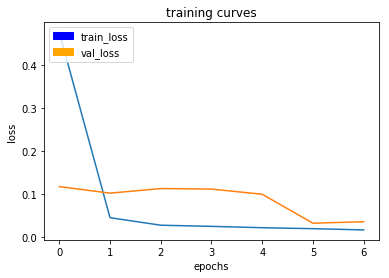

120/120 [==============================] - 77s - loss: 0.0170 - val_loss: 0.0361
Epoch 8/15
119/120 [============================>.] - ETA: 0s - loss: 0.0173

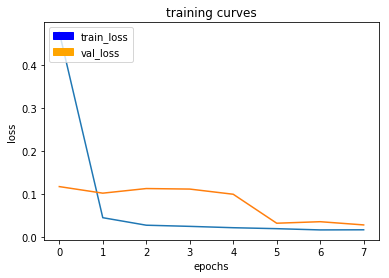

120/120 [==============================] - 77s - loss: 0.0173 - val_loss: 0.0286
Epoch 9/15
119/120 [============================>.] - ETA: 0s - loss: 0.0146

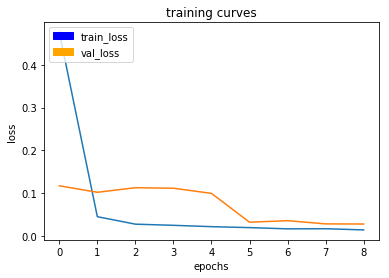

120/120 [==============================] - 77s - loss: 0.0145 - val_loss: 0.0283
Epoch 10/15
119/120 [============================>.] - ETA: 0s - loss: 0.0136

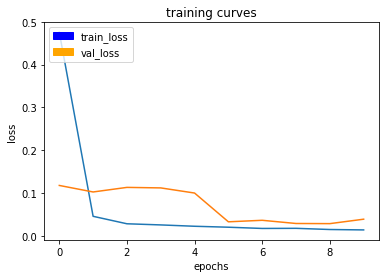

120/120 [==============================] - 77s - loss: 0.0136 - val_loss: 0.0386
Epoch 11/15
119/120 [============================>.] - ETA: 0s - loss: 0.0131

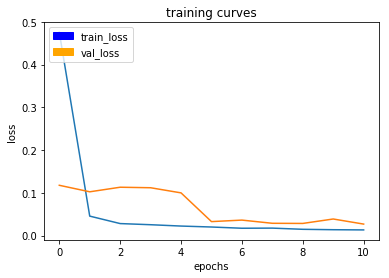

120/120 [==============================] - 77s - loss: 0.0131 - val_loss: 0.0267
Epoch 12/15
119/120 [============================>.] - ETA: 0s - loss: 0.0124

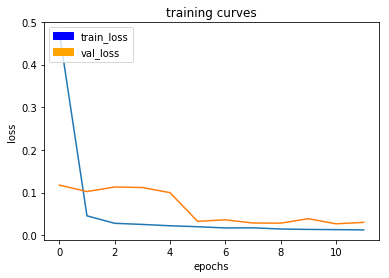

120/120 [==============================] - 76s - loss: 0.0124 - val_loss: 0.0301
Epoch 13/15
119/120 [============================>.] - ETA: 0s - loss: 0.0122

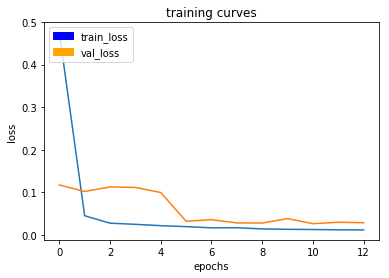

120/120 [==============================] - 78s - loss: 0.0121 - val_loss: 0.0290
Epoch 14/15
119/120 [============================>.] - ETA: 0s - loss: 0.0118

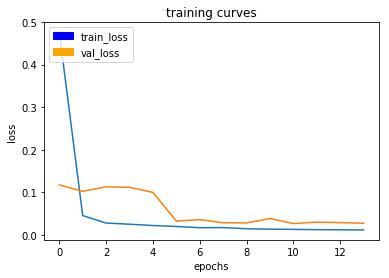

120/120 [==============================] - 77s - loss: 0.0118 - val_loss: 0.0275
Epoch 15/15
119/120 [============================>.] - ETA: 0s - loss: 0.0113

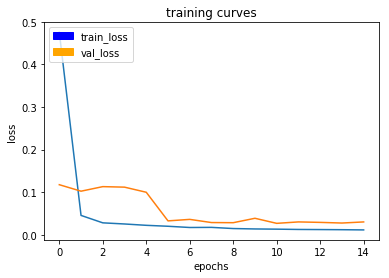

120/120 [==============================] - 77s - loss: 0.0113 - val_loss: 0.0301


In [284]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined_o'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation_o'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [285]:
end = time.time()

In [286]:
print(end - start)

1167.1650440692902


In [287]:
# Save your trained model weights
weight_file_name = 'model_weights_32_e25_new_2.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [288]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [289]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

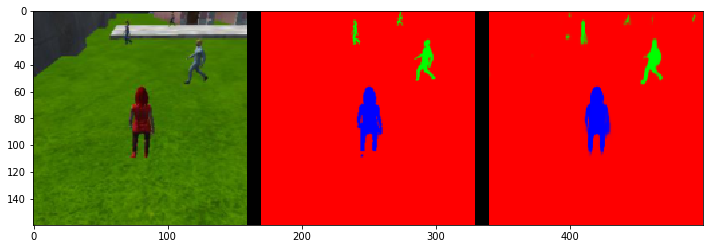

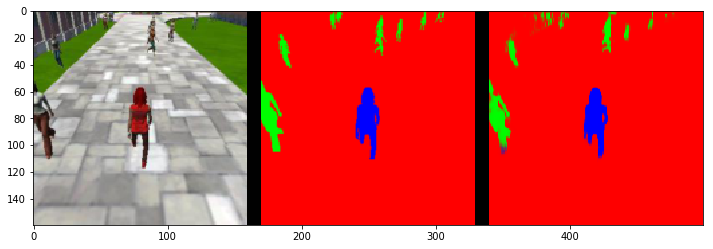

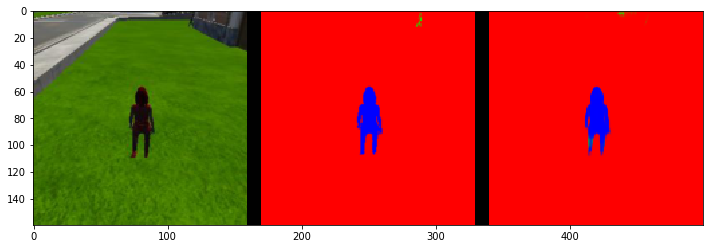

In [290]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

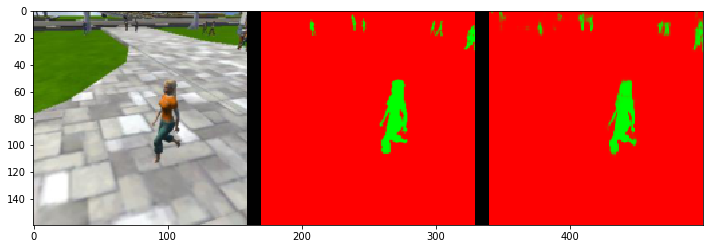

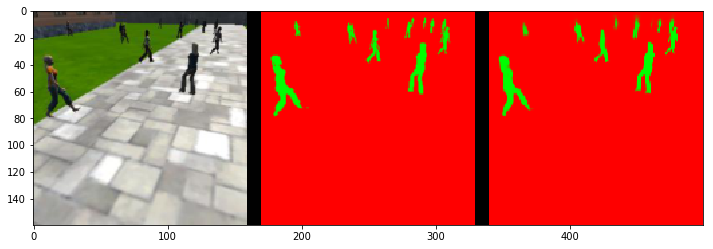

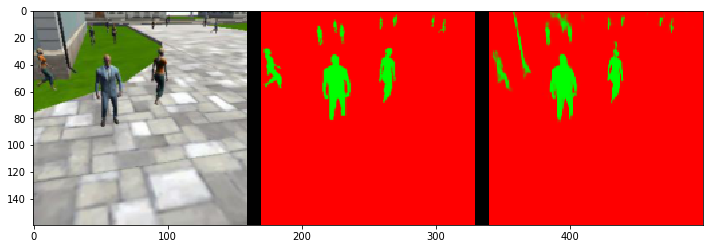

In [291]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

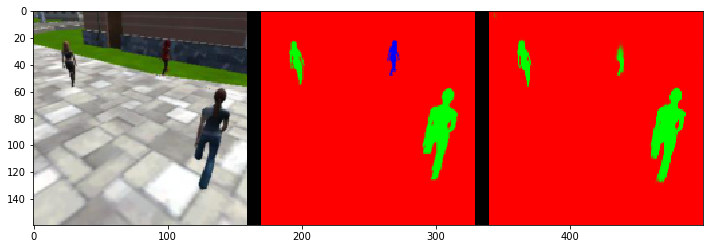

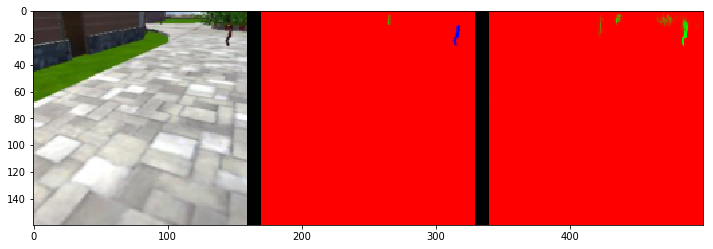

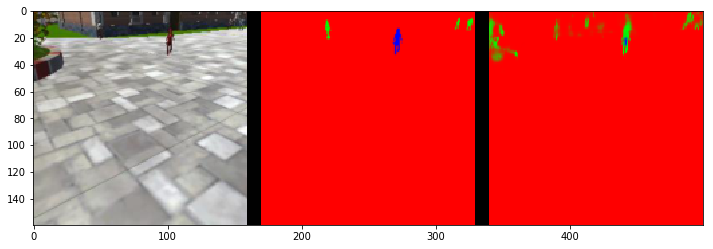

In [292]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [293]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9949880838742676
average intersection over union for other people is 0.35191924045388107
average intersection over union for the hero is 0.9084774820319746
number true positives: 539, number false positives: 0, number false negatives: 0


In [294]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9877240977328549
average intersection over union for other people is 0.7689674949012517
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 6, number false negatives: 0


In [295]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9959581606712181
average intersection over union for other people is 0.40571431672243485
average intersection over union for the hero is 0.09353771606711014
number true positives: 59, number false positives: 0, number false negatives: 242


In [296]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.706855791962175


In [297]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.5010075990495424


In [298]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.3541401232052321


In [13]:
learning_rate = 0.001
batch_size = 64
num_epochs = 30
steps_per_epoch = 120
validation_steps = 20
workers = 2

In [14]:
import time
start = time.time()

In [15]:
output_layer = fcn_model_vgg(inputs, num_classes)

Epoch 1/30
119/120 [============================>.] - ETA: 0s - loss: 0.4960

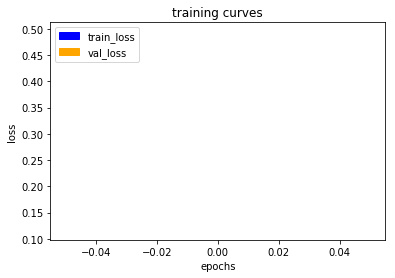

120/120 [==============================] - 79s - loss: 0.4925 - val_loss: 0.1171
Epoch 2/30
119/120 [============================>.] - ETA: 0s - loss: 0.0460

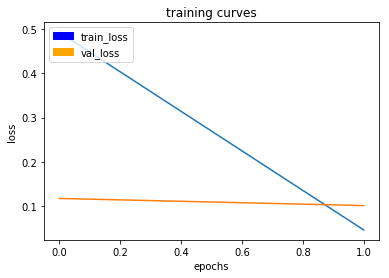

120/120 [==============================] - 76s - loss: 0.0459 - val_loss: 0.1010
Epoch 3/30
119/120 [============================>.] - ETA: 0s - loss: 0.0293

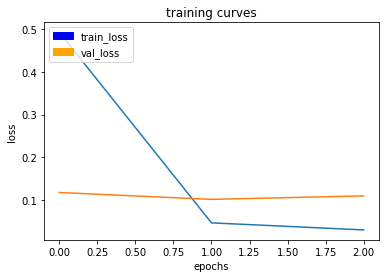

120/120 [==============================] - 77s - loss: 0.0293 - val_loss: 0.1092
Epoch 4/30
119/120 [============================>.] - ETA: 0s - loss: 0.0226

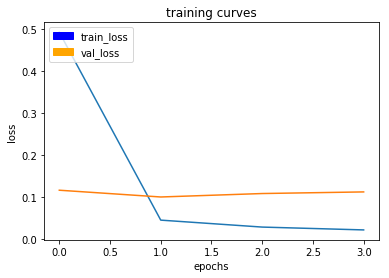

120/120 [==============================] - 78s - loss: 0.0225 - val_loss: 0.1130
Epoch 5/30
119/120 [============================>.] - ETA: 0s - loss: 0.0225

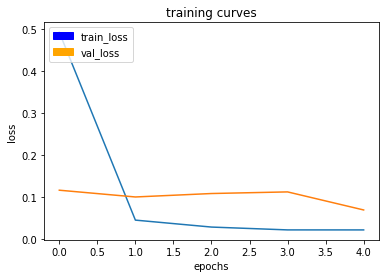

120/120 [==============================] - 78s - loss: 0.0225 - val_loss: 0.0700
Epoch 6/30
119/120 [============================>.] - ETA: 0s - loss: 0.0209

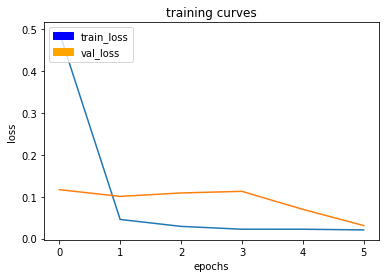

120/120 [==============================] - 77s - loss: 0.0208 - val_loss: 0.0313
Epoch 7/30
119/120 [============================>.] - ETA: 0s - loss: 0.0166

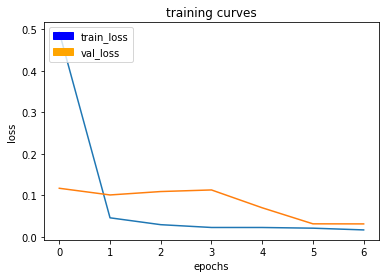

120/120 [==============================] - 78s - loss: 0.0167 - val_loss: 0.0312
Epoch 8/30
119/120 [============================>.] - ETA: 0s - loss: 0.0156

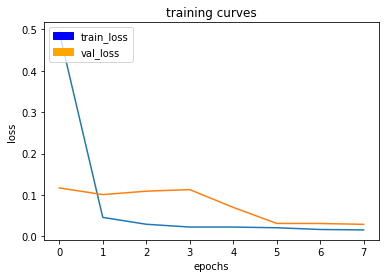

120/120 [==============================] - 78s - loss: 0.0156 - val_loss: 0.0291
Epoch 9/30
119/120 [============================>.] - ETA: 0s - loss: 0.0144

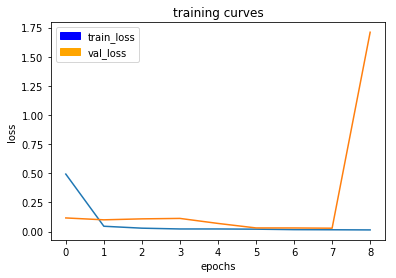

120/120 [==============================] - 77s - loss: 0.0144 - val_loss: 1.7101
Epoch 10/30
119/120 [============================>.] - ETA: 0s - loss: 0.0200

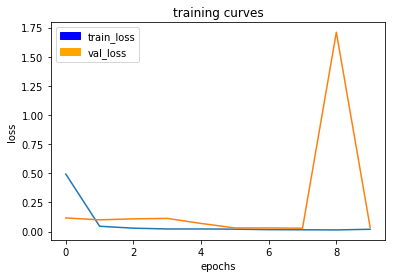

120/120 [==============================] - 77s - loss: 0.0199 - val_loss: 0.0365
Epoch 11/30
119/120 [============================>.] - ETA: 0s - loss: 0.0166

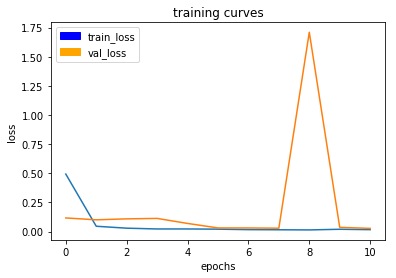

120/120 [==============================] - 78s - loss: 0.0166 - val_loss: 0.0274
Epoch 12/30
119/120 [============================>.] - ETA: 0s - loss: 0.0195

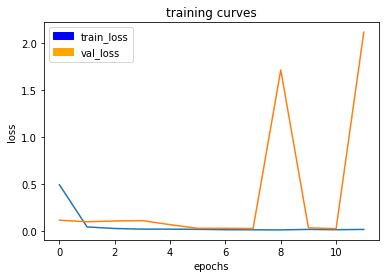

120/120 [==============================] - 78s - loss: 0.0196 - val_loss: 2.1107
Epoch 13/30
119/120 [============================>.] - ETA: 0s - loss: 0.0221

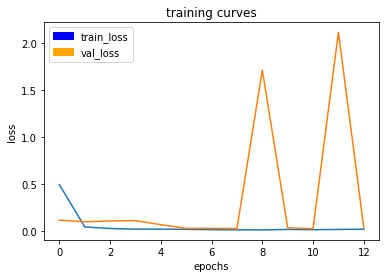

120/120 [==============================] - 78s - loss: 0.0220 - val_loss: 0.0380
Epoch 14/30
119/120 [============================>.] - ETA: 0s - loss: 0.0159

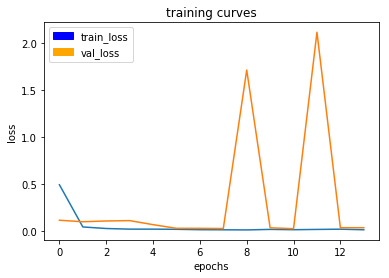

120/120 [==============================] - 78s - loss: 0.0159 - val_loss: 0.0375
Epoch 15/30
119/120 [============================>.] - ETA: 0s - loss: 0.0391

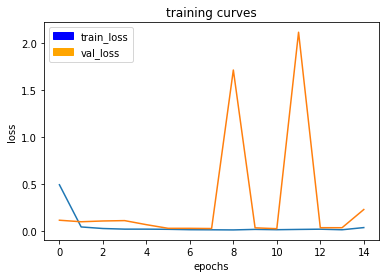

120/120 [==============================] - 78s - loss: 0.0390 - val_loss: 0.2306
Epoch 16/30
119/120 [============================>.] - ETA: 0s - loss: 0.0238

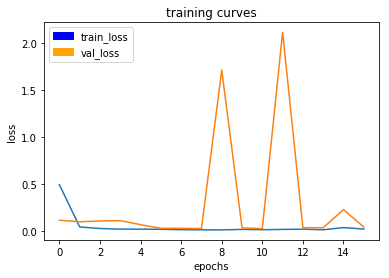

120/120 [==============================] - 78s - loss: 0.0238 - val_loss: 0.0443
Epoch 17/30
119/120 [============================>.] - ETA: 0s - loss: 0.0199

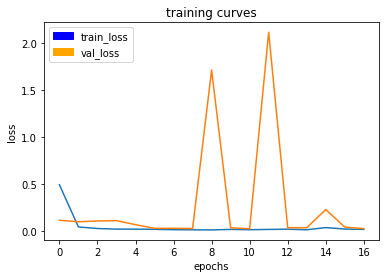

120/120 [==============================] - 77s - loss: 0.0199 - val_loss: 0.0281
Epoch 18/30
119/120 [============================>.] - ETA: 0s - loss: 0.0179

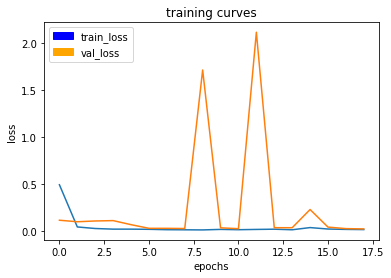

120/120 [==============================] - 77s - loss: 0.0179 - val_loss: 0.0250
Epoch 19/30
119/120 [============================>.] - ETA: 0s - loss: 0.0169

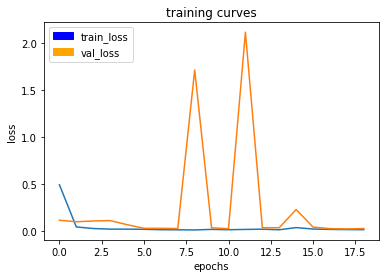

120/120 [==============================] - 77s - loss: 0.0169 - val_loss: 0.0288
Epoch 20/30
119/120 [============================>.] - ETA: 0s - loss: 0.0153

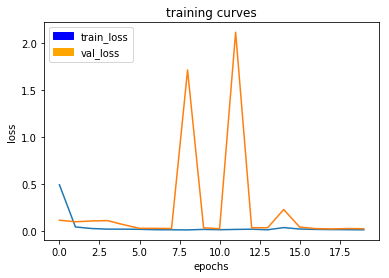

120/120 [==============================] - 77s - loss: 0.0153 - val_loss: 0.0270
Epoch 21/30
119/120 [============================>.] - ETA: 0s - loss: 0.0147

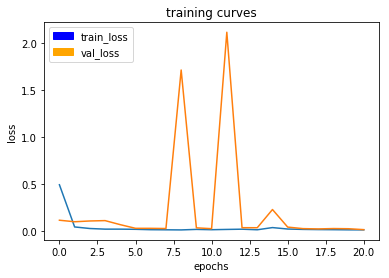

120/120 [==============================] - 78s - loss: 0.0146 - val_loss: 0.0173
Epoch 22/30
119/120 [============================>.] - ETA: 0s - loss: 0.0147

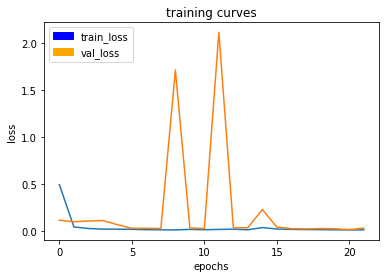

120/120 [==============================] - 77s - loss: 0.0147 - val_loss: 0.0335
Epoch 23/30
119/120 [============================>.] - ETA: 0s - loss: 0.0136

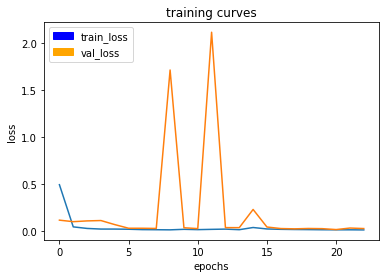

120/120 [==============================] - 78s - loss: 0.0136 - val_loss: 0.0280
Epoch 24/30
119/120 [============================>.] - ETA: 0s - loss: 0.0131

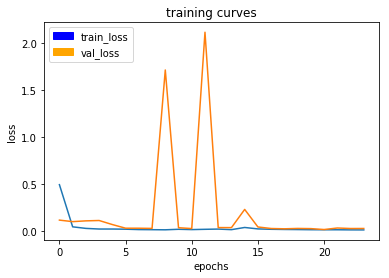

120/120 [==============================] - 78s - loss: 0.0131 - val_loss: 0.0284
Epoch 25/30
119/120 [============================>.] - ETA: 0s - loss: 0.0128

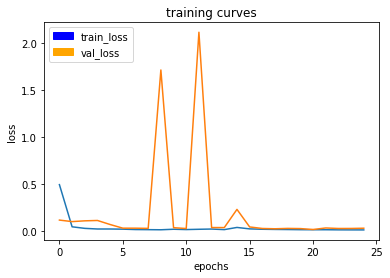

120/120 [==============================] - 78s - loss: 0.0128 - val_loss: 0.0308
Epoch 26/30
119/120 [============================>.] - ETA: 0s - loss: 0.0124

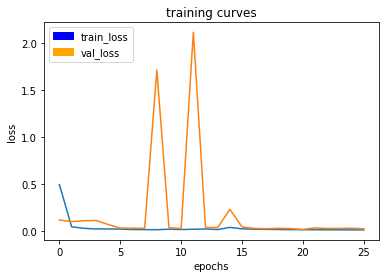

120/120 [==============================] - 78s - loss: 0.0124 - val_loss: 0.0245
Epoch 27/30
119/120 [============================>.] - ETA: 0s - loss: 0.0124

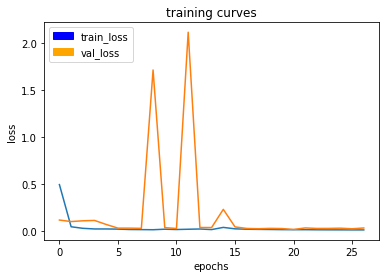

120/120 [==============================] - 77s - loss: 0.0124 - val_loss: 0.0329
Epoch 28/30
119/120 [============================>.] - ETA: 0s - loss: 0.0121

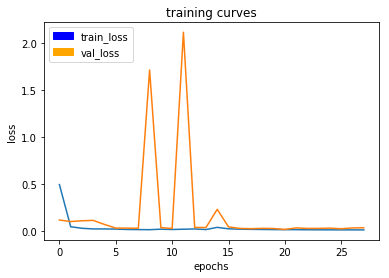

120/120 [==============================] - 77s - loss: 0.0120 - val_loss: 0.0350
Epoch 29/30
119/120 [============================>.] - ETA: 0s - loss: 0.0118

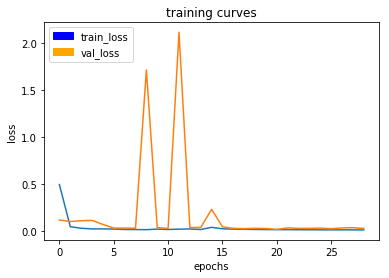

120/120 [==============================] - 77s - loss: 0.0118 - val_loss: 0.0282
Epoch 30/30
119/120 [============================>.] - ETA: 0s - loss: 0.0115

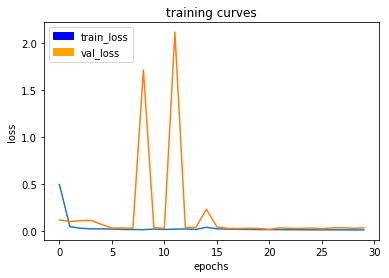

120/120 [==============================] - 78s - loss: 0.0115 - val_loss: 0.0327


In [16]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined_o'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation_o'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [17]:
end = time.time()

In [18]:
print(end - start)

2345.7334382534027


In [31]:
# Save your trained model weights
weight_file_name = 'model_weights_lr_001_bs_64_e30_spe_120_vs_20_run_1.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [32]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [33]:
run_num = 'run_1'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

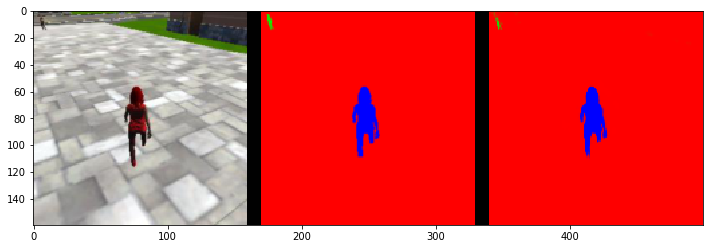

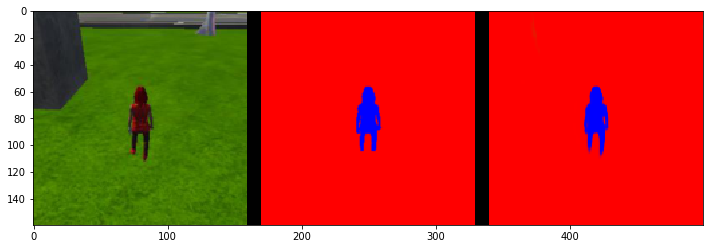

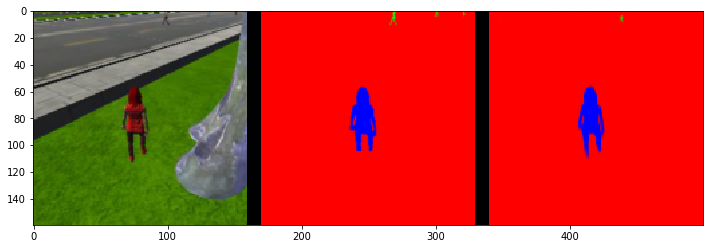

In [34]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

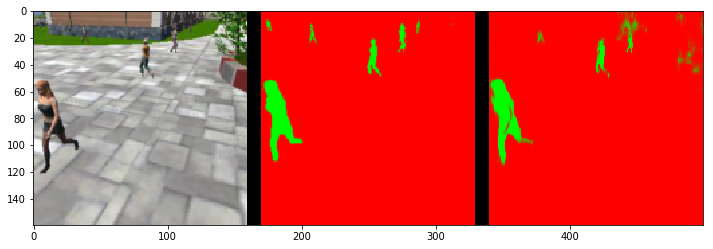

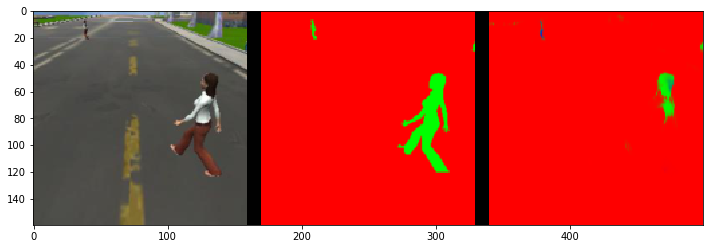

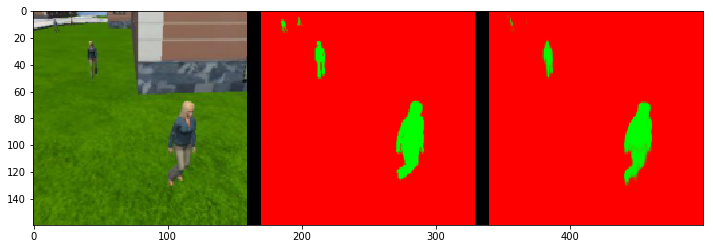

In [35]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

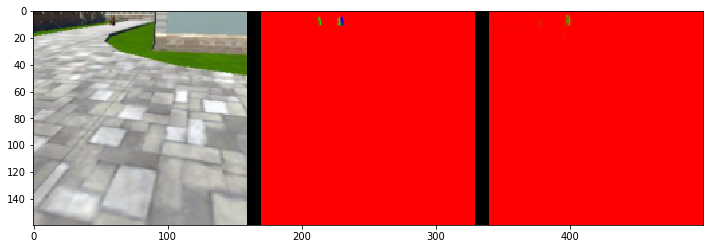

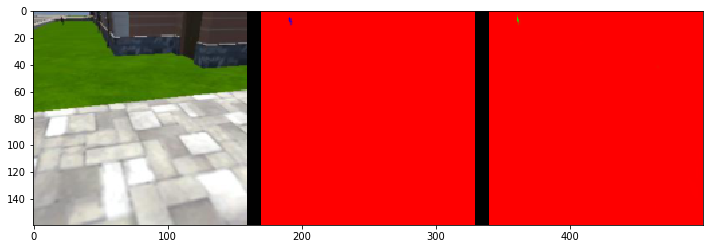

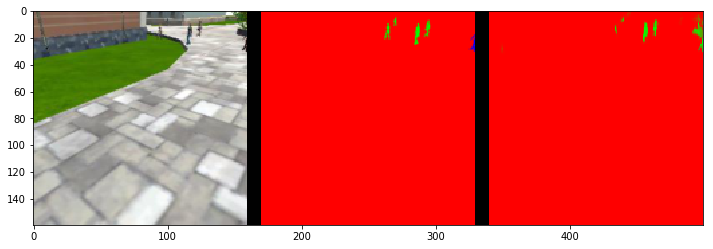

In [36]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [37]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9956130650231355
average intersection over union for other people is 0.3512304142859153
average intersection over union for the hero is 0.8973898323889773
number true positives: 539, number false positives: 0, number false negatives: 0


In [38]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9896241801712514
average intersection over union for other people is 0.7886965534573893
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 19, number false negatives: 0


In [39]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9966072683714445
average intersection over union for other people is 0.4325896258440642
average intersection over union for the hero is 0.19563901707972847
number true positives: 109, number false positives: 0, number false negatives: 192


In [40]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.7543655413271245


In [41]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.5465144247343529


In [42]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.4122716498578121


In [43]:
learning_rate = 0.005
batch_size = 64
num_epochs = 10
steps_per_epoch = 150
validation_steps = 40
workers = 2

In [44]:
import time
start = time.time()

In [45]:
output_layer = fcn_model_vgg(inputs, num_classes)

Epoch 1/10
149/150 [============================>.] - ETA: 0s - loss: 0.1601

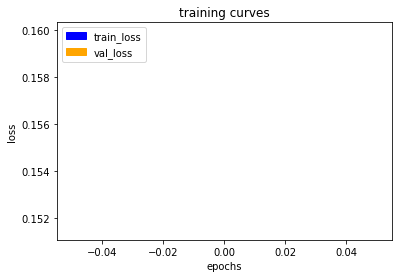

150/150 [==============================] - 97s - loss: 0.1592 - val_loss: 0.1515
Epoch 2/10
149/150 [============================>.] - ETA: 0s - loss: 0.0320

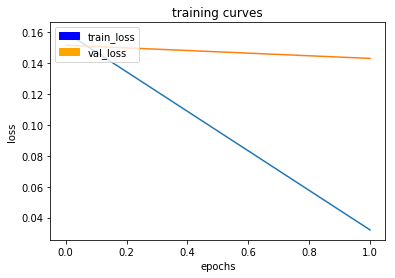

150/150 [==============================] - 99s - loss: 0.0320 - val_loss: 0.1430
Epoch 3/10
149/150 [============================>.] - ETA: 0s - loss: 0.0251

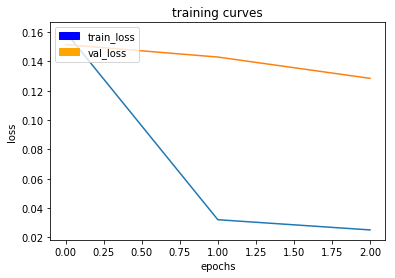

150/150 [==============================] - 99s - loss: 0.0251 - val_loss: 0.1285
Epoch 4/10
149/150 [============================>.] - ETA: 0s - loss: 0.0224

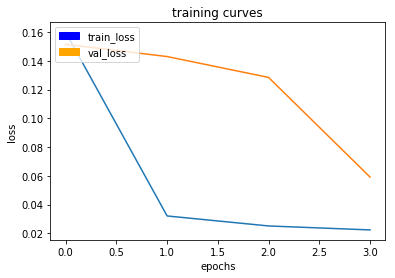

150/150 [==============================] - 99s - loss: 0.0223 - val_loss: 0.0591
Epoch 5/10
149/150 [============================>.] - ETA: 0s - loss: 0.0204

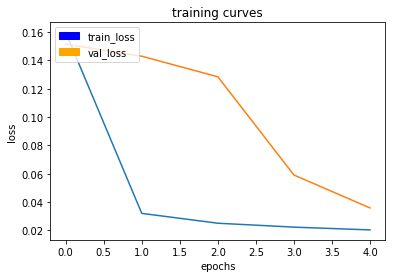

150/150 [==============================] - 100s - loss: 0.0204 - val_loss: 0.0359
Epoch 6/10
149/150 [============================>.] - ETA: 0s - loss: 0.0203

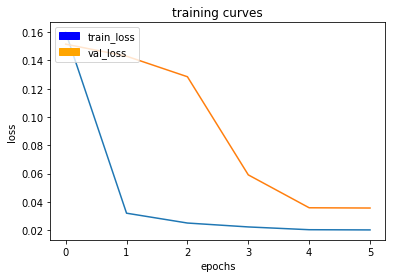

150/150 [==============================] - 99s - loss: 0.0202 - val_loss: 0.0357
Epoch 7/10
149/150 [============================>.] - ETA: 0s - loss: 0.0187

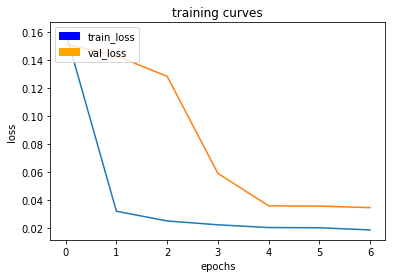

150/150 [==============================] - 99s - loss: 0.0187 - val_loss: 0.0346
Epoch 8/10
149/150 [============================>.] - ETA: 0s - loss: 0.0165

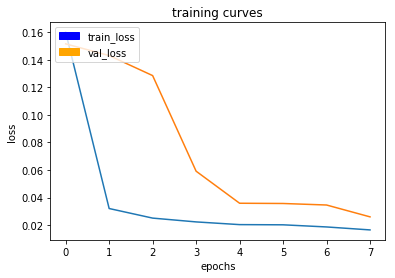

150/150 [==============================] - 99s - loss: 0.0165 - val_loss: 0.0260
Epoch 9/10
149/150 [============================>.] - ETA: 0s - loss: 0.0144

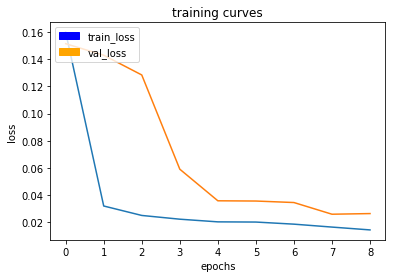

150/150 [==============================] - 99s - loss: 0.0144 - val_loss: 0.0265
Epoch 10/10
149/150 [============================>.] - ETA: 0s - loss: 0.0129

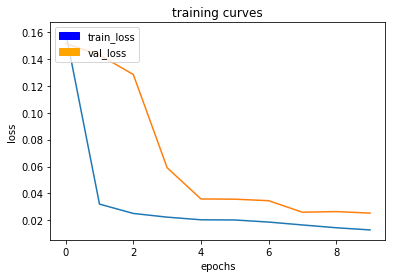

150/150 [==============================] - 99s - loss: 0.0128 - val_loss: 0.0254


In [46]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined_o'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation_o'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [47]:
end = time.time()

In [48]:
print(end - start)

999.5520370006561


In [49]:
# Save your trained model weights
weight_file_name = 'model_weights_lr_005_bs_64_e10_spe_150_vs_40_run_2.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [50]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [51]:
run_num = 'run_2'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

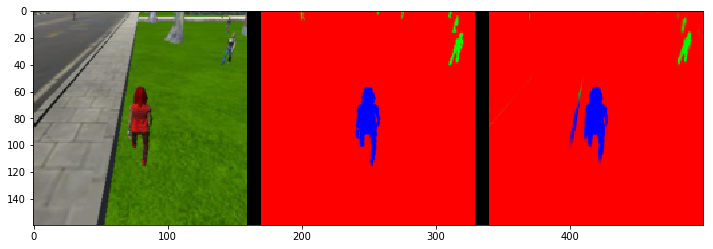

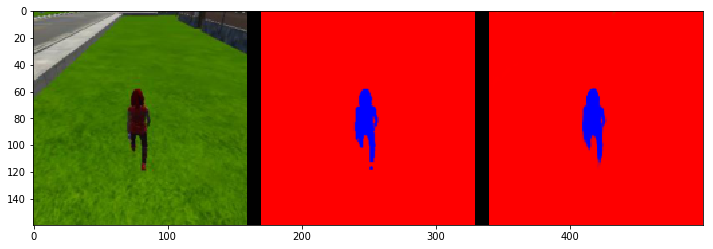

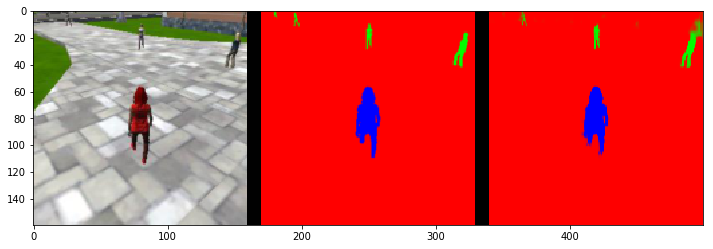

In [52]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

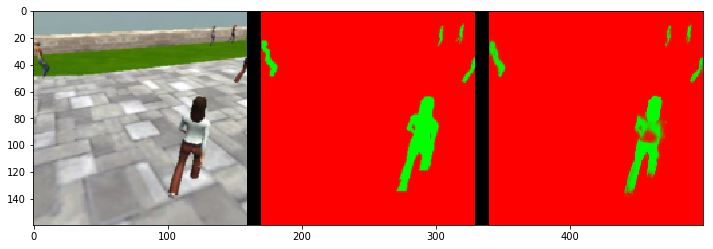

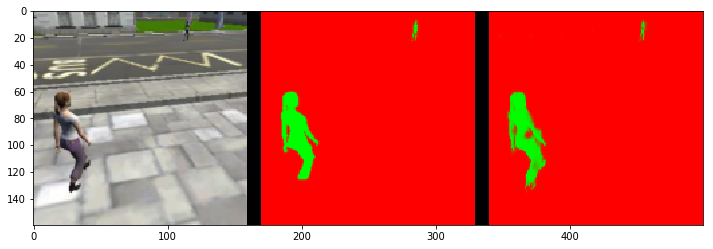

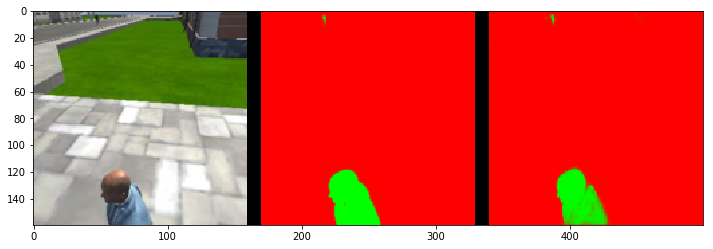

In [53]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

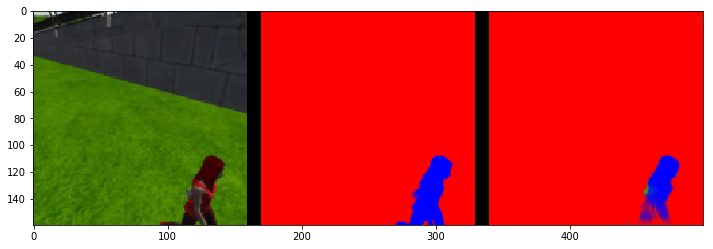

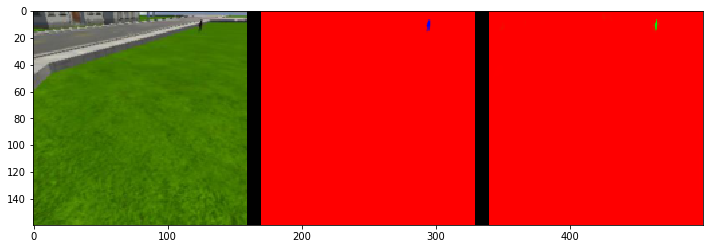

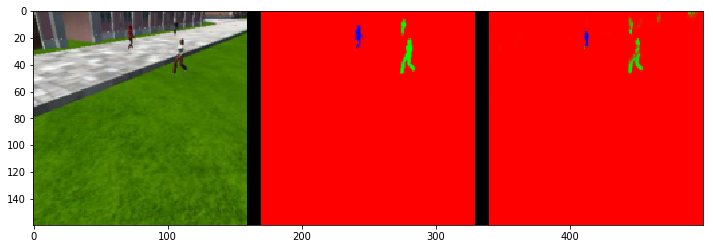

In [54]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [55]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9957060597529372
average intersection over union for other people is 0.37819179590277147
average intersection over union for the hero is 0.911164449234461
number true positives: 539, number false positives: 0, number false negatives: 0


In [56]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9896640684427059
average intersection over union for other people is 0.7996321115840819
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 17, number false negatives: 0


In [57]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9969127481559359
average intersection over union for other people is 0.4615751050307975
average intersection over union for the hero is 0.22296034869060313
number true positives: 124, number false positives: 0, number false negatives: 177


In [58]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.7736289381563594


In [59]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.5670623989625321


In [60]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.4386958815777815


In [301]:
learning_rate = 0.005
batch_size = 64
num_epochs = 20
steps_per_epoch = 150
validation_steps = 40
workers = 2

In [302]:
import time
start = time.time()

In [303]:
output_layer = fcn_model_vgg(inputs, num_classes)

Epoch 1/20
149/150 [============================>.] - ETA: 0s - loss: 0.1605

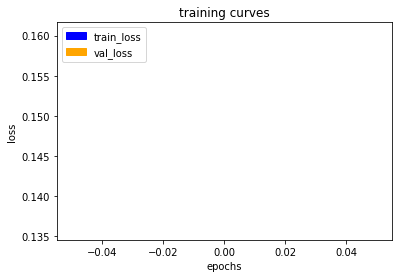

150/150 [==============================] - 98s - loss: 0.1597 - val_loss: 0.1357
Epoch 2/20
149/150 [============================>.] - ETA: 0s - loss: 0.0303

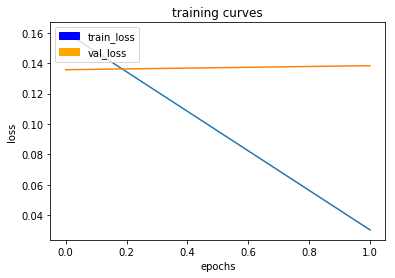

150/150 [==============================] - 99s - loss: 0.0303 - val_loss: 0.1384
Epoch 3/20
149/150 [============================>.] - ETA: 0s - loss: 0.0241

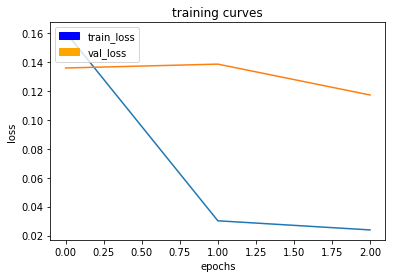

150/150 [==============================] - 100s - loss: 0.0240 - val_loss: 0.1171
Epoch 4/20
149/150 [============================>.] - ETA: 0s - loss: 0.0214

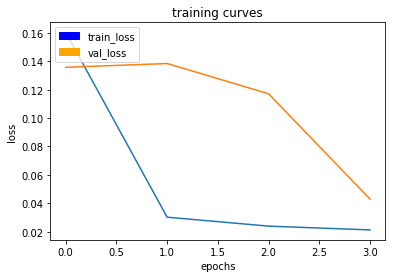

150/150 [==============================] - 99s - loss: 0.0214 - val_loss: 0.0429
Epoch 5/20
149/150 [============================>.] - ETA: 0s - loss: 0.0205

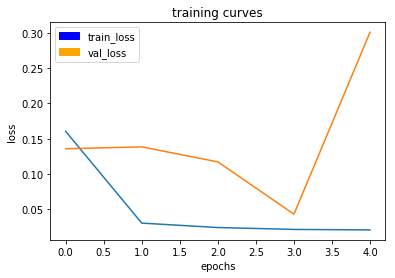

150/150 [==============================] - 100s - loss: 0.0206 - val_loss: 0.3010
Epoch 6/20
149/150 [============================>.] - ETA: 0s - loss: 0.0242

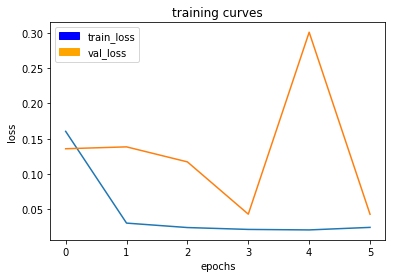

150/150 [==============================] - 99s - loss: 0.0242 - val_loss: 0.0428
Epoch 7/20
149/150 [============================>.] - ETA: 0s - loss: 0.0170

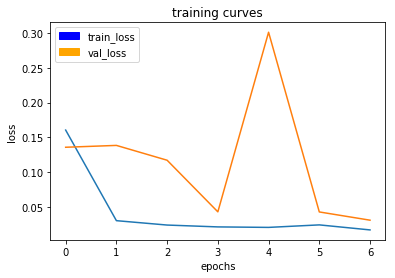

150/150 [==============================] - 99s - loss: 0.0170 - val_loss: 0.0309
Epoch 8/20
149/150 [============================>.] - ETA: 0s - loss: 0.0145

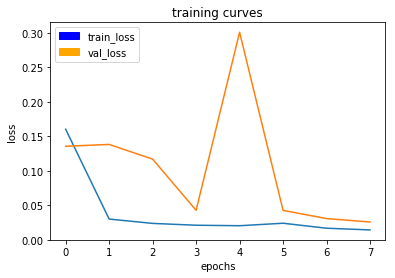

150/150 [==============================] - 100s - loss: 0.0145 - val_loss: 0.0260
Epoch 9/20
149/150 [============================>.] - ETA: 0s - loss: 0.0132

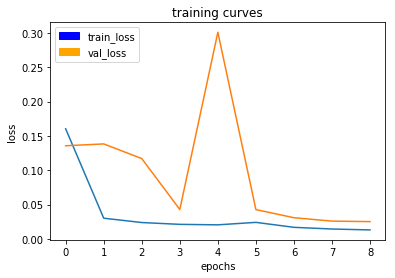

150/150 [==============================] - 100s - loss: 0.0132 - val_loss: 0.0253
Epoch 10/20
149/150 [============================>.] - ETA: 0s - loss: 0.0123

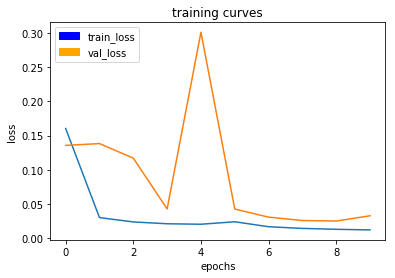

150/150 [==============================] - 99s - loss: 0.0123 - val_loss: 0.0329
Epoch 11/20
149/150 [============================>.] - ETA: 0s - loss: 0.0117

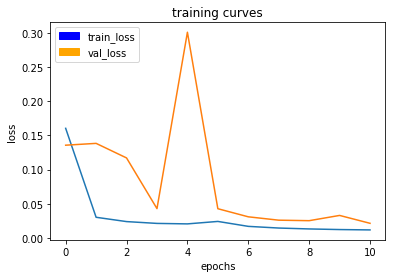

150/150 [==============================] - 100s - loss: 0.0117 - val_loss: 0.0214
Epoch 12/20
149/150 [============================>.] - ETA: 0s - loss: 0.0195

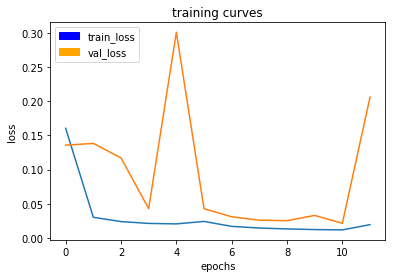

150/150 [==============================] - 99s - loss: 0.0195 - val_loss: 0.2060
Epoch 13/20
149/150 [============================>.] - ETA: 0s - loss: 0.0168

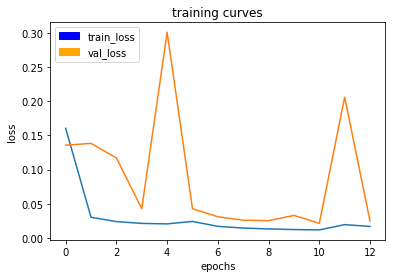

150/150 [==============================] - 100s - loss: 0.0168 - val_loss: 0.0247
Epoch 14/20
149/150 [============================>.] - ETA: 0s - loss: 0.0131

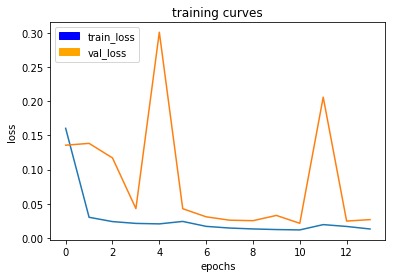

150/150 [==============================] - 100s - loss: 0.0131 - val_loss: 0.0268
Epoch 15/20
149/150 [============================>.] - ETA: 0s - loss: 0.0117

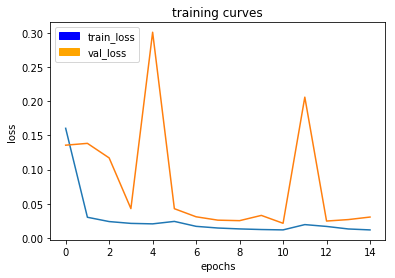

150/150 [==============================] - 100s - loss: 0.0117 - val_loss: 0.0305
Epoch 16/20
149/150 [============================>.] - ETA: 0s - loss: 0.0110

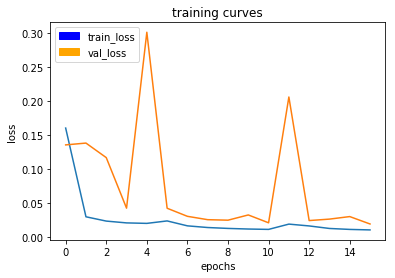

150/150 [==============================] - 100s - loss: 0.0110 - val_loss: 0.0197
Epoch 17/20
149/150 [============================>.] - ETA: 0s - loss: 0.0106

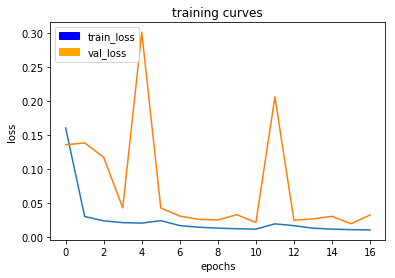

150/150 [==============================] - 100s - loss: 0.0106 - val_loss: 0.0325
Epoch 18/20
149/150 [============================>.] - ETA: 0s - loss: 0.0102

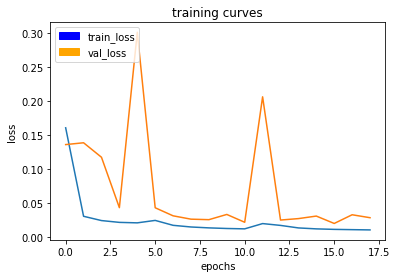

150/150 [==============================] - 99s - loss: 0.0102 - val_loss: 0.0281
Epoch 19/20
149/150 [============================>.] - ETA: 0s - loss: 0.0100

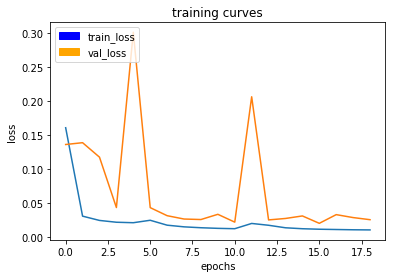

150/150 [==============================] - 99s - loss: 0.0100 - val_loss: 0.0250
Epoch 20/20
149/150 [============================>.] - ETA: 0s - loss: 0.0101

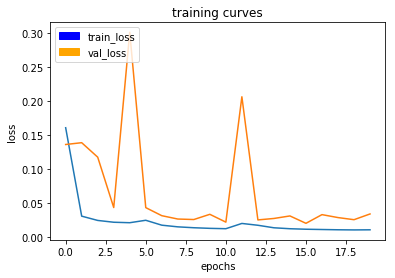

150/150 [==============================] - 99s - loss: 0.0101 - val_loss: 0.0335


In [304]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data
train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train_combined_o'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation_o'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [305]:
end = time.time()

In [306]:
print(end - start)

2002.777186870575


In [307]:
# Save your trained model weights
weight_file_name = 'model_weights_lr_005_bs_64_e20_spe_150_vs_40_run_3.h5'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [308]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

# weight_file_name = 'model_weights'
# restored_model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [309]:
run_num = 'run_3'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

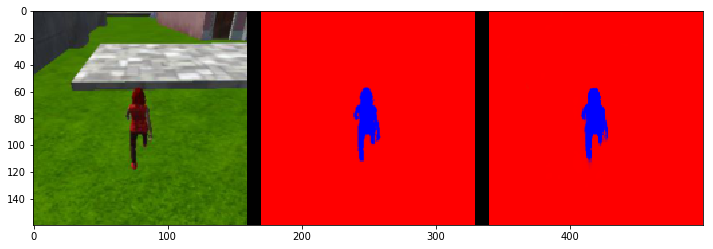

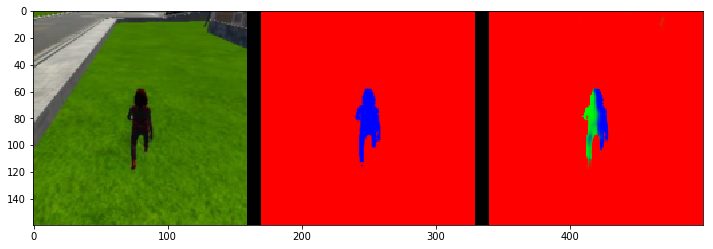

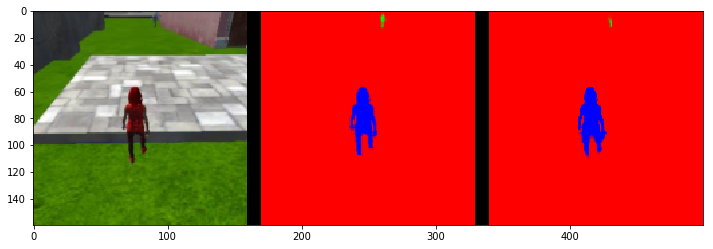

In [310]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

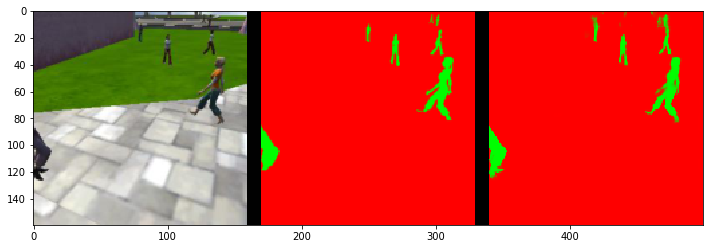

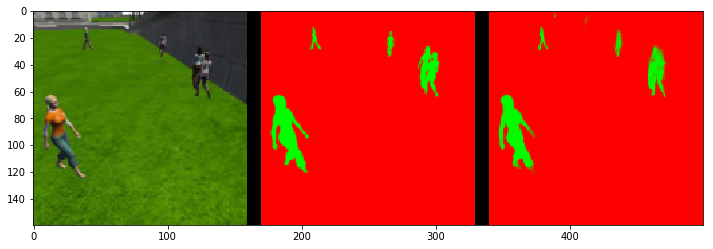

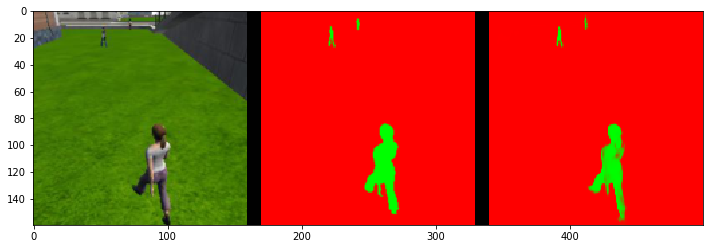

In [311]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

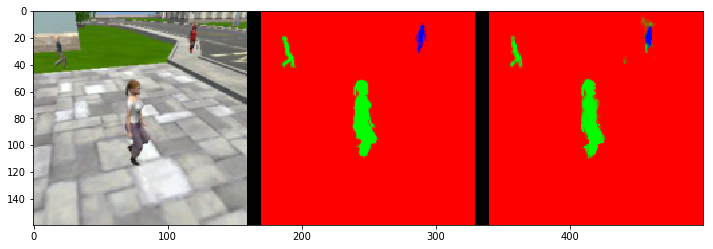

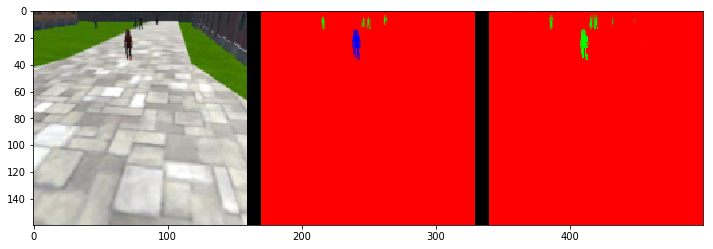

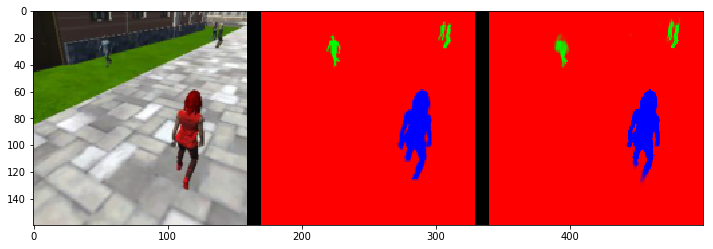

In [312]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [313]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9960480063761674
average intersection over union for other people is 0.40062473821686034
average intersection over union for the hero is 0.9150261478449879
number true positives: 539, number false positives: 0, number false negatives: 0


In [314]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9904106610753152
average intersection over union for other people is 0.8047710809852892
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 39, number false negatives: 0


In [315]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9970577072399094
average intersection over union for other people is 0.4786325517494386
average intersection over union for the hero is 0.29430762219403206
number true positives: 155, number false positives: 1, number false negatives: 146


In [316]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.7886363636363637


In [317]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.60466688501951


In [318]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.47686229341311365
